In [3]:
import numpy as np
import cv2
import pandas as pd
import string
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.layers import Dense, LSTM, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional
from keras.models import Model
from keras.activations import relu, sigmoid, softmax
import keras.backend as K
from keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint
import tensorflow as tf

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [38]:
with open('dataiam/iam_words/words.txt') as f:
    contents = f.readlines()

lines = [line.strip() for line in contents][18:]
lines[0]

'a01-000u-00-00 ok 154 408 768 27 51 AT A'

In [39]:
max_label_len = 0

char_list = "!\"#&'()*+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz" 

print(char_list, len(char_list))

def encode_to_labels(txt):
    # encoding each output word into digits
    dig_lst = []
    for index, chara in enumerate(txt):
        dig_lst.append(char_list.index(chara))
        
    return dig_lst

!"#&'()*+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz 78


In [40]:
images = []
labels = []

RECORDS_COUNT = 5000

In [41]:
train_images = []
train_labels = []
train_input_length = []
train_label_length = []
train_original_text = []

valid_images = []
valid_labels = []
valid_input_length = []
valid_label_length = []
valid_original_text = []

inputs_length = []
labels_length = []

In [42]:
def process_image(img):
    """
    Converts image to shape (32, 128, 1) & normalize
    """
    w, h = img.shape
    
    
    # Aspect Ratio Calculation
    new_w = 32
    new_h = int(h * (new_w / w))
    img = cv2.resize(img, (new_h, new_w))
    w, h = img.shape
    
    img = img.astype('float32')
    
    # Converts each to (32, 128, 1)
    if w < 32:
        add_zeros = np.full((32-w, h), 255)
        img = np.concatenate((img, add_zeros))
        w, h = img.shape
    
    if h < 128:
        add_zeros = np.full((w, 128-h), 255)
        img = np.concatenate((img, add_zeros), axis=1)
        w, h = img.shape
        
    if h > 128 or w > 32:
        dim = (128,32)
        img = cv2.resize(img, dim)
    
    img = cv2.subtract(255, img)
    
    img = np.expand_dims(img, axis=2)
    
    # Normalize 
    img = img / 255
    
    return img

In [43]:
for index, line in enumerate(lines):
    splits = line.split(' ')
    status = splits[1]
    
    if status == 'ok':
        word_id = splits[0]
        word = "".join(splits[8:])
        
        splits_id = word_id.split('-')
        filepath = 'dataiam/iam_words/words/{}/{}-{}/{}.png'.format(splits_id[0], 
                                                  splits_id[0], 
                                                  splits_id[1], 
                                                  word_id)
        
        # processing on image
        img = cv2.imread(filepath, cv2.IMREAD_GRAYSCALE)
        try:
            img = process_image(img)
        except:
            continue
            
        # processing on label
        try:
            label = encode_to_labels(word)
        except:
            continue
        
        if index % 10 == 0:
            valid_images.append(img)
            valid_labels.append(label)
            valid_input_length.append(31)
            valid_label_length.append(len(word))
            valid_original_text.append(word)
        else:
            train_images.append(img)
            train_labels.append(label)
            train_input_length.append(31)
            train_label_length.append(len(word))
            train_original_text.append(word)
        
        if len(word) > max_label_len:
            max_label_len = len(word)
    
    if index >= RECORDS_COUNT:
        break

In [44]:
train_padded_label = pad_sequences(train_labels, 
                             maxlen=max_label_len, 
                             padding='post',
                             value=len(char_list))

valid_padded_label = pad_sequences(valid_labels, 
                             maxlen=max_label_len, 
                             padding='post',
                             value=len(char_list))

In [45]:
train_padded_label.shape, valid_padded_label.shape

((3914, 16), (437, 16))

In [46]:

train_images = np.asarray(train_images)
train_input_length = np.asarray(train_input_length)
train_label_length = np.asarray(train_label_length)

valid_images = np.asarray(valid_images)
valid_input_length = np.asarray(valid_input_length)
valid_label_length = np.asarray(valid_label_length)

In [47]:
train_images.shape

(3914, 32, 128, 1)

In [48]:
# input with shape of height=32 and width=128 
inputs = Input(shape=(32,128,1))
 
# convolution layer with kernel size (3,3)
conv_1 = Conv2D(64, (3,3), activation = 'relu', padding='same')(inputs)
# poolig layer with kernel size (2,2)
pool_1 = MaxPool2D(pool_size=(2, 2), strides=2)(conv_1)
 
conv_2 = Conv2D(128, (3,3), activation = 'relu', padding='same')(pool_1)
pool_2 = MaxPool2D(pool_size=(2, 2), strides=2)(conv_2)
 
conv_3 = Conv2D(256, (3,3), activation = 'relu', padding='same')(pool_2)
 
conv_4 = Conv2D(256, (3,3), activation = 'relu', padding='same')(conv_3)

# poolig layer with kernel size (2,1)
pool_4 = MaxPool2D(pool_size=(2, 1))(conv_4)
 
conv_5 = Conv2D(512, (3,3), activation = 'relu', padding='same')(pool_4)

# Batch normalization layer
batch_norm_5 = BatchNormalization()(conv_5)
 
conv_6 = Conv2D(512, (3,3), activation = 'relu', padding='same')(batch_norm_5)
batch_norm_6 = BatchNormalization()(conv_6)
pool_6 = MaxPool2D(pool_size=(2, 1))(batch_norm_6)
 
conv_7 = Conv2D(512, (2,2), activation = 'relu')(pool_6)
 
squeezed = Lambda(lambda x: K.squeeze(x, 1))(conv_7)
 
# bidirectional LSTM layers with units=128
blstm_1 = Bidirectional(LSTM(256, return_sequences=True, dropout = 0.2))(squeezed)
blstm_2 = Bidirectional(LSTM(256, return_sequences=True, dropout = 0.2))(blstm_1)
 
outputs = Dense(len(char_list)+1, activation = 'softmax')(blstm_2)

# model to be used at test time
act_model = Model(inputs, outputs)
act_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 32, 128, 1)]      0         
                                                                 
 conv2d_7 (Conv2D)           (None, 32, 128, 64)       640       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 16, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 16, 64, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 8, 32, 128)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 8, 32, 256)        2951

In [49]:
the_labels = Input(name='the_labels', shape=[max_label_len], dtype='float32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    
    return K.ctc_batch_cost(labels, y_pred, input_length, label_length)

loss_out = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([outputs, the_labels, input_length, label_length])

#model to be used at training time
model = Model(inputs=[inputs, the_labels, input_length, label_length], outputs=loss_out)

In [50]:
batch_size = 8
epochs = 30
e = str(epochs)
optimizer_name = 'sgd'

In [51]:
checkpoint_directory = 'working/checkpoint_1/' 

# Create the directory if it doesn't exist
if not os.path.exists(checkpoint_directory):
    os.makedirs(checkpoint_directory)


In [52]:
model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer = optimizer_name, metrics=['accuracy'])

filepath="working/checkpoint_1/{}o-{}r-{}e-{}t-{}v.hdf5".format(optimizer_name,
                                          str(RECORDS_COUNT),
                                          str(epochs),
                                          str(train_images.shape[0]),
                                          str(valid_images.shape[0]))

checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
callbacks_list = [checkpoint]

In [53]:
history = model.fit(x=[train_images, train_padded_label, train_input_length, train_label_length],
                    y=np.zeros(len(train_images)),
                    batch_size=batch_size, 
                    epochs=epochs, 
                    validation_data=([valid_images, valid_padded_label, valid_input_length, valid_label_length], [np.zeros(len(valid_images))]),
                    verbose=2,
                    callbacks=callbacks_list)

Epoch 1/30

Epoch 1: val_loss improved from inf to 16.92040, saving model to working/checkpoint_1\sgdo-5000r-30e-3914t-437v.hdf5
490/490 - 153s - loss: 16.8996 - accuracy: 0.0000e+00 - val_loss: 16.9204 - val_accuracy: 0.0000e+00 - 153s/epoch - 313ms/step
Epoch 2/30

Epoch 2: val_loss improved from 16.92040 to 15.70340, saving model to working/checkpoint_1\sgdo-5000r-30e-3914t-437v.hdf5
490/490 - 148s - loss: 14.6913 - accuracy: 0.0000e+00 - val_loss: 15.7034 - val_accuracy: 0.0000e+00 - 148s/epoch - 302ms/step
Epoch 3/30

Epoch 3: val_loss improved from 15.70340 to 13.98469, saving model to working/checkpoint_1\sgdo-5000r-30e-3914t-437v.hdf5
490/490 - 148s - loss: 13.5046 - accuracy: 7.6648e-04 - val_loss: 13.9847 - val_accuracy: 0.0069 - 148s/epoch - 303ms/step
Epoch 4/30

Epoch 4: val_loss improved from 13.98469 to 13.47304, saving model to working/checkpoint_1\sgdo-5000r-30e-3914t-437v.hdf5
490/490 - 149s - loss: 12.5296 - accuracy: 0.0123 - val_loss: 13.4730 - val_accuracy: 0.0092

In [54]:

history_dict = {
    'epoch': list(range(1, len(history.history['loss']) + 1)),
    'loss': history.history['loss'],
    'accuracy': history.history['accuracy'],
    'val_loss': history.history['val_loss'],
    'val_accuracy': history.history['val_accuracy']
}
history_df = pd.DataFrame(history_dict)
excel_file_path = 'working/training_history.xlsx'  # Replace with your desired file path
history_df.to_excel(excel_file_path, index=False)

In [22]:
!pip install -q python-levenshtein

In [55]:
# load the saved best model weights
act_model.load_weights(filepath)

# predict outputs on validation images
prediction = act_model.predict(valid_images)
 
# use CTC decoder
decoded = K.ctc_decode(prediction, 
                       input_length=np.ones(prediction.shape[0]) * prediction.shape[1],
                       greedy=True)[0][0]
out = K.get_value(decoded)

import Levenshtein as lv

total_jaro = 0
total_rati = 0
# see the results
for i, x in enumerate(out):
    letters=''
    for p in x:
        if int(p) != -1:
            letters+=char_list[int(p)]
    total_jaro+=lv.jaro(letters, valid_original_text[i])
    total_rati+=lv.ratio(letters, valid_original_text[i])

print('jaro :', total_jaro/len(out))
print('ratio:', total_rati/len(out))

14/14 [==============================] - 3s 145ms/step
jaro : 0.9038906025748135
ratio: 0.8736613868160938


In [56]:
print(train_images.shape)

(3914, 32, 128, 1)


35/35 [==============================] - 5s 147ms/step
original_text =   week
predicted text = week

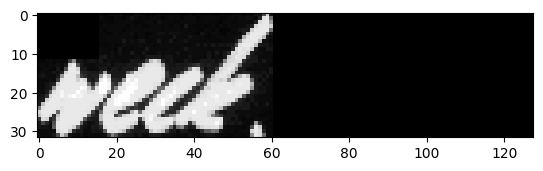



original_text =   A
predicted text = A

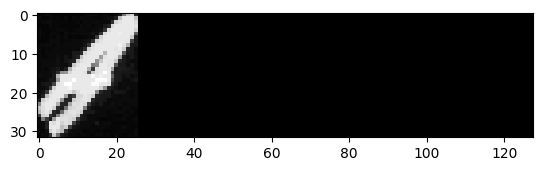



original_text =   big
predicted text = big

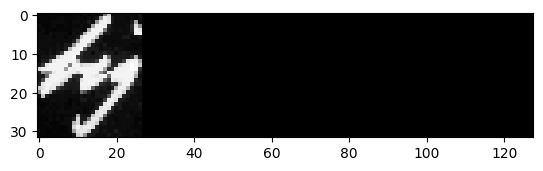



original_text =   payment
predicted text = payment

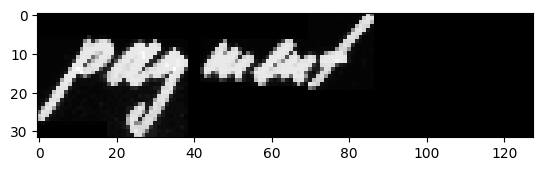



original_text =   of
predicted text = of

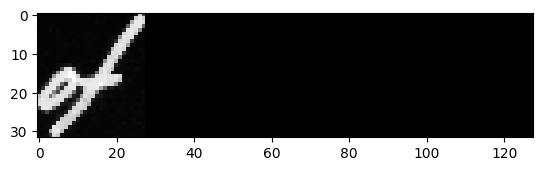



original_text =   a
predicted text = a

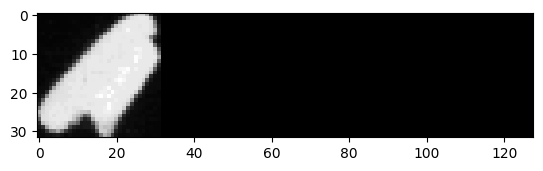



original_text =   210million
predicted text = 210million

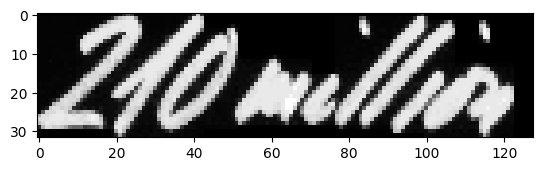



original_text =   debt
predicted text = debt

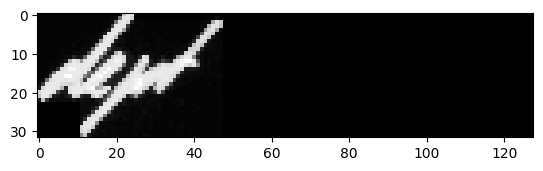



original_text =   to
predicted text = to

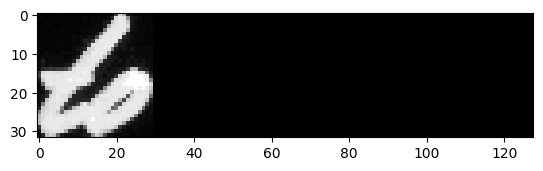



original_text =   America
predicted text = America

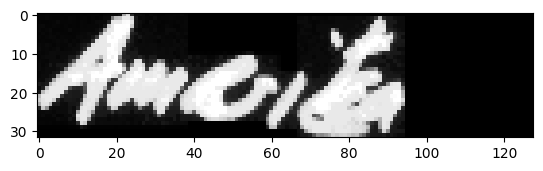



original_text =   United
predicted text = United

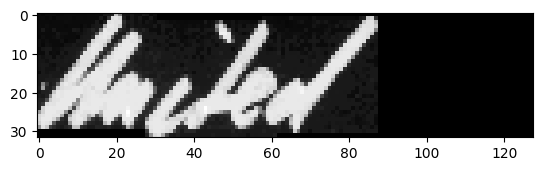



original_text =   States
predicted text = States

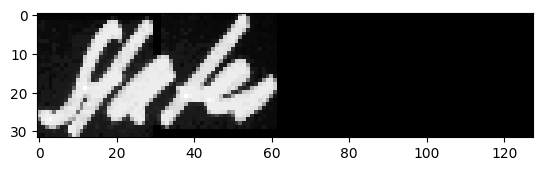



original_text =   officials
predicted text = officials

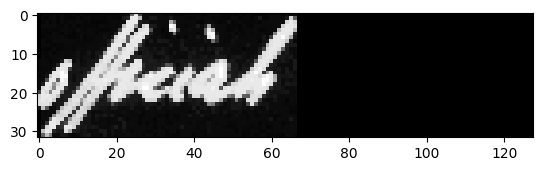



original_text =   quickly
predicted text = quickly

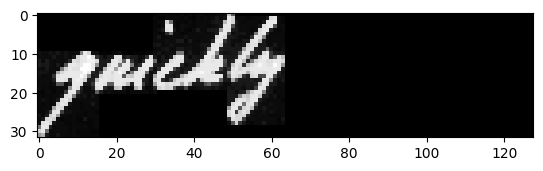



original_text =   point
predicted text = point

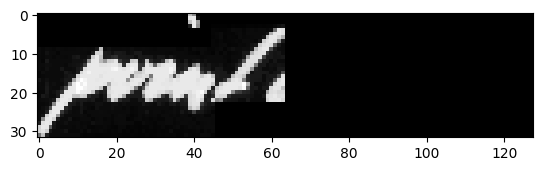



original_text =   out
predicted text = out

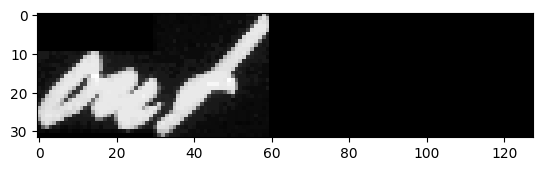



original_text =   that
predicted text = that

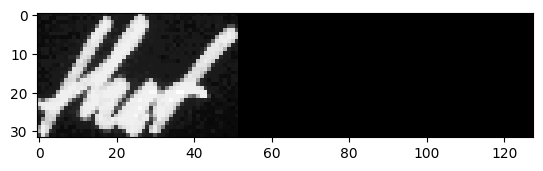



original_text =   this
predicted text = this

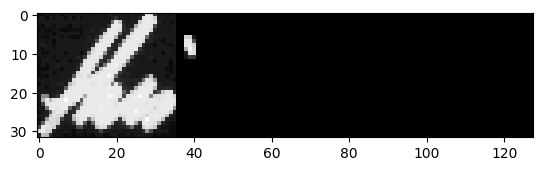



original_text =   is
predicted text = is

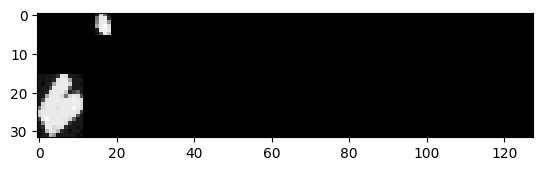



original_text =   due
predicted text = due

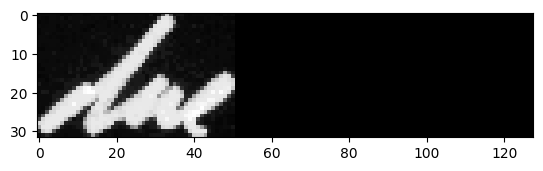



original_text =   to
predicted text = to

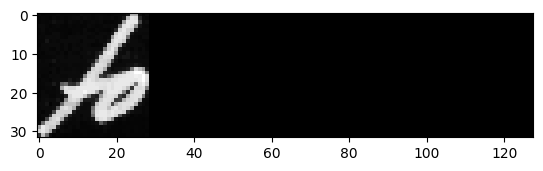



original_text =   America
predicted text = America

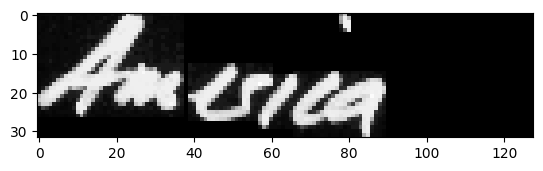



original_text =   anyway
predicted text = anyway

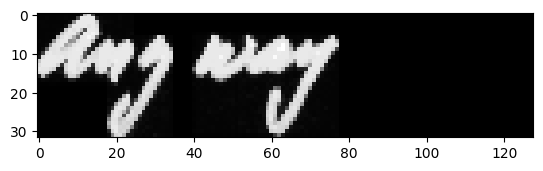



original_text =   .
predicted text = .

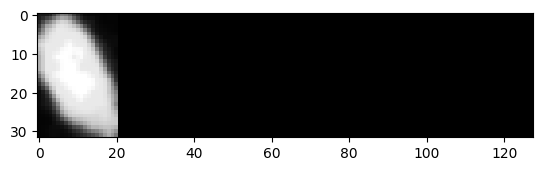



original_text =   level
predicted text = level

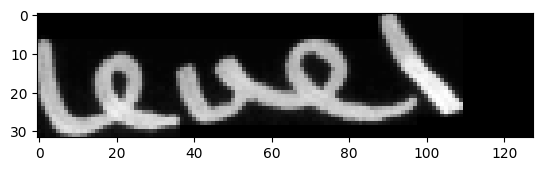



original_text =   than
predicted text = than

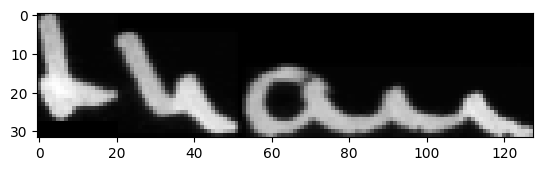



original_text =   in
predicted text = in

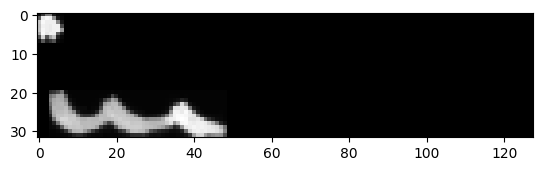



original_text =   the
predicted text = the

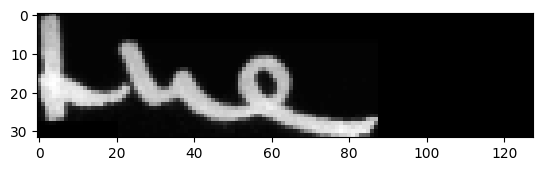



original_text =   past
predicted text = past

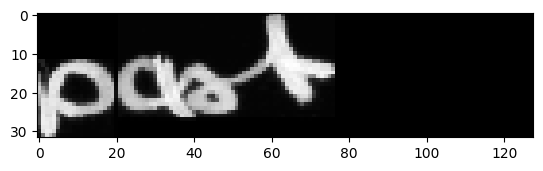



original_text =   "
predicted text = "

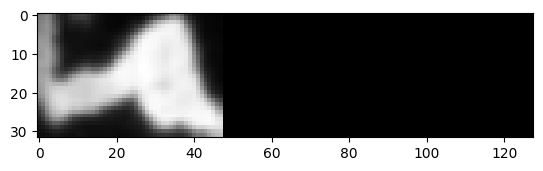



original_text =   be
predicted text = be

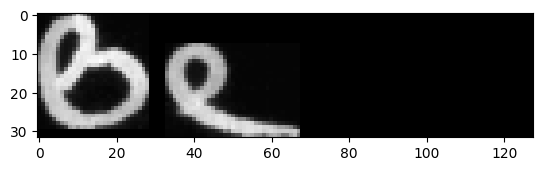



original_text =   useful
predicted text = useful

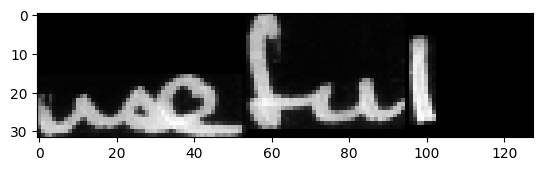



original_text =   .
predicted text = .

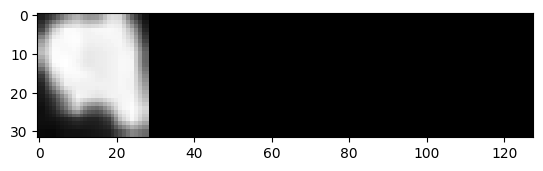



original_text =   The
predicted text = The

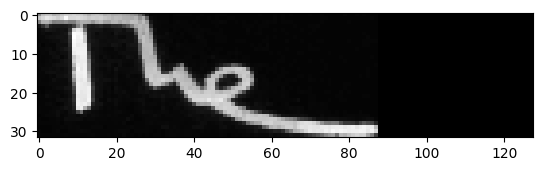



original_text =   President
predicted text = President

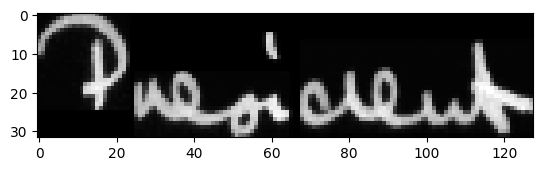



original_text =   will
predicted text = will

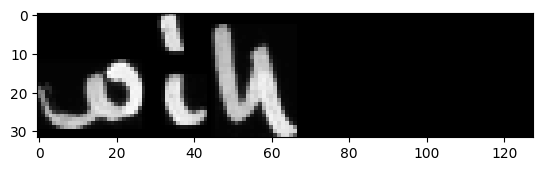



original_text =   probably
predicted text = probably

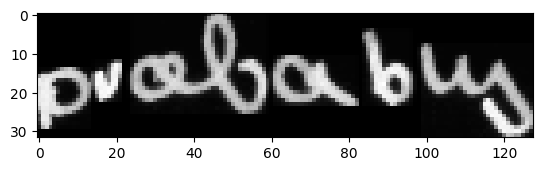



original_text =   discuss
predicted text = discuss

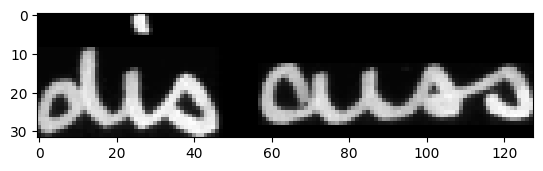



original_text =   the
predicted text = the

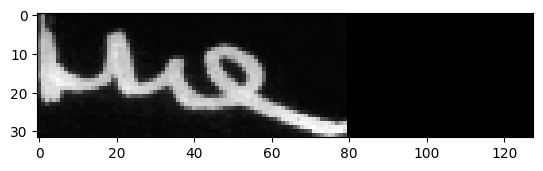



original_text =   with
predicted text = with

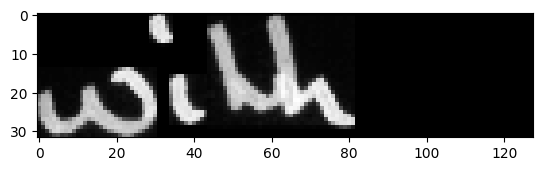



original_text =   Dr.
predicted text = Dr.

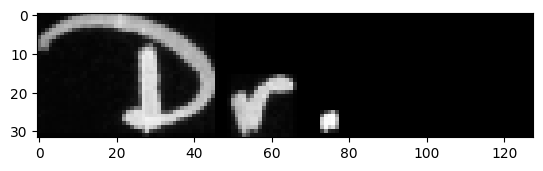



original_text =   Brentano
predicted text = Brentano

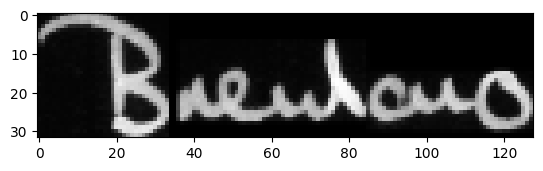



original_text =   ,
predicted text = ,

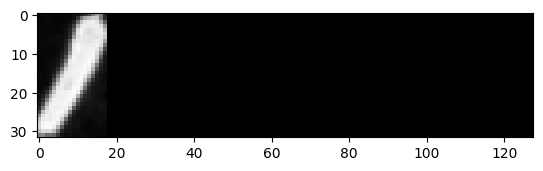



original_text =   the
predicted text = the

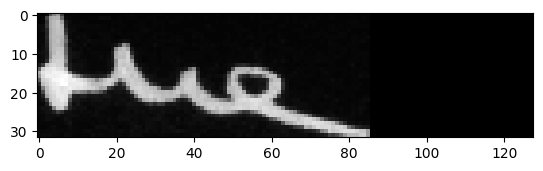



original_text =   West
predicted text = West

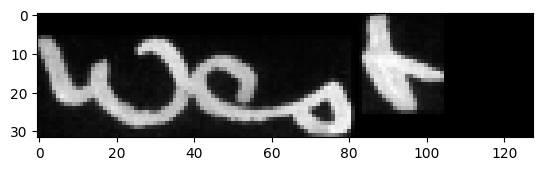



original_text =   German
predicted text = German

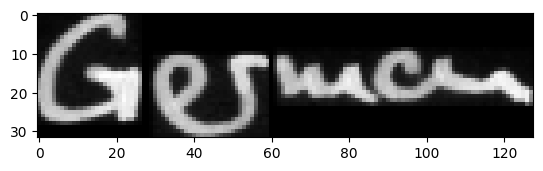



original_text =   Foreign
predicted text = Foreign

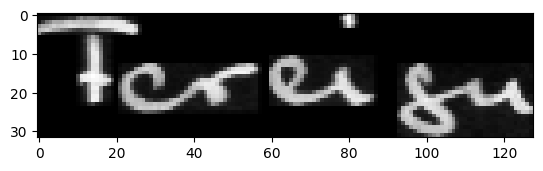



original_text =   Minister
predicted text = Minister

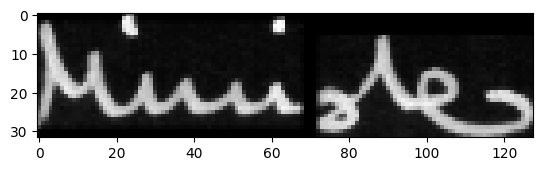



original_text =   who
predicted text = who

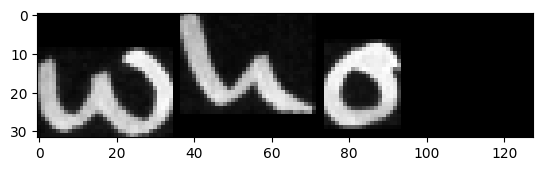



original_text =   is
predicted text = is

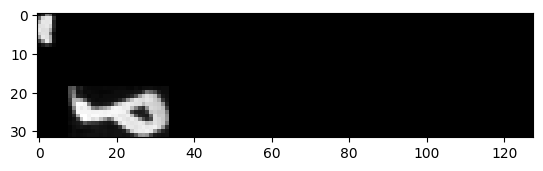



original_text =   due
predicted text = due

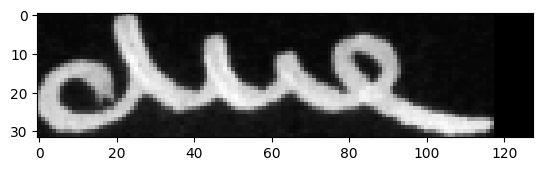



original_text =   in
predicted text = in

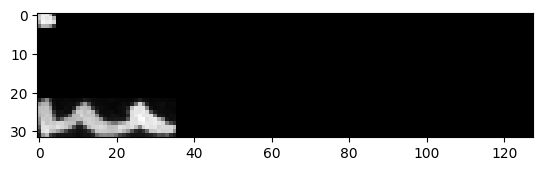



original_text =   Washington
predicted text = Washington

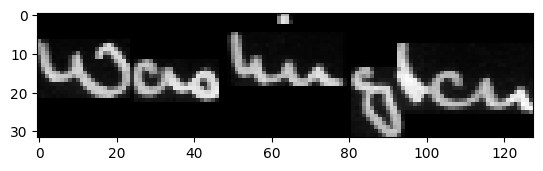



original_text =   next
predicted text = next

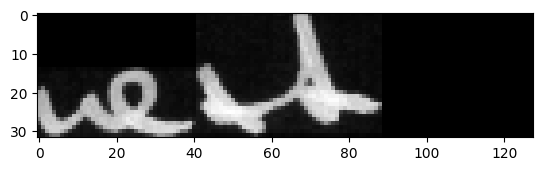



original_text =   week
predicted text = week

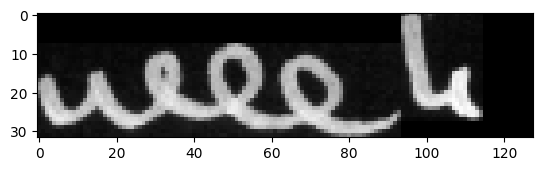



original_text =   .
predicted text = .

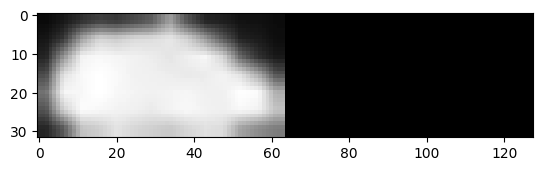



original_text =   A
predicted text = A

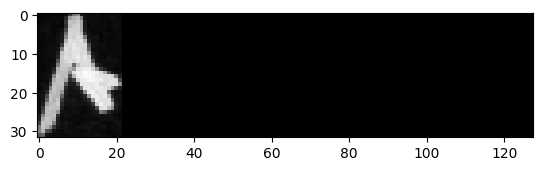



original_text =   slice
predicted text = slice

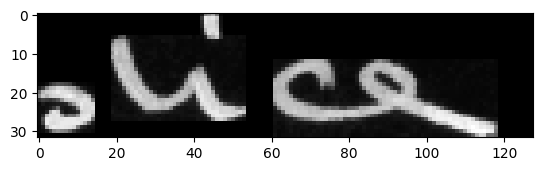



original_text =   of
predicted text = of

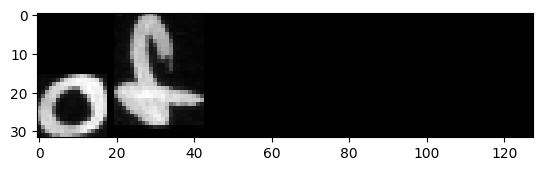



original_text =   Germany's
predicted text = Germany's

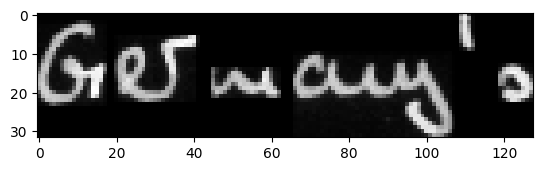



original_text =   "
predicted text = "

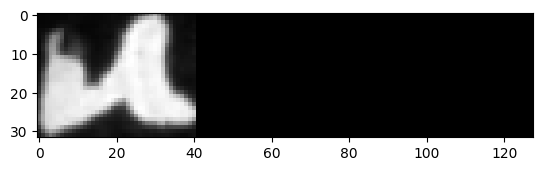



original_text =   aid
predicted text = aid

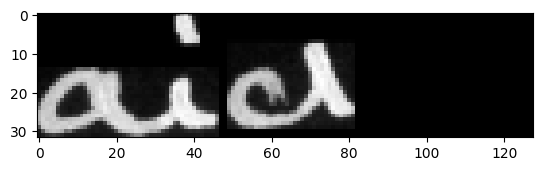



original_text =   "
predicted text = "

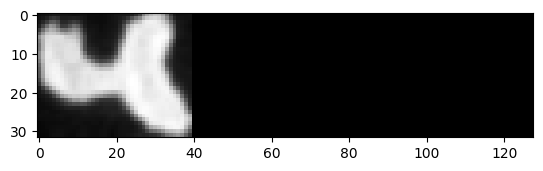



original_text =   is
predicted text = is

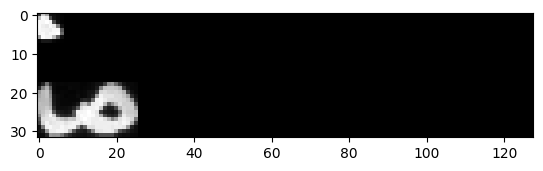



original_text =   the
predicted text = the

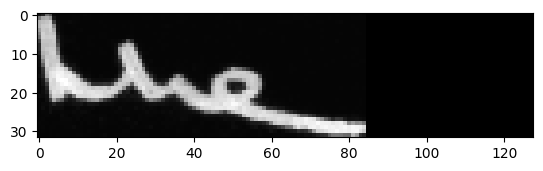



original_text =   early
predicted text = early

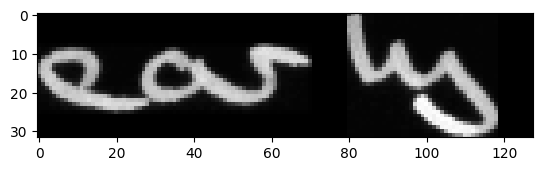



original_text =   of
predicted text = of

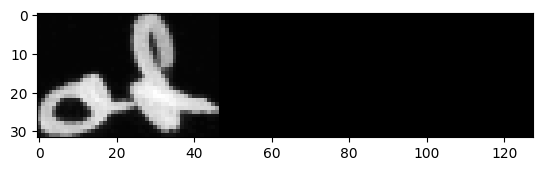



original_text =   a
predicted text = a

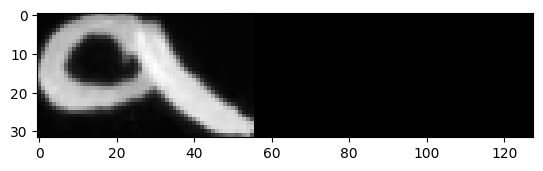



original_text =   210million
predicted text = 210million

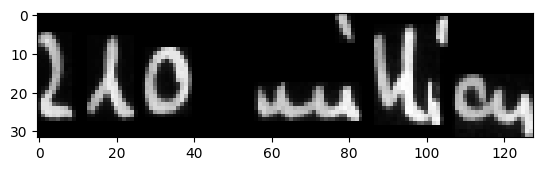



original_text =   debt
predicted text = debt

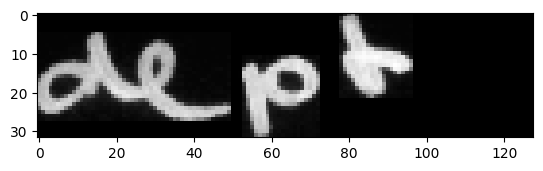



original_text =   to
predicted text = to

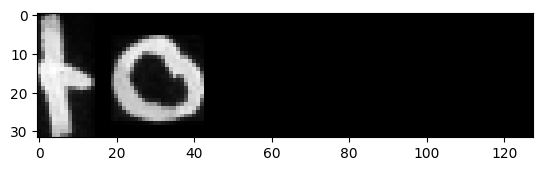



original_text =   America
predicted text = America

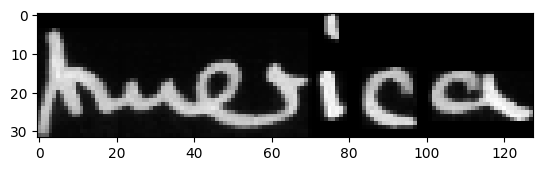



original_text =   .
predicted text = .

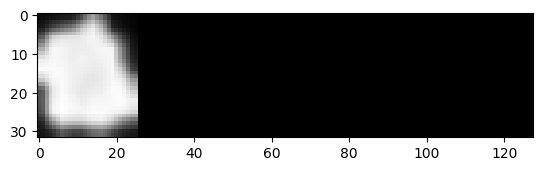



original_text =   United
predicted text = United

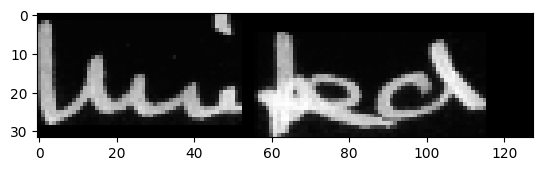



original_text =   States
predicted text = States

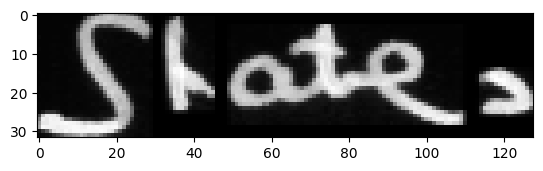



original_text =   quickly
predicted text = quickly

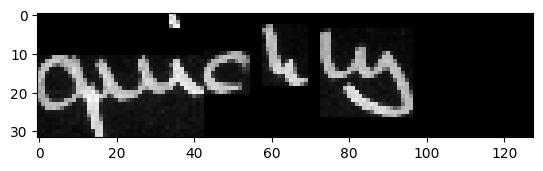



original_text =   point
predicted text = point

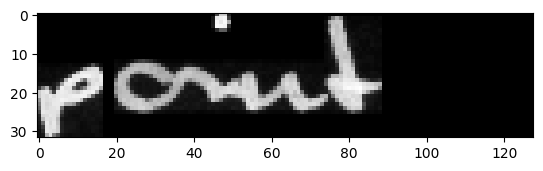



original_text =   out
predicted text = out

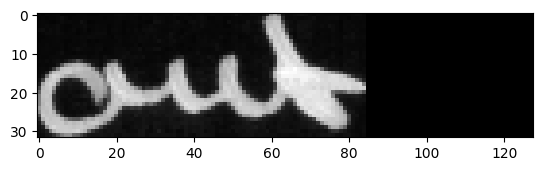



original_text =   that
predicted text = that

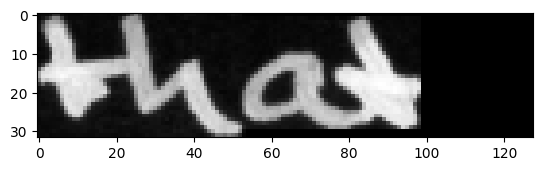



original_text =   this
predicted text = this

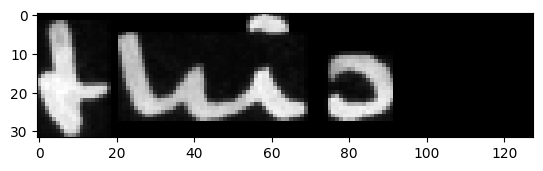



original_text =   is
predicted text = is

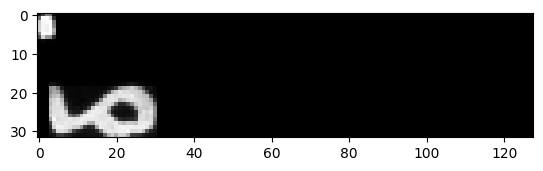



original_text =   money
predicted text = money

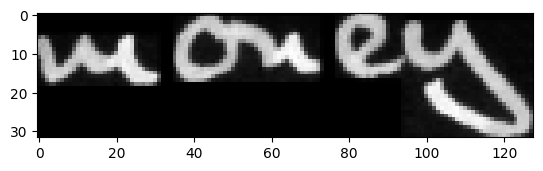



original_text =   due
predicted text = due

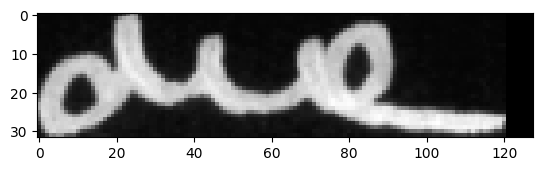



original_text =   to
predicted text = to

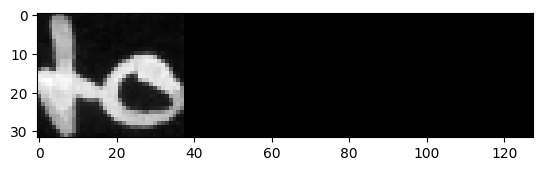



original_text =   anyway
predicted text = anyway

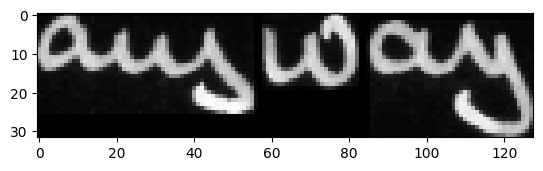



original_text =   .
predicted text = .

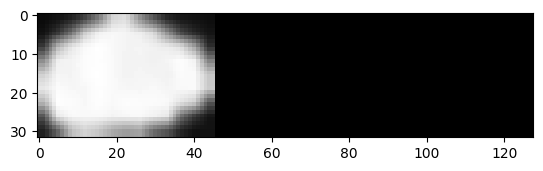



original_text =   But
predicted text = But

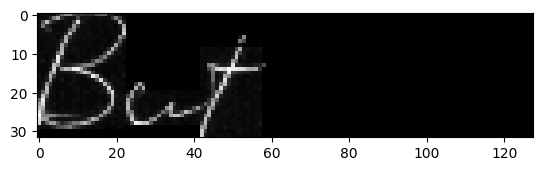



original_text =   he
predicted text = he

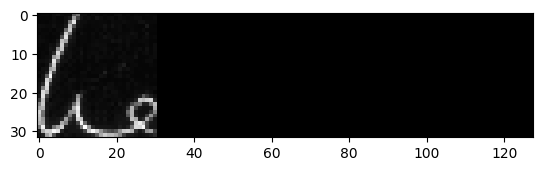



original_text =   said
predicted text = said

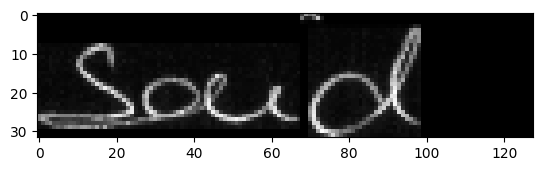



original_text =   discussions
predicted text = discussions

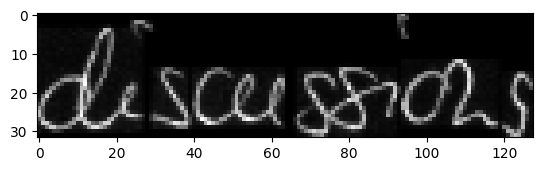



original_text =   "
predicted text = "

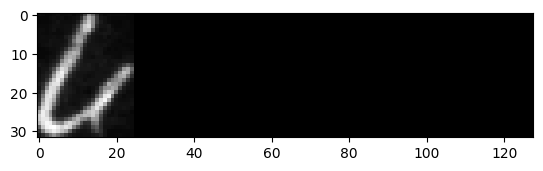



original_text =   on
predicted text = on

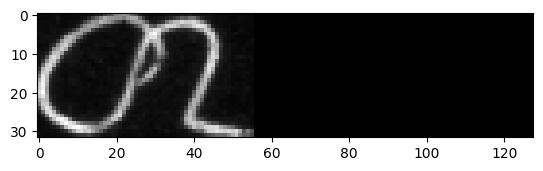



original_text =   a
predicted text = a

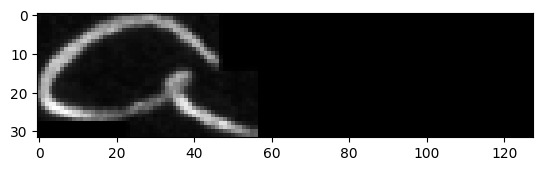



original_text =   level
predicted text = level

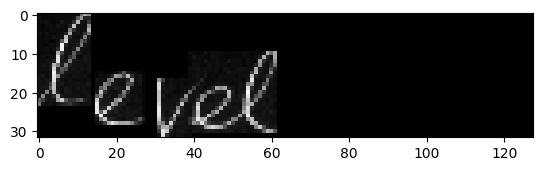



original_text =   than
predicted text = than

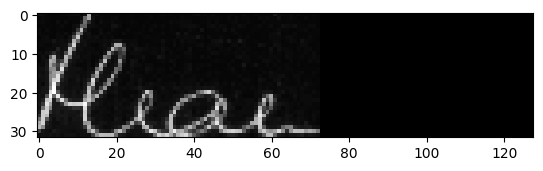



original_text =   in
predicted text = in

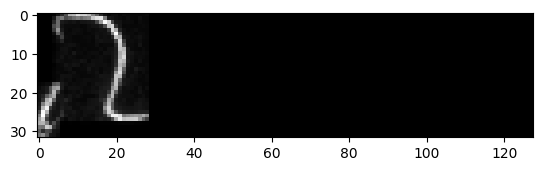



original_text =   the
predicted text = the

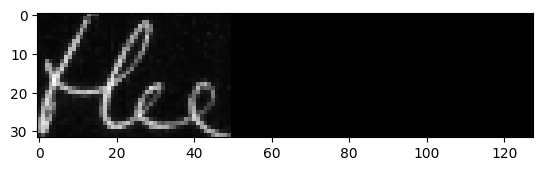



original_text =   past
predicted text = past

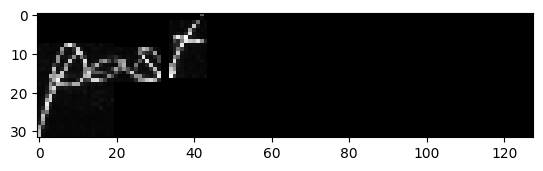



original_text =   "
predicted text = "

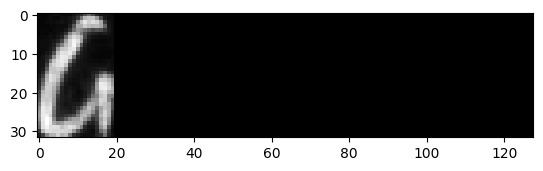



original_text =   might
predicted text = might

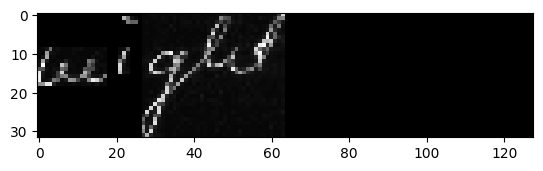



original_text =   be
predicted text = be

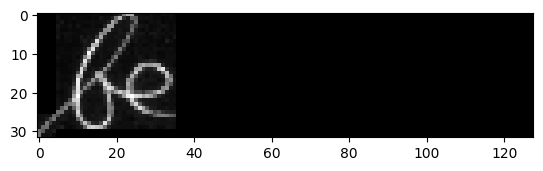



original_text =   useful
predicted text = useful

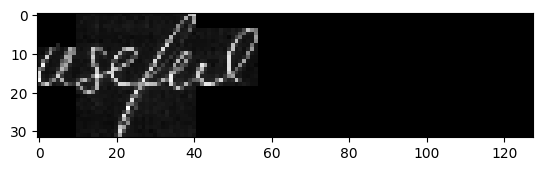



original_text =   German
predicted text = German

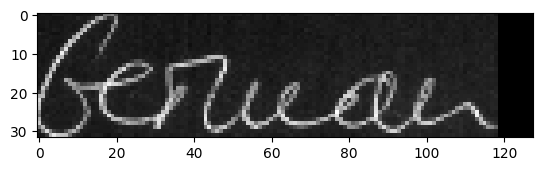



original_text =   Foreign
predicted text = Foreign

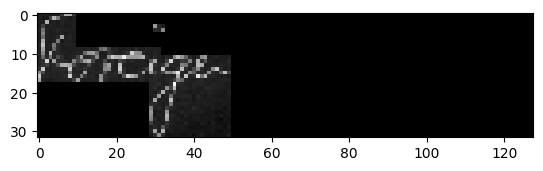



original_text =   Minister
predicted text = Minister

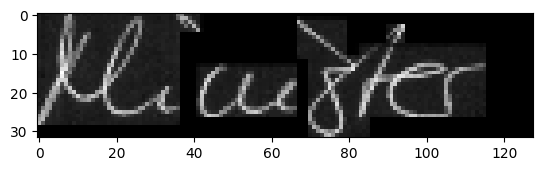



original_text =   ,
predicted text = ,

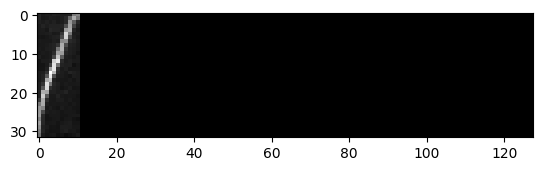



original_text =   who
predicted text = who

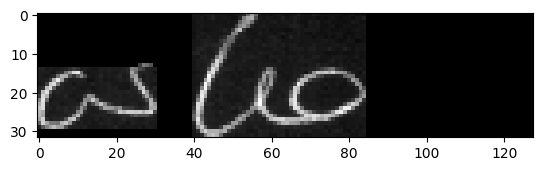



original_text =   is
predicted text = is

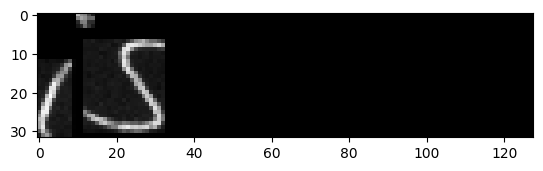



original_text =   in
predicted text = in

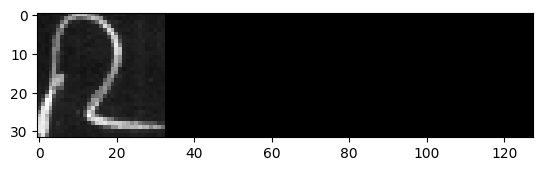



original_text =   Washington
predicted text = Washington

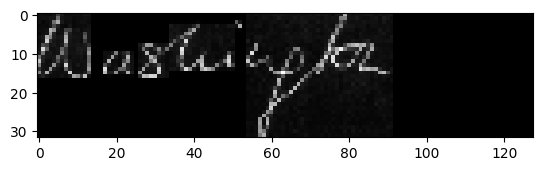



original_text =   next
predicted text = next

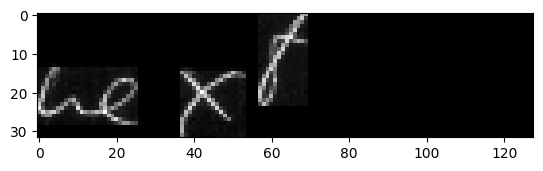



original_text =   week
predicted text = week

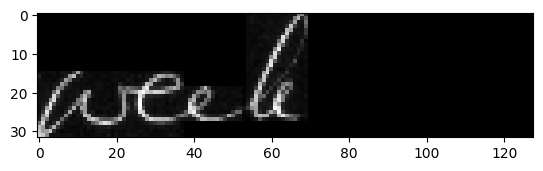



original_text =   .
predicted text = .

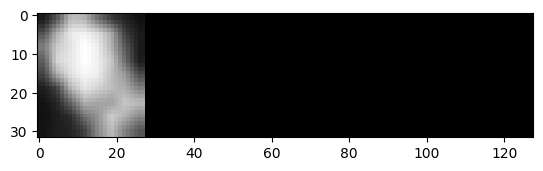



original_text =   A
predicted text = A

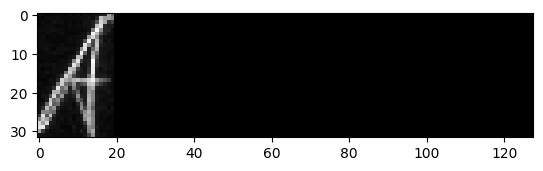



original_text =   big
predicted text = big

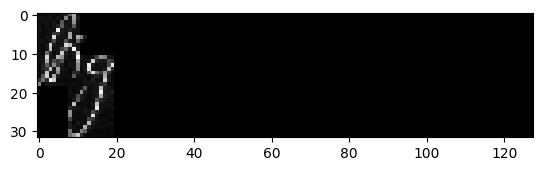



original_text =   slice
predicted text = slice

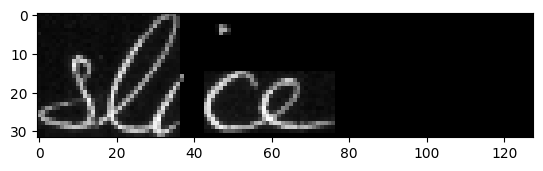



original_text =   of
predicted text = of

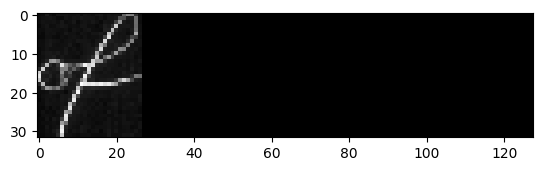



original_text =   "
predicted text = "

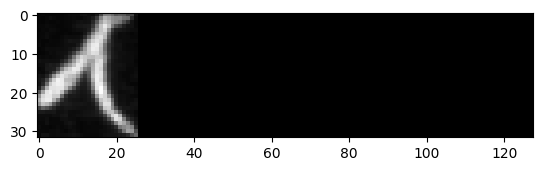



original_text =   aid
predicted text = aid

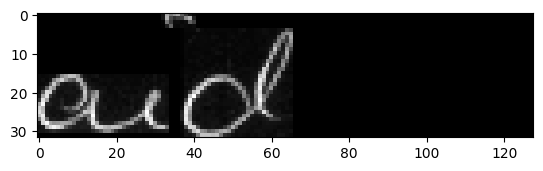



original_text =   "
predicted text = "

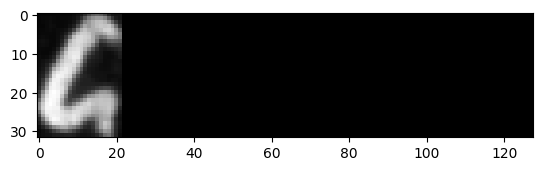



original_text =   is
predicted text = is

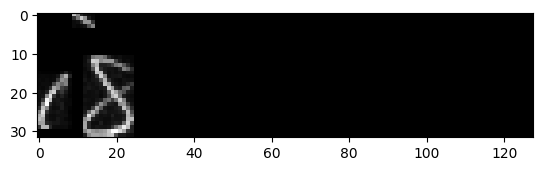



original_text =   the
predicted text = the

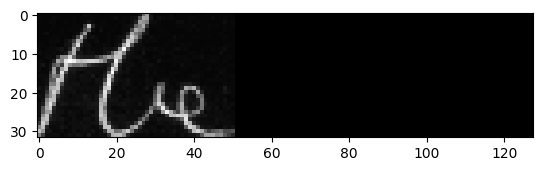



original_text =   early
predicted text = early

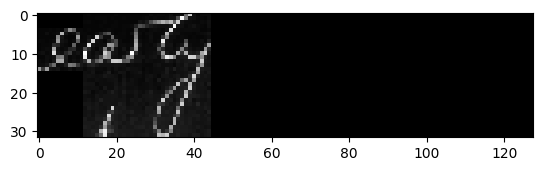



original_text =   payment
predicted text = payment

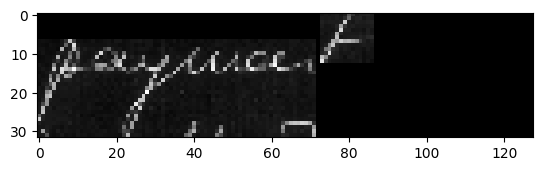



original_text =   of
predicted text = of

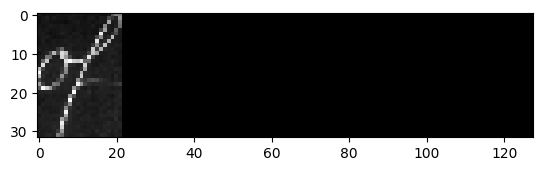



original_text =   a
predicted text = a

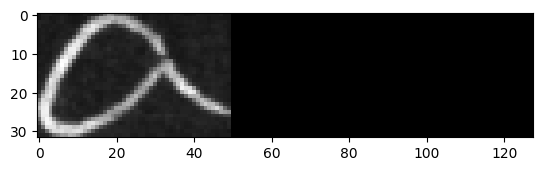



original_text =   debt
predicted text = debt

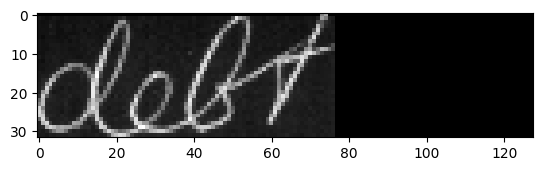



original_text =   to
predicted text = to

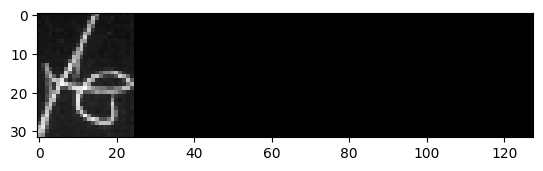



original_text =   America
predicted text = America

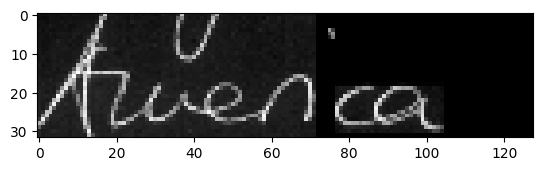



original_text =   .
predicted text = .

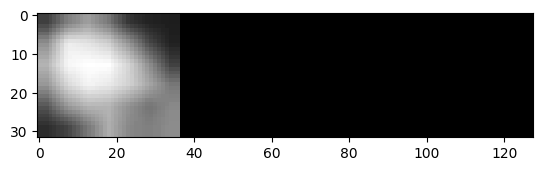



original_text =   United
predicted text = United

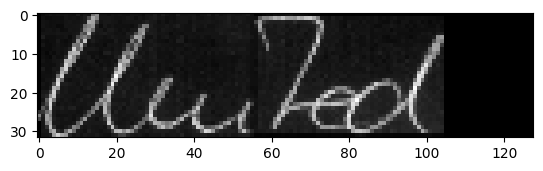



original_text =   they
predicted text = they

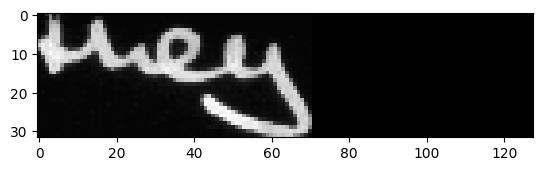



original_text =   are
predicted text = are

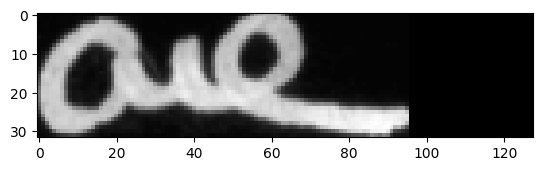



original_text =   unimpressed
predicted text = unimpressed

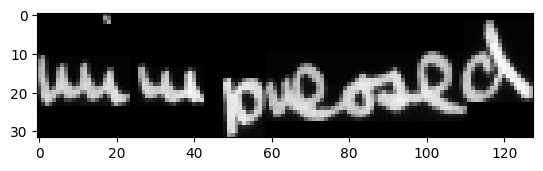



original_text =   by
predicted text = by

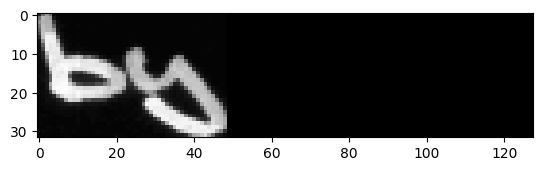



original_text =   the
predicted text = the

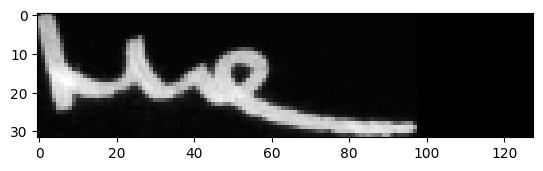



original_text =   Germans'
predicted text = Germans'

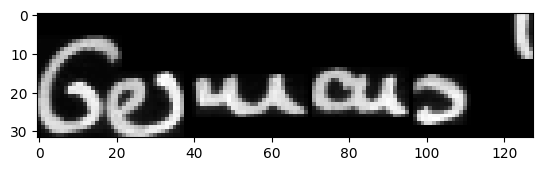



original_text =   claim
predicted text = claim

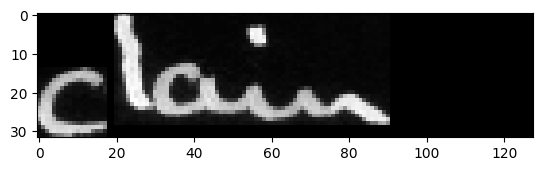



original_text =   that
predicted text = that

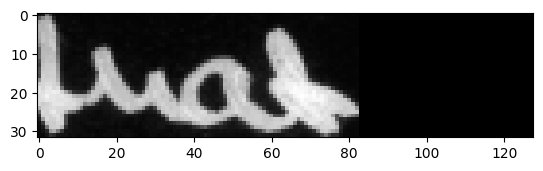



original_text =   they
predicted text = they

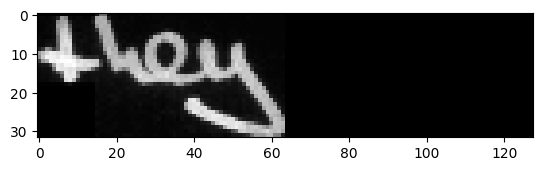



original_text =   pay
predicted text = pay

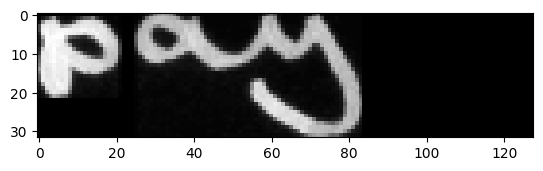



original_text =   more
predicted text = more

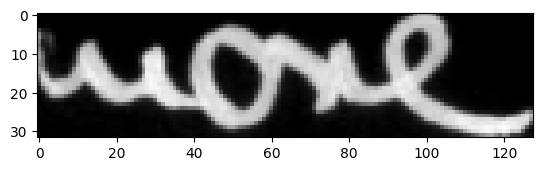



original_text =   than
predicted text = than

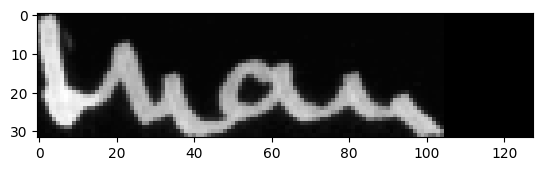



original_text =   357million
predicted text = 357million

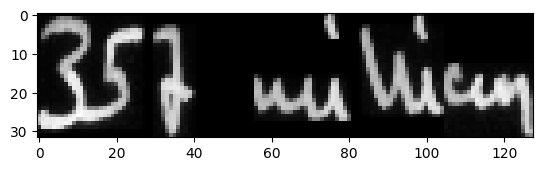



original_text =   without
predicted text = without

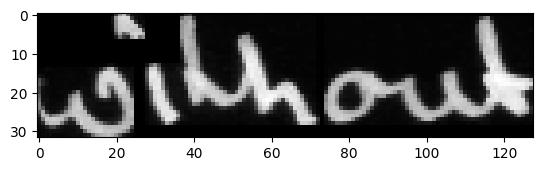



original_text =   upsetting
predicted text = upsetting

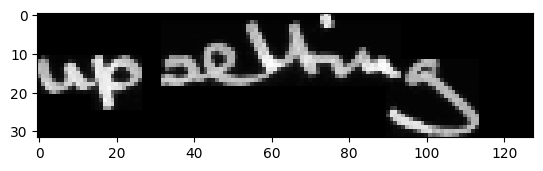



original_text =   their
predicted text = their

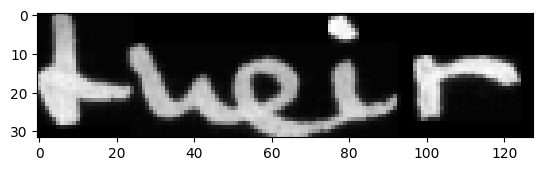



original_text =   own
predicted text = own

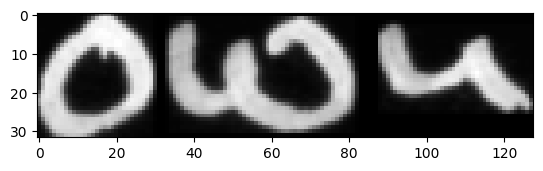



original_text =   economy
predicted text = economy

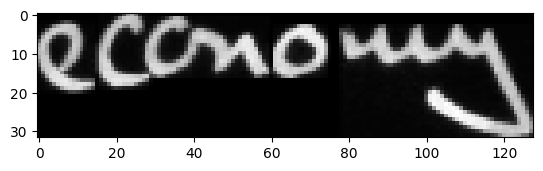



original_text =   The
predicted text = The

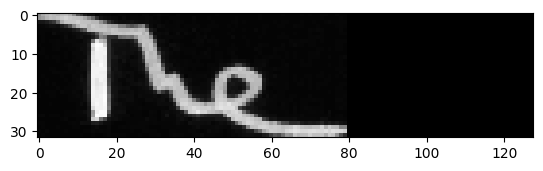



original_text =   Americans
predicted text = Americans

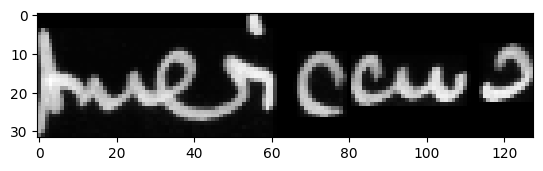



original_text =   say
predicted text = say

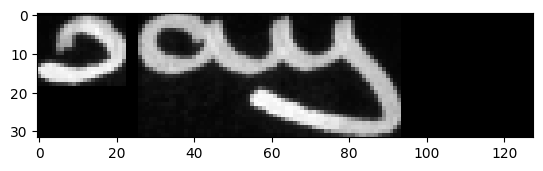



original_text =   Germany
predicted text = Germany

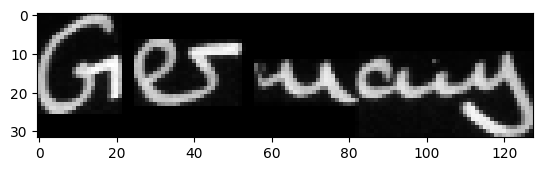



original_text =   is
predicted text = is

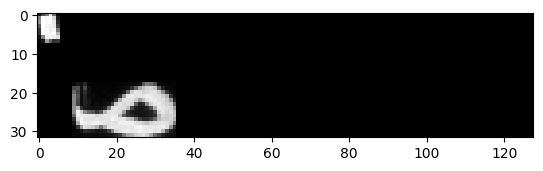



original_text =   having
predicted text = having

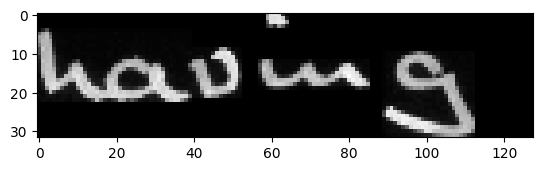



original_text =   it
predicted text = it

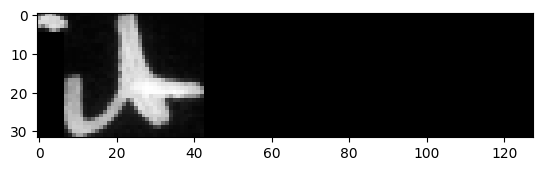



original_text =   too
predicted text = too

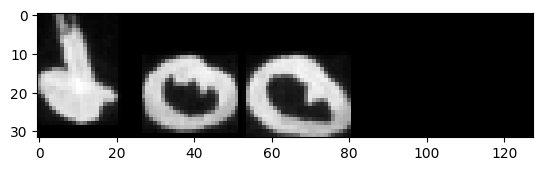



original_text =   good
predicted text = good

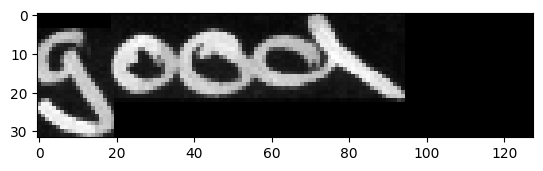



original_text =   is
predicted text = is

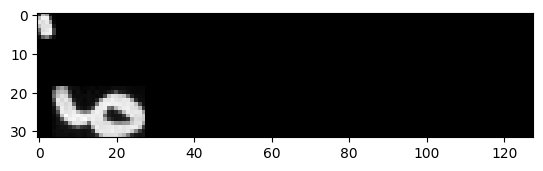



original_text =   not
predicted text = not

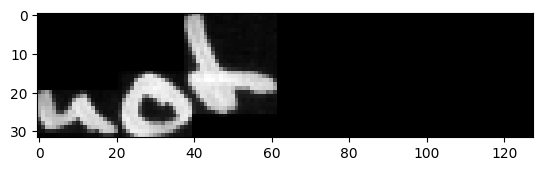



original_text =   paying
predicted text = paying

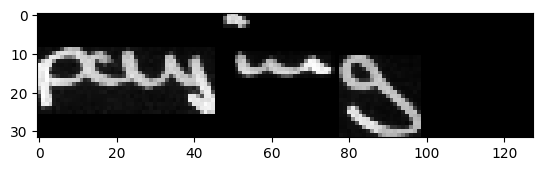



original_text =   for
predicted text = for

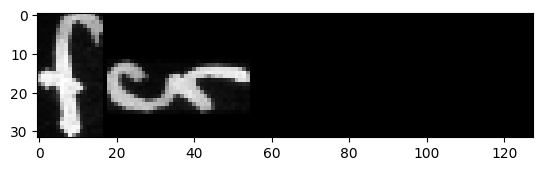



original_text =   the
predicted text = the

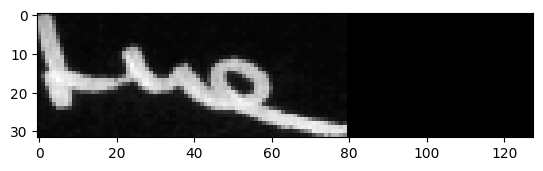



original_text =   past
predicted text = past

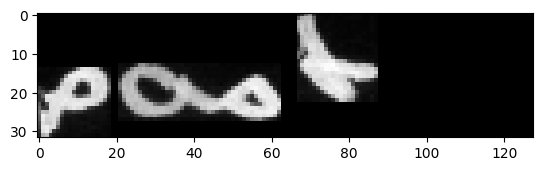



original_text =   or
predicted text = or

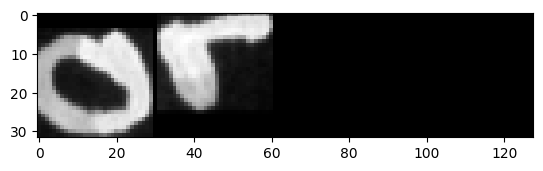



original_text =   for
predicted text = for

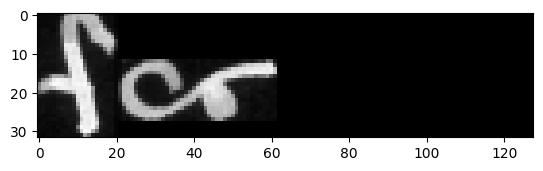



original_text =   the
predicted text = the

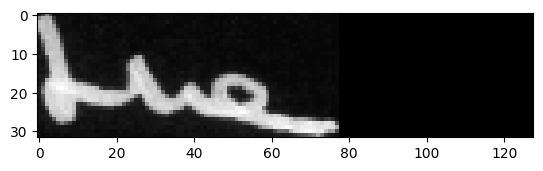



original_text =   .
predicted text = .

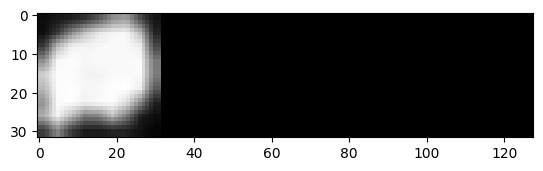



original_text =   The
predicted text = The

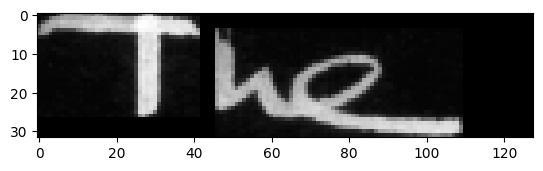



original_text =   Adenauer
predicted text = Adenauer

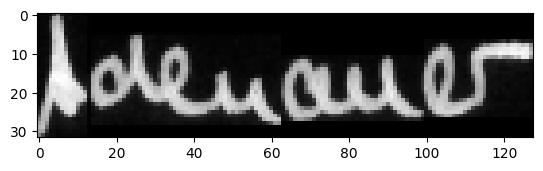



original_text =   Government
predicted text = Government

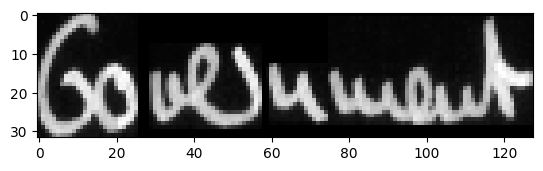



original_text =   flatly
predicted text = flatly

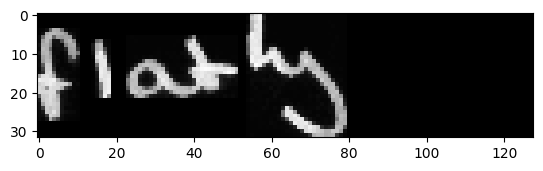



original_text =   rejected
predicted text = rejected

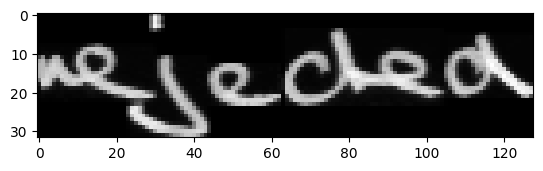



original_text =   attempts
predicted text = attempts

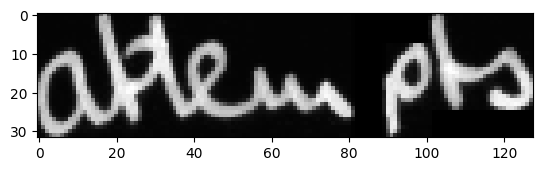



original_text =   by
predicted text = by

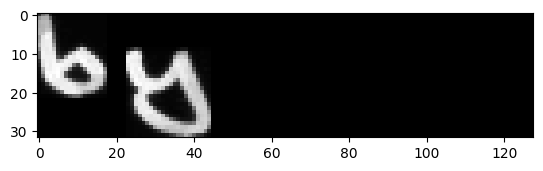



original_text =   the
predicted text = the

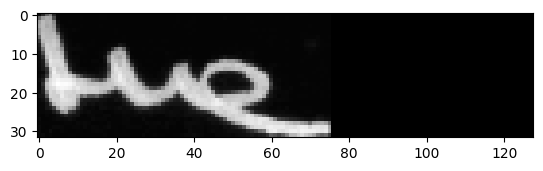



original_text =   Government
predicted text = Government

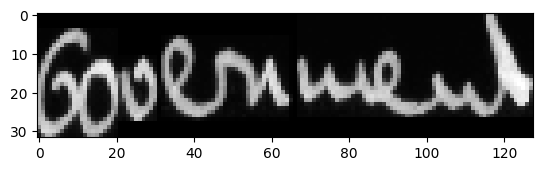



original_text =   to
predicted text = to

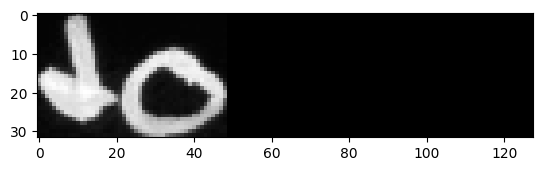



original_text =   get
predicted text = get

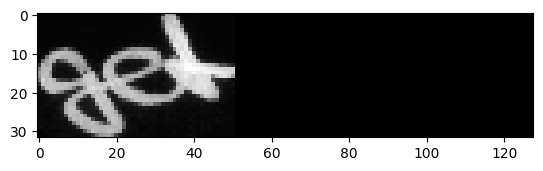



original_text =   them
predicted text = them

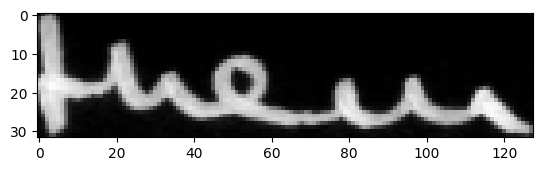



original_text =   to
predicted text = to

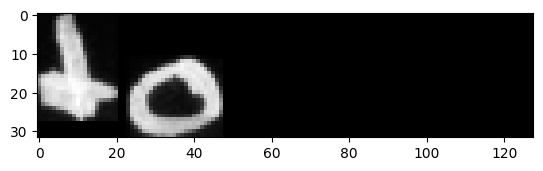



original_text =   pay
predicted text = pay

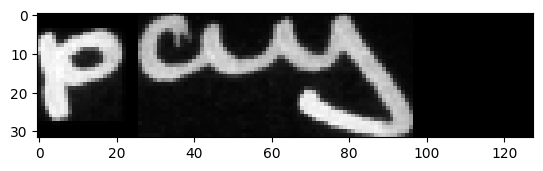



original_text =   a
predicted text = a

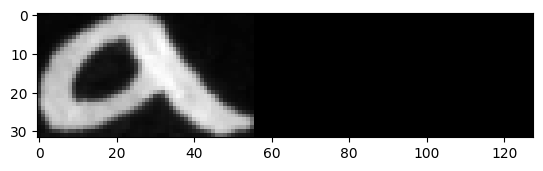



original_text =   regular
predicted text = regular

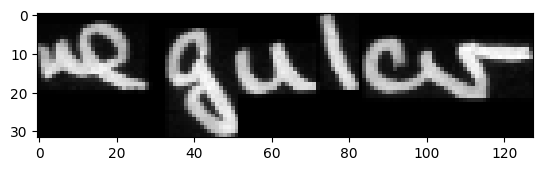



original_text =   sum
predicted text = sum

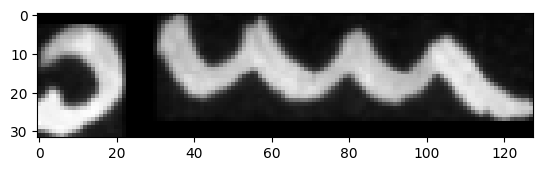



original_text =   the
predicted text = the

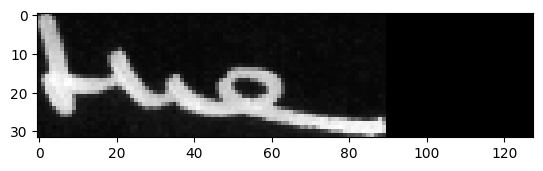



original_text =   cost
predicted text = cost

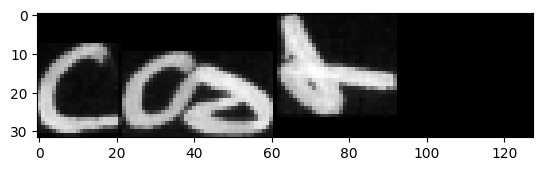



original_text =   of
predicted text = of

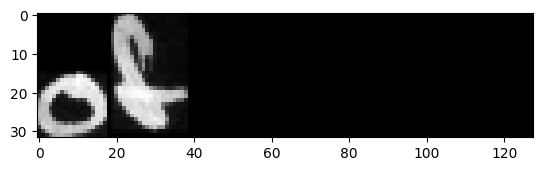



original_text =   keeping
predicted text = keeping

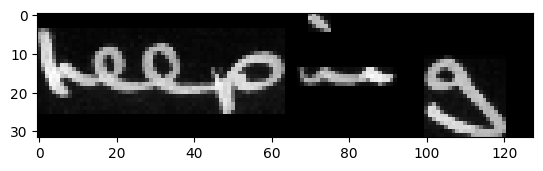



original_text =   American
predicted text = American

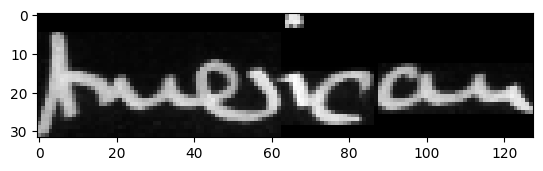



original_text =   troops
predicted text = troops

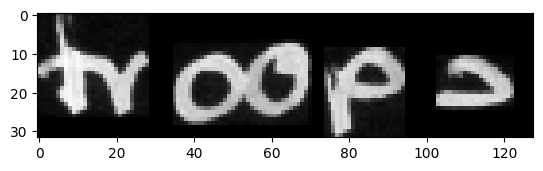



original_text =   in
predicted text = in

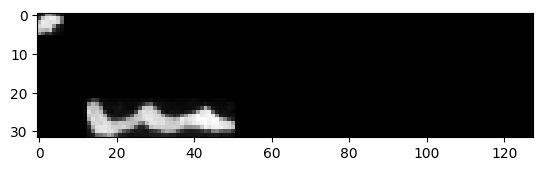



original_text =   Germany
predicted text = Germany

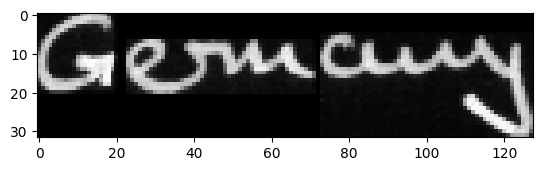



original_text =   .
predicted text = .

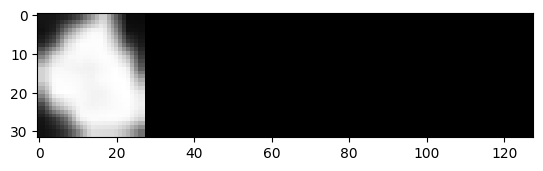



original_text =   support
predicted text = support

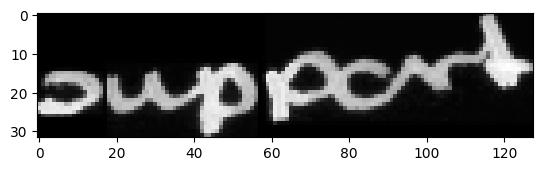



original_text =   costs
predicted text = costs

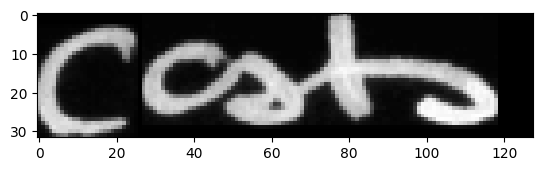



original_text =   are
predicted text = are

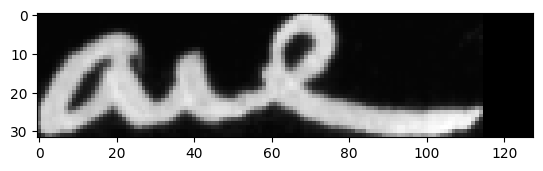



original_text =   a
predicted text = a

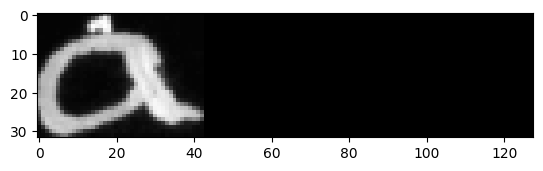



original_text =   big
predicted text = big

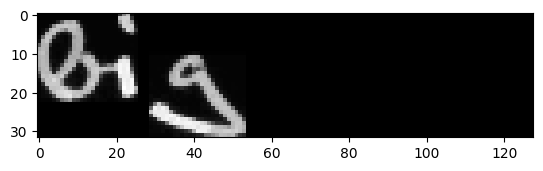



original_text =   drain
predicted text = drain

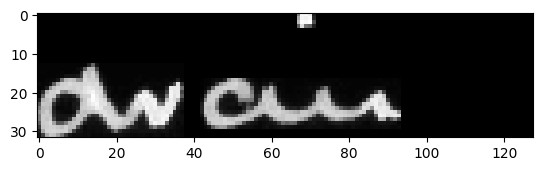



original_text =   on
predicted text = on

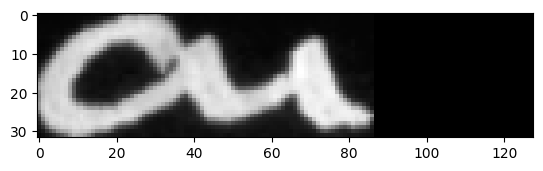



original_text =   America's
predicted text = America's

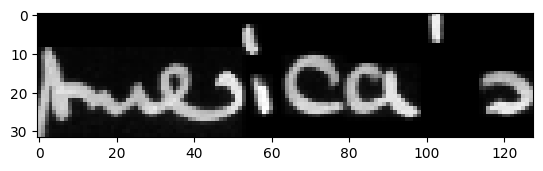



original_text =   dollar
predicted text = dollar

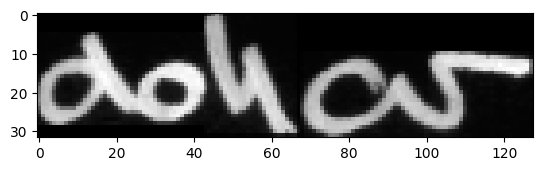



original_text =   .
predicted text = .

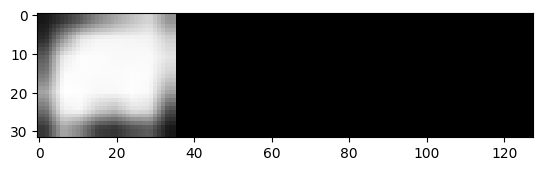



original_text =   Dr.
predicted text = Dr.

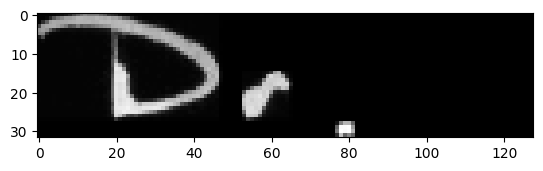



original_text =   Adenauer's
predicted text = Adenauer's

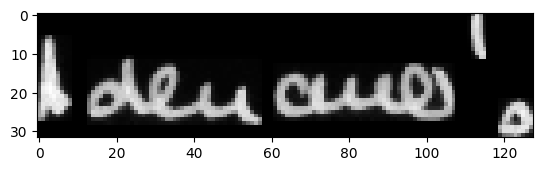



original_text =   answer
predicted text = answer

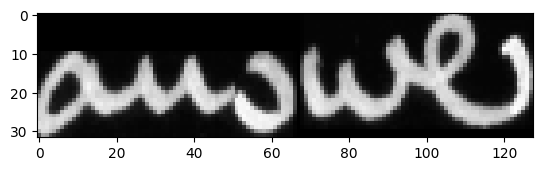



original_text =   is
predicted text = is

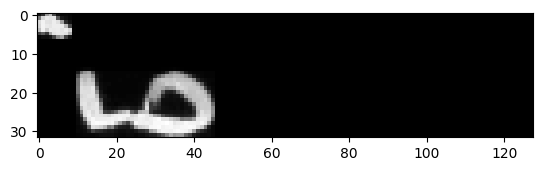



original_text =   the
predicted text = the

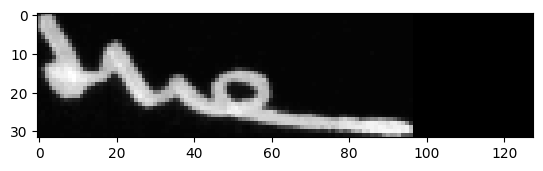



original_text =   once-and-for-all
predicted text = once-and-for-all

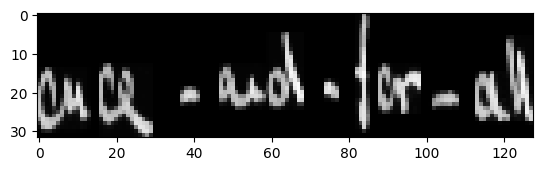



original_text =   cash
predicted text = cash

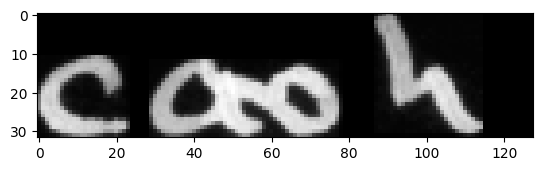



original_text =   offer
predicted text = offer

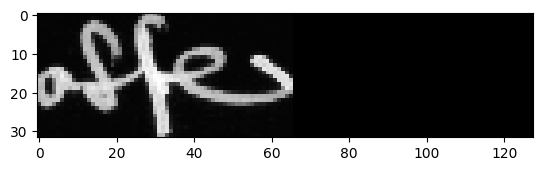



original_text =   357million
predicted text = 357million

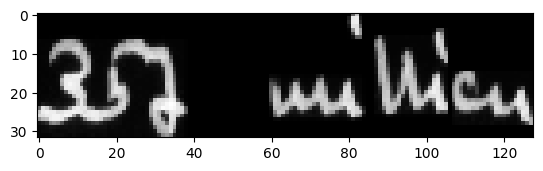



original_text =   .
predicted text = .

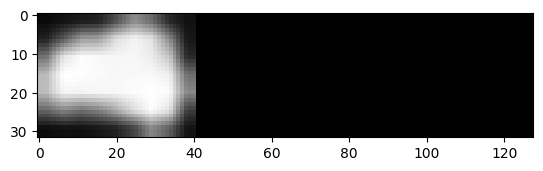



original_text =   President
predicted text = President

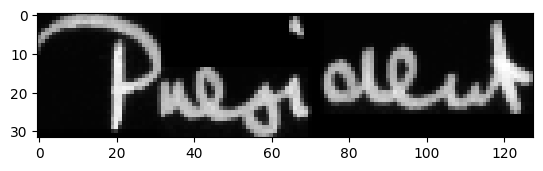



original_text =   Kennedy's
predicted text = Kennedy's

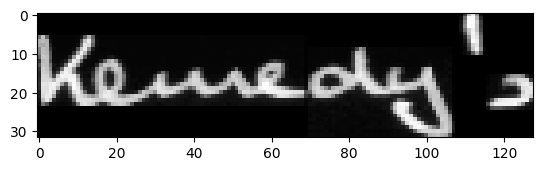



original_text =   rejection
predicted text = rejection

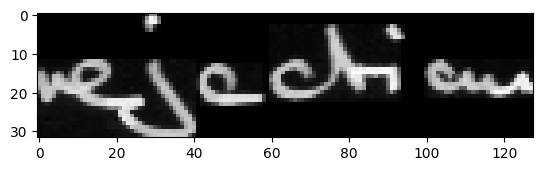



original_text =   of
predicted text = of

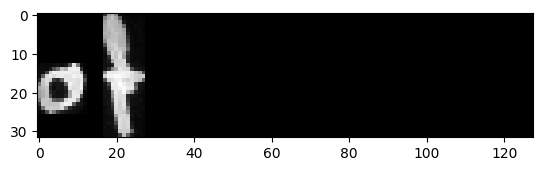



original_text =   it
predicted text = it

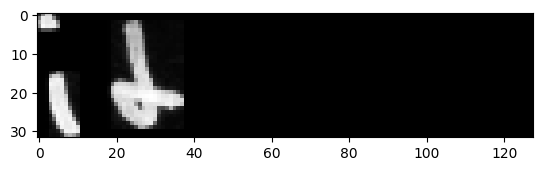



original_text =   is
predicted text = is

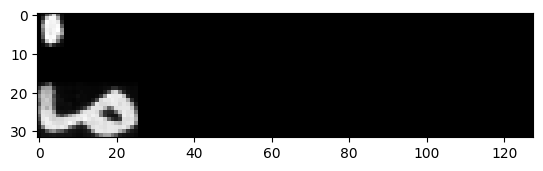



original_text =   a
predicted text = a

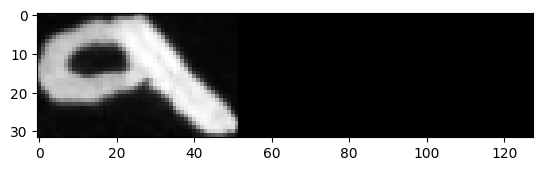



original_text =   blow
predicted text = blow

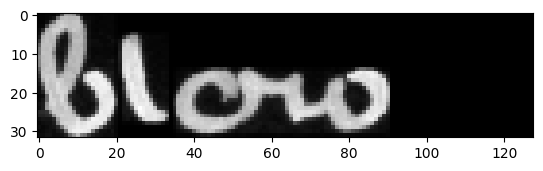



original_text =   to
predicted text = to

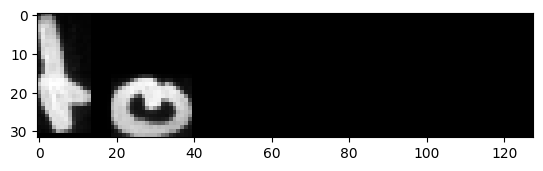



original_text =   the
predicted text = the

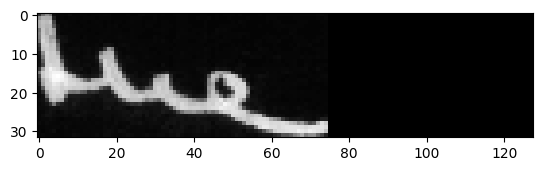



original_text =   West
predicted text = West

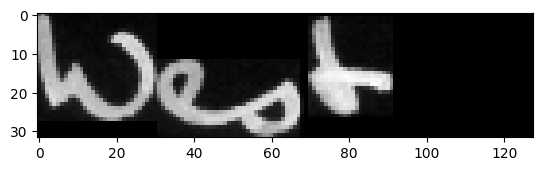



original_text =   German
predicted text = German

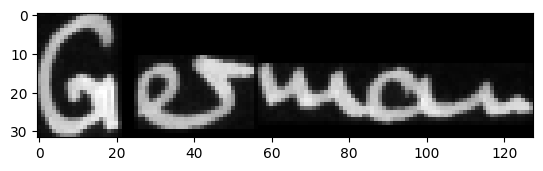



original_text =   Government
predicted text = Government

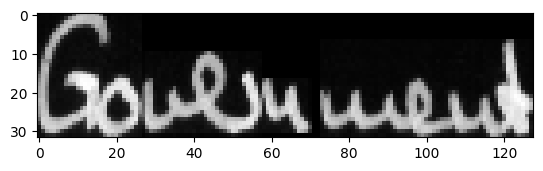



original_text =   .
predicted text = .

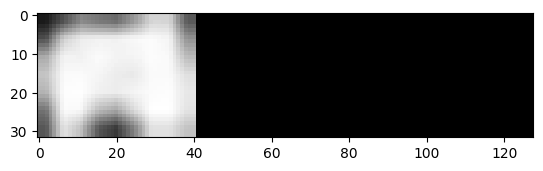



original_text =   It
predicted text = It

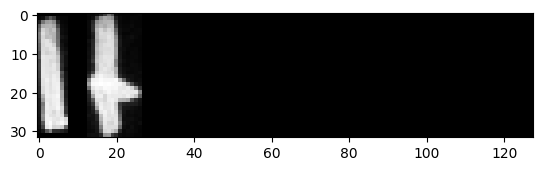



original_text =   will
predicted text = will

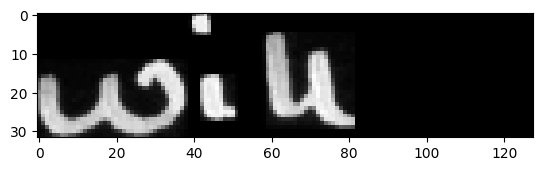



original_text =   have
predicted text = have

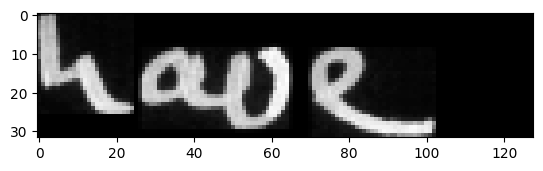



original_text =   to
predicted text = to

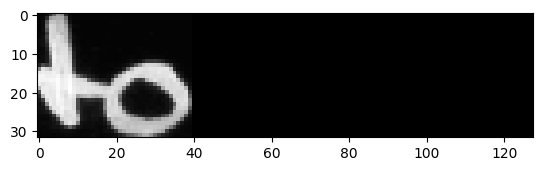



original_text =   pay
predicted text = pay

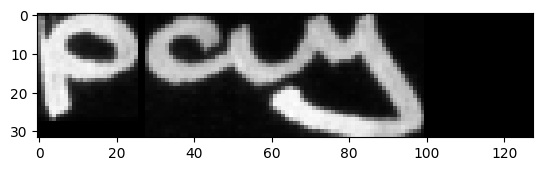



original_text =   more
predicted text = more

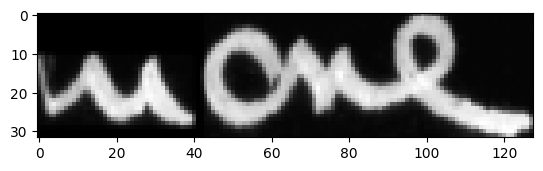



original_text =   -
predicted text = -

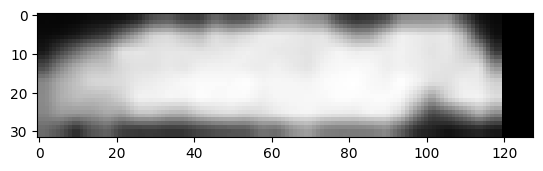



original_text =   and
predicted text = and

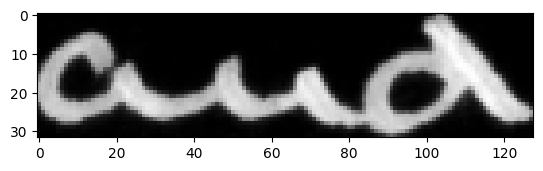



original_text =   increase
predicted text = increase

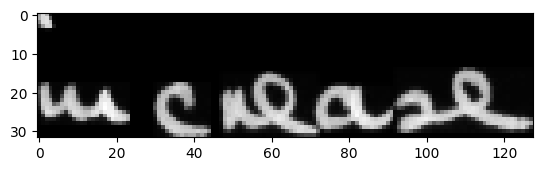



original_text =   taxation
predicted text = taxation

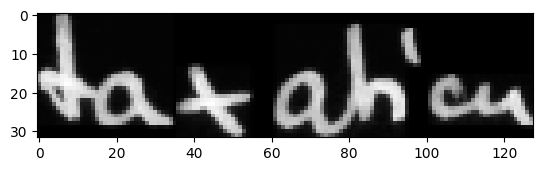



original_text =   to
predicted text = to

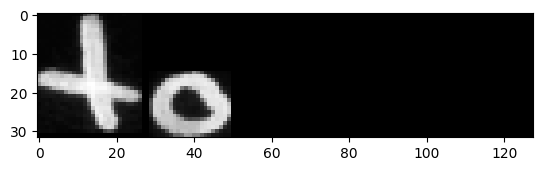



original_text =   so
predicted text = so

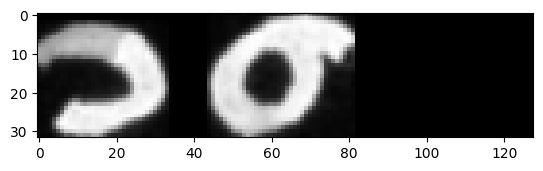



original_text =   -
predicted text = -

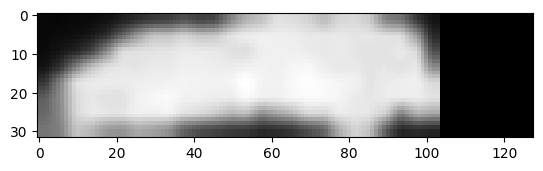



original_text =   or
predicted text = or

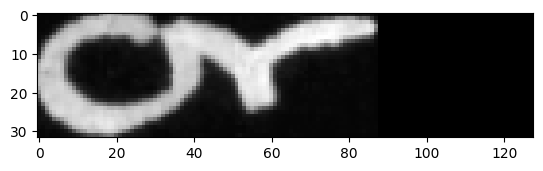



original_text =   run
predicted text = run

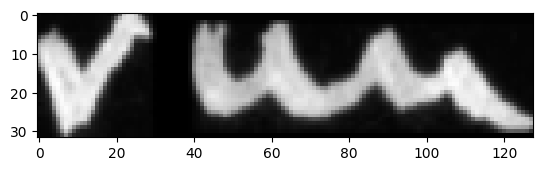



original_text =   the
predicted text = the

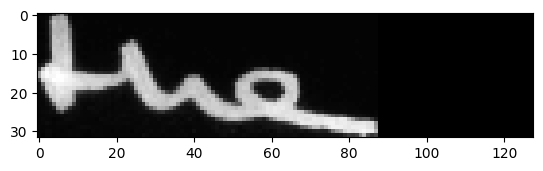



original_text =   obvious
predicted text = obvious

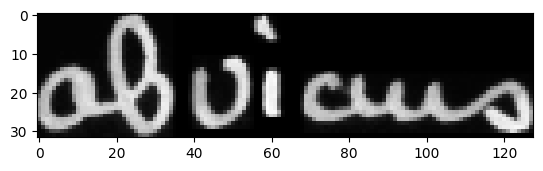



original_text =   #
predicted text = #

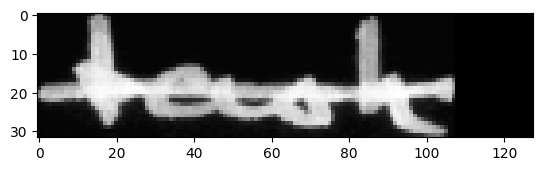



original_text =   risks
predicted text = risk

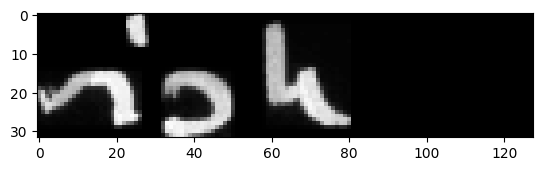



original_text =   in
predicted text = in

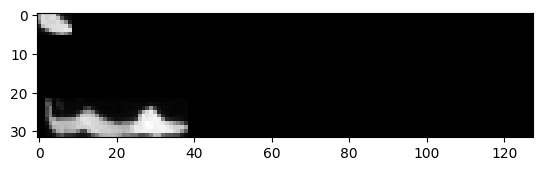



original_text =   the
predicted text = the

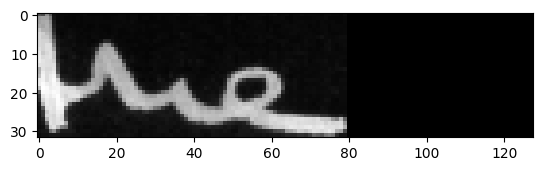



original_text =   new
predicted text = new

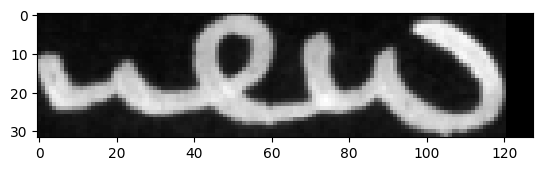



original_text =   American
predicted text = American

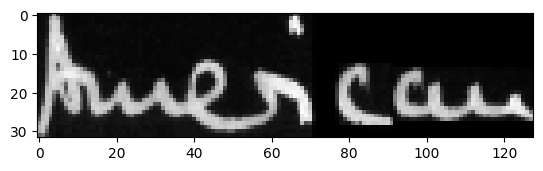



original_text =   administration
predicted text = administration

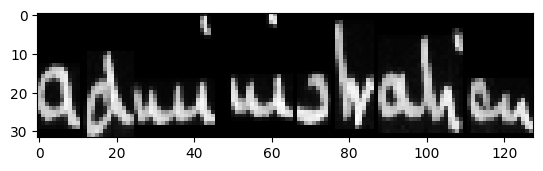



original_text =   .
predicted text = .

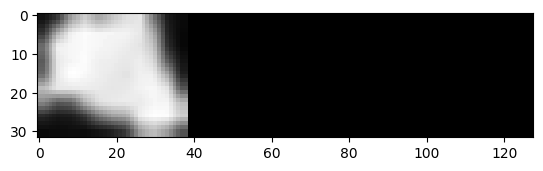



original_text =   These
predicted text = These

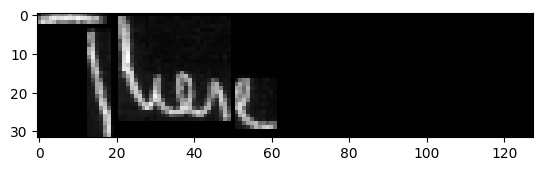



original_text =   support
predicted text = support

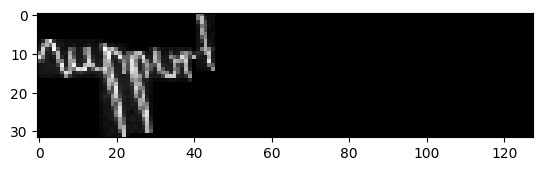



original_text =   costs
predicted text = costs

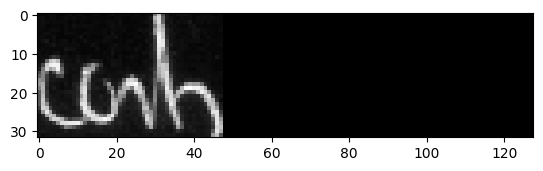



original_text =   are
predicted text = are

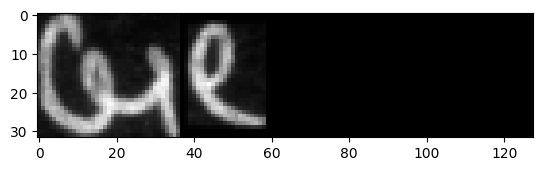



original_text =   big
predicted text = big

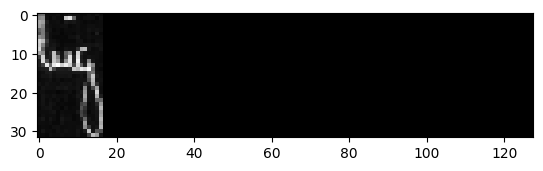



original_text =   drain
predicted text = drain

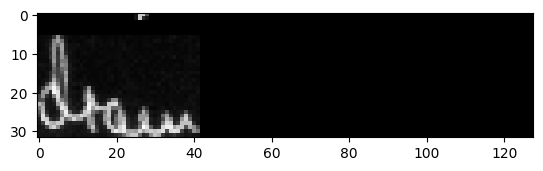



original_text =   on
predicted text = on

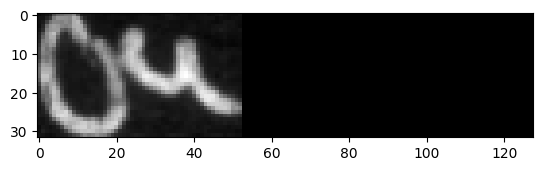



original_text =   America's
predicted text = America's

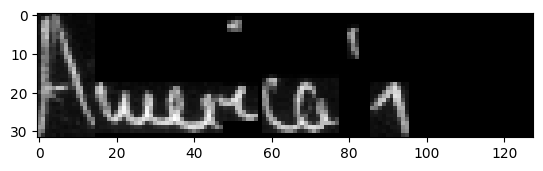



original_text =   dollar
predicted text = dollar

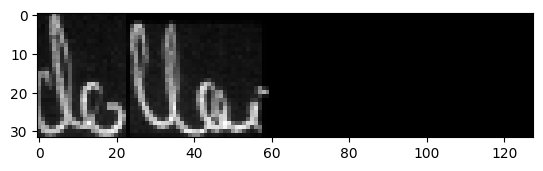



original_text =   reserves
predicted text = reserves

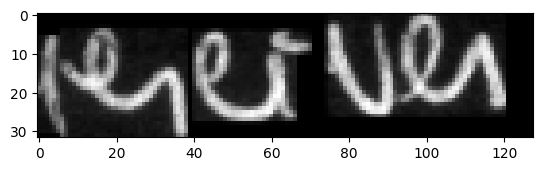



original_text =   .
predicted text = .

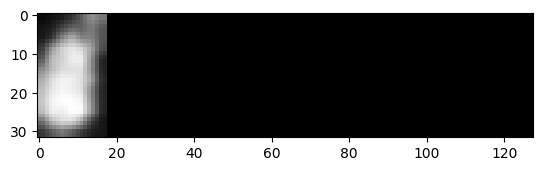



original_text =   Dr.
predicted text = Dr.

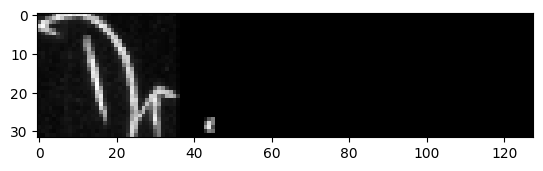



original_text =   Adenauer's
predicted text = Adenauer's

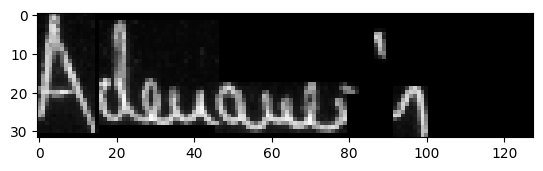



original_text =   is
predicted text = is

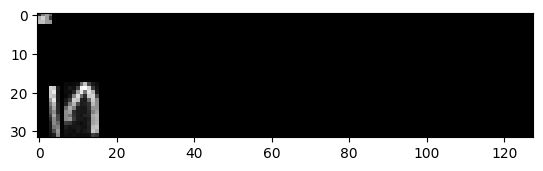



original_text =   the
predicted text = the

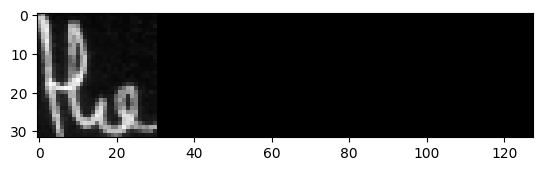



original_text =   once-and-for-all
predicted text = once-and-for-all

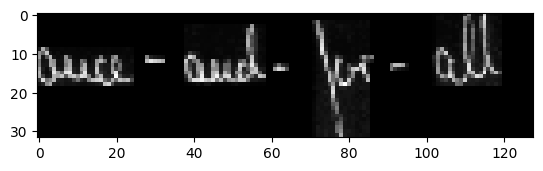



original_text =   cash
predicted text = cash

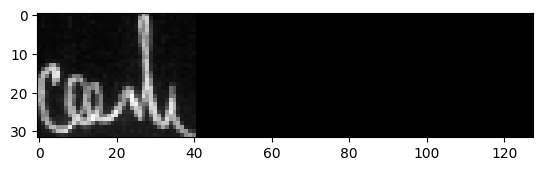



original_text =   offer
predicted text = offer

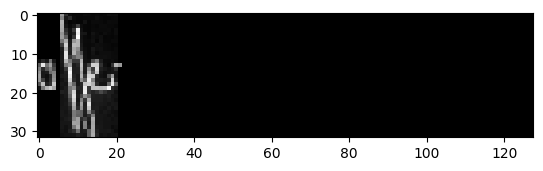



original_text =   of
predicted text = of

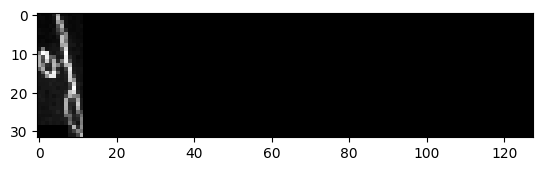



original_text =   357million
predicted text = 357million

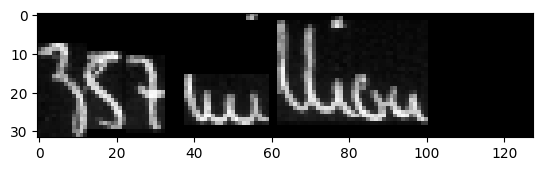



original_text =   .
predicted text = .

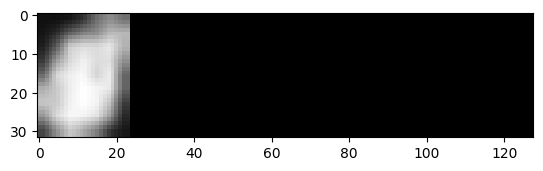



original_text =   President
predicted text = President

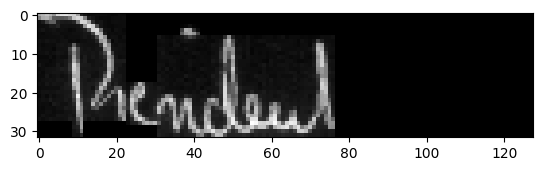



original_text =   rejection
predicted text = rejection

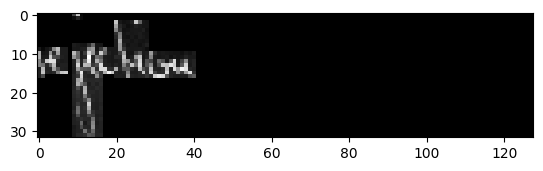



original_text =   of
predicted text = of

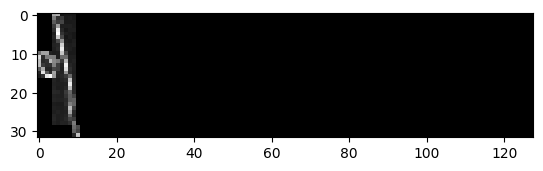



original_text =   it
predicted text = it

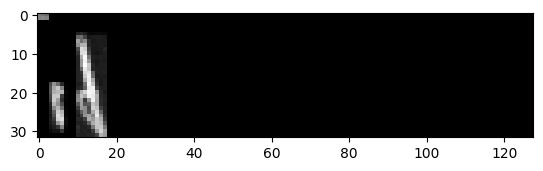



original_text =   is
predicted text = is

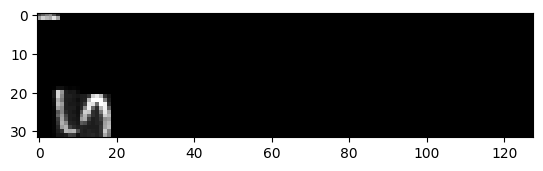



original_text =   a
predicted text = a

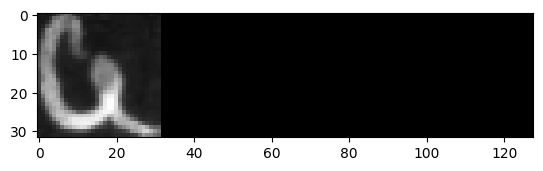



original_text =   painful
predicted text = painful

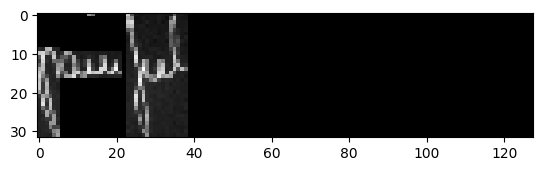



original_text =   blow
predicted text = blow

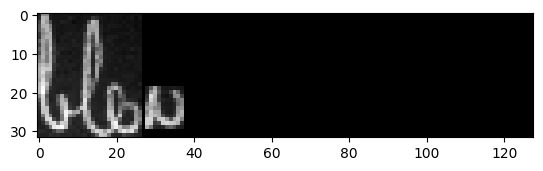



original_text =   to
predicted text = to

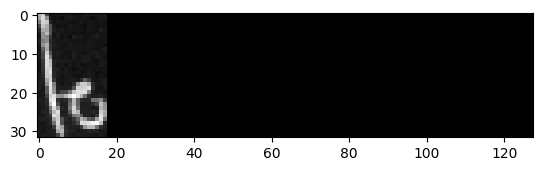



original_text =   the
predicted text = the

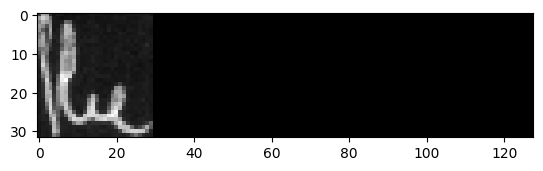



original_text =   German
predicted text = German

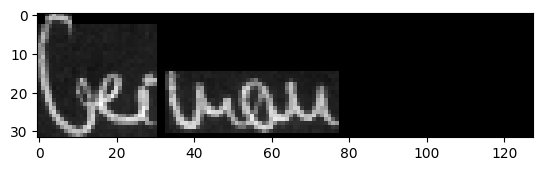



original_text =   Government
predicted text = Government

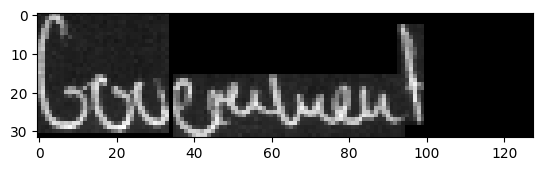



original_text =   .
predicted text = .

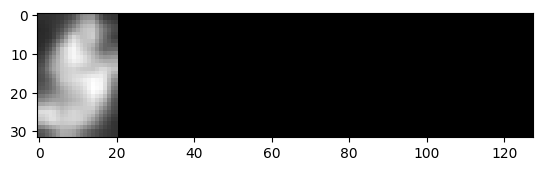



original_text =   It
predicted text = It

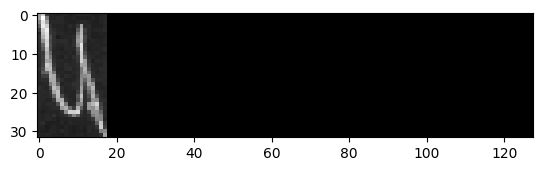



original_text =   will
predicted text = will

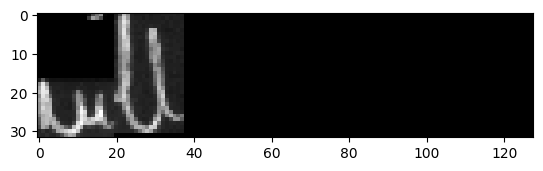



original_text =   now
predicted text = now

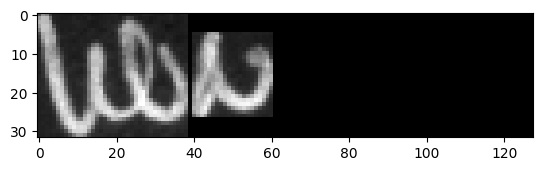



original_text =   have
predicted text = have

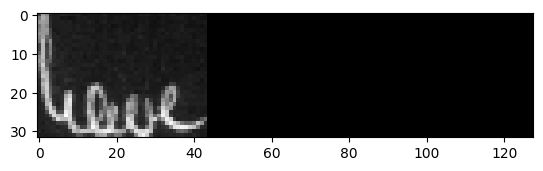



original_text =   to
predicted text = to

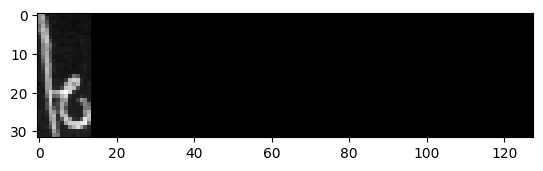



original_text =   pay
predicted text = pay

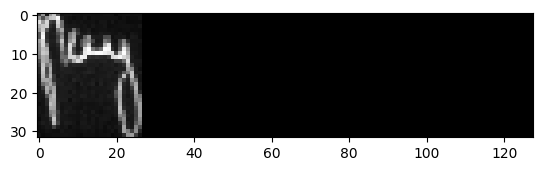



original_text =   American
predicted text = American

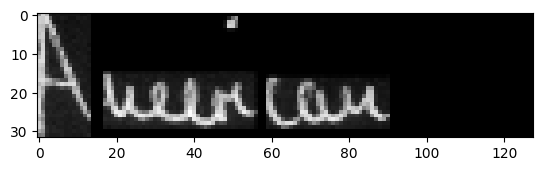



original_text =   administration
predicted text = administration

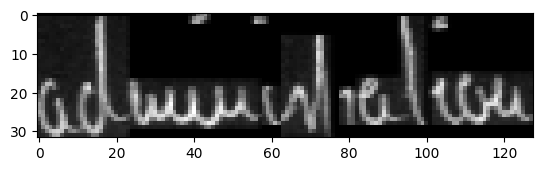



original_text =   And
predicted text = And

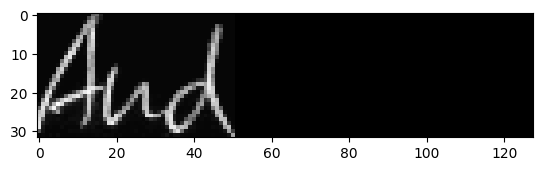



original_text =   ,
predicted text = ,

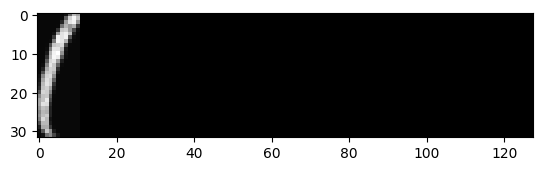



original_text =   since
predicted text = since

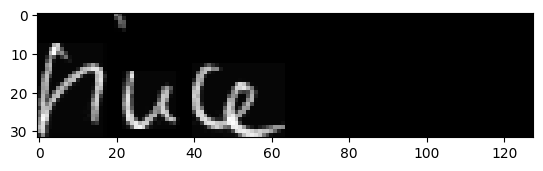



original_text =   this
predicted text = this

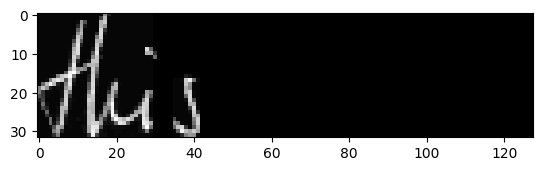



original_text =   is
predicted text = is

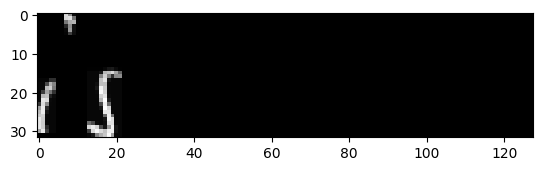



original_text =   election
predicted text = election

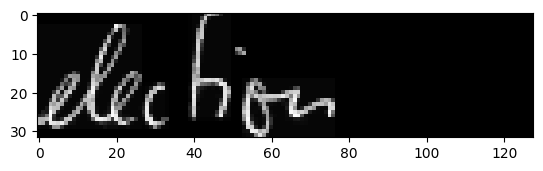



original_text =   year
predicted text = year

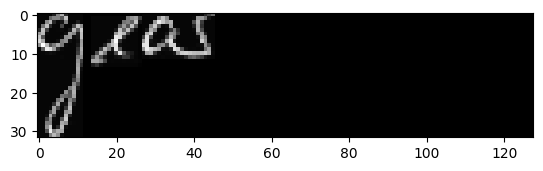



original_text =   in
predicted text = in

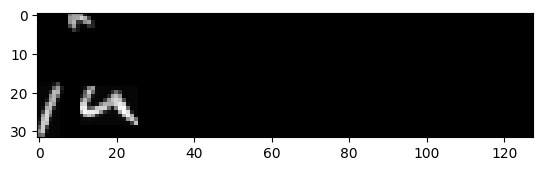



original_text =   West
predicted text = West

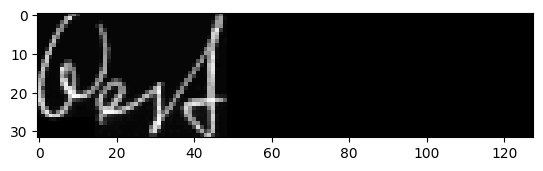



original_text =   ,
predicted text = ,

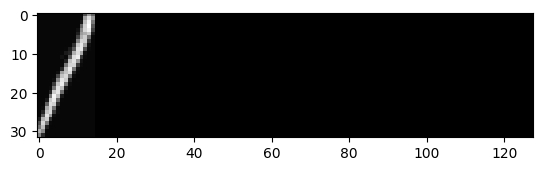



original_text =   Dr.
predicted text = Dr.

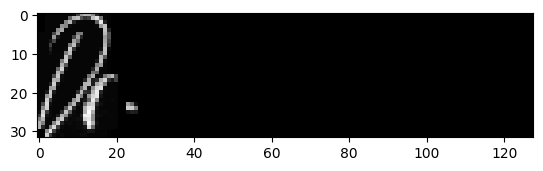



original_text =   Adenauer
predicted text = Adenauer

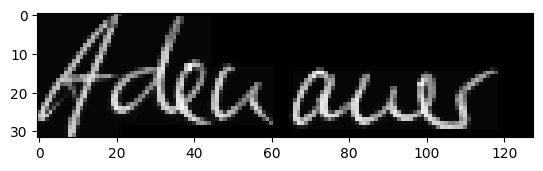



original_text =   is
predicted text = is

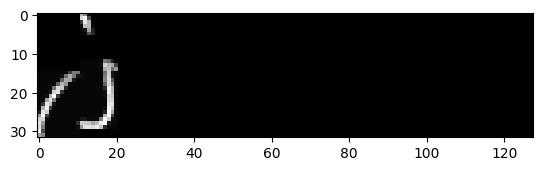



original_text =   in
predicted text = in

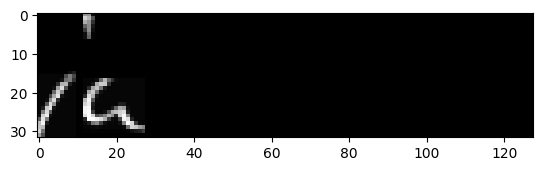



original_text =   a
predicted text = a

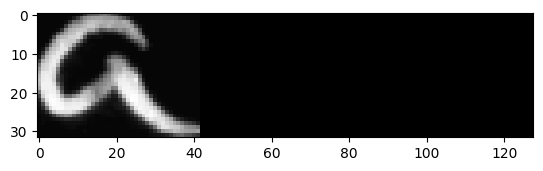



original_text =   tough
predicted text = tough

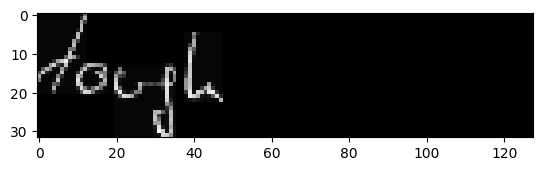



original_text =   spot
predicted text = spot

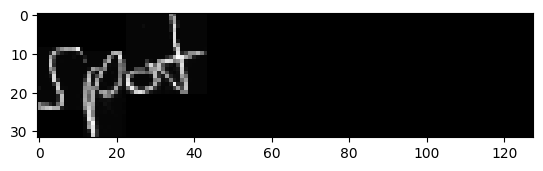



original_text =   .
predicted text = .

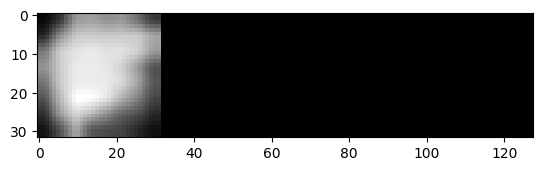



original_text =   Egginton
predicted text = Egginton

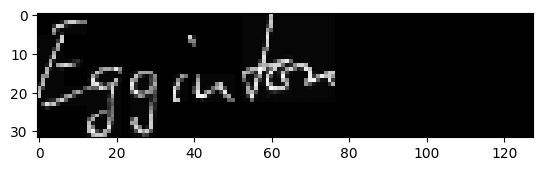



original_text =   cables
predicted text = cables

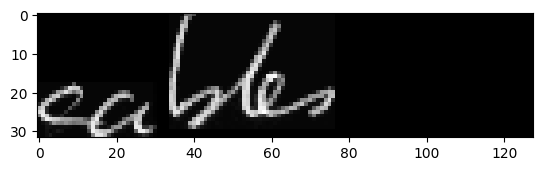



original_text =   :
predicted text = :

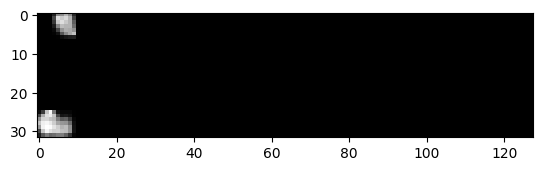



original_text =   President
predicted text = President

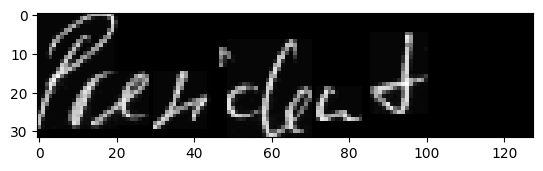



original_text =   Kennedy
predicted text = Kennedy

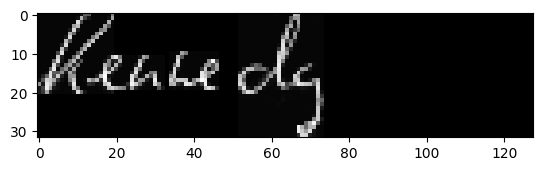



original_text =   at
predicted text = at

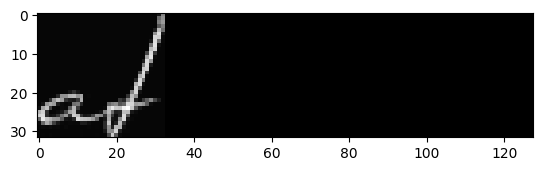



original_text =   his
predicted text = his

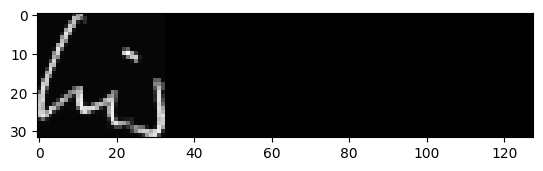



original_text =   Washington
predicted text = Washington

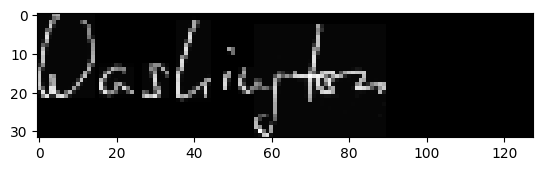



original_text =   Press
predicted text = Press

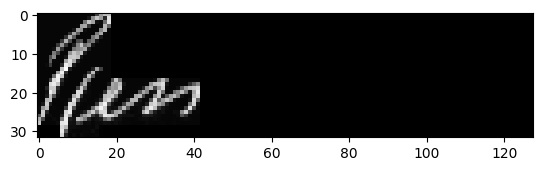



original_text =   ference
predicted text = ference

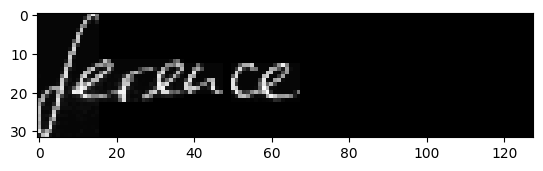



original_text =   admitted
predicted text = admitted

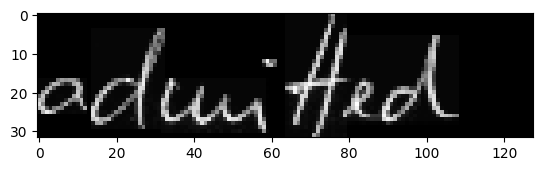



original_text =   he
predicted text = he

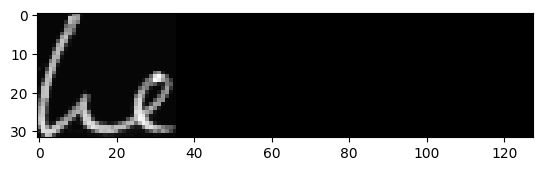



original_text =   did
predicted text = did

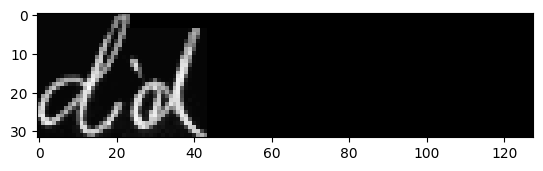



original_text =   not
predicted text = not

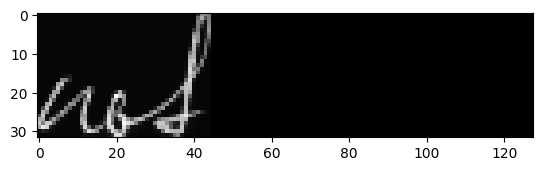



original_text =   know
predicted text = know

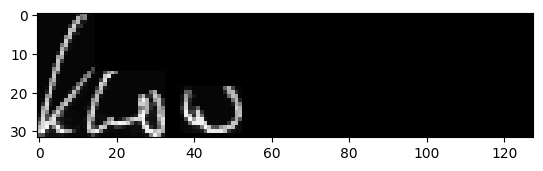



original_text =   whether
predicted text = whether

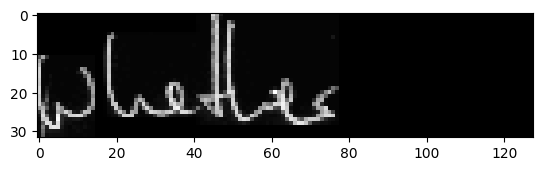



original_text =   America
predicted text = America

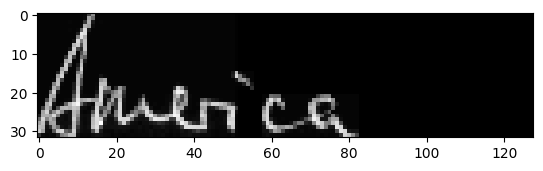



original_text =   was
predicted text = was

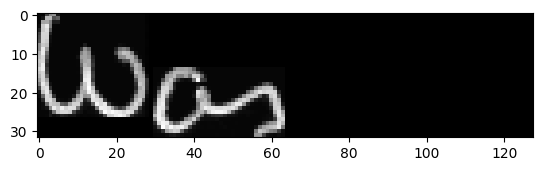



original_text =   behind
predicted text = behind

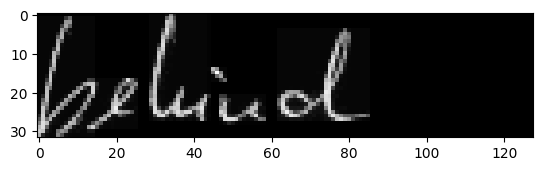



original_text =   Russia
predicted text = Russia

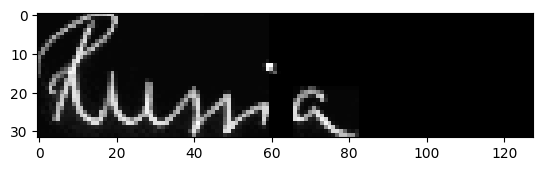



original_text =   in
predicted text = in

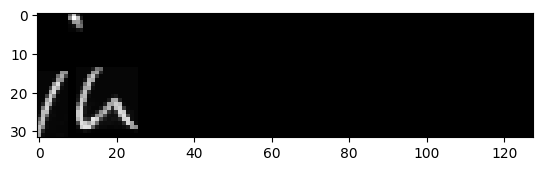



original_text =   missile
predicted text = missile

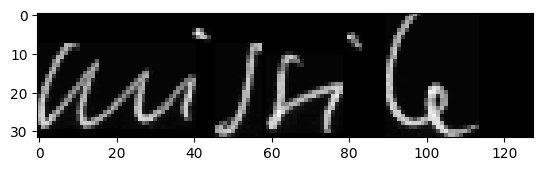



original_text =   power
predicted text = power

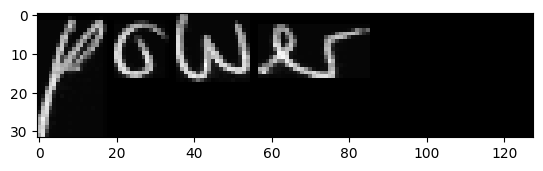



original_text =   .
predicted text = .

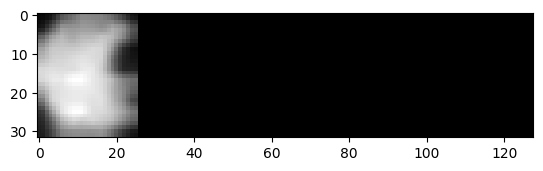



original_text =   He
predicted text = He

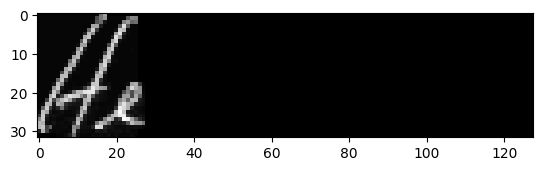



original_text =   said
predicted text = said

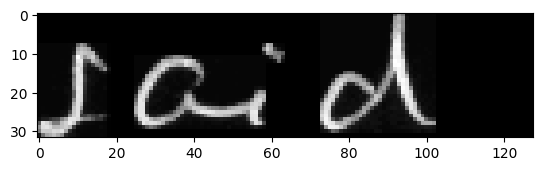



original_text =   he
predicted text = he

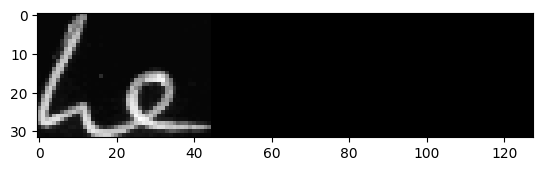



original_text =   waiting
predicted text = waiting

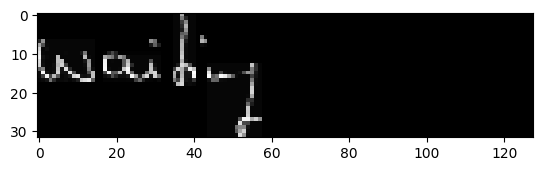



original_text =   for
predicted text = for

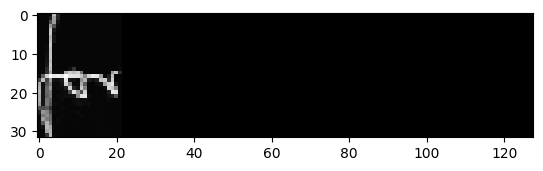



original_text =   his
predicted text = his

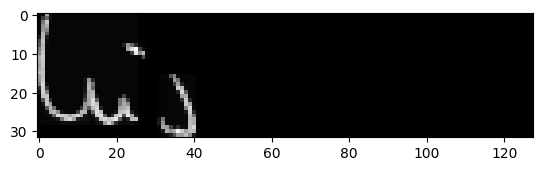



original_text =   senior
predicted text = senior

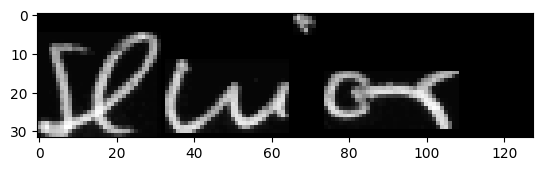



original_text =   military
predicted text = military

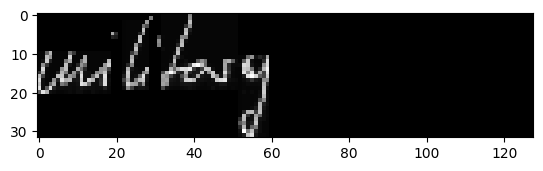



original_text =   aides
predicted text = aides

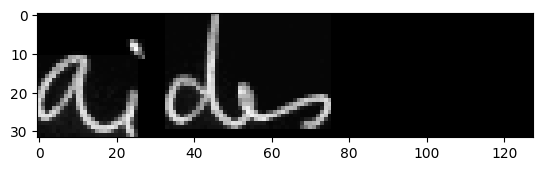



original_text =   to
predicted text = to

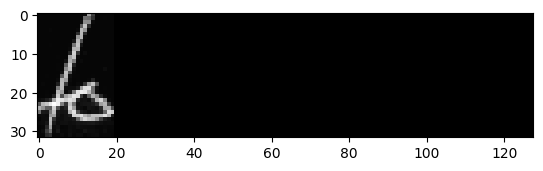



original_text =   come
predicted text = come

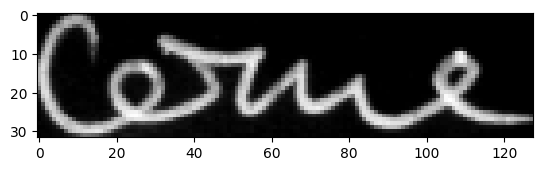



original_text =   up
predicted text = up

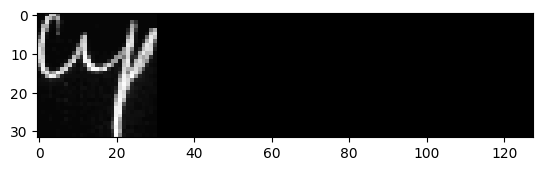



original_text =   the
predicted text = the

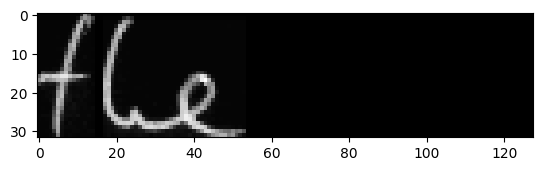



original_text =   answer
predicted text = answer

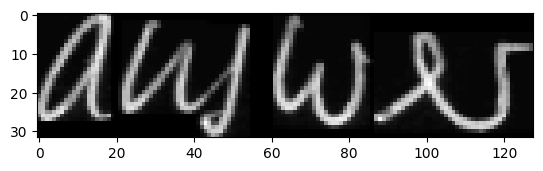



original_text =   on
predicted text = on

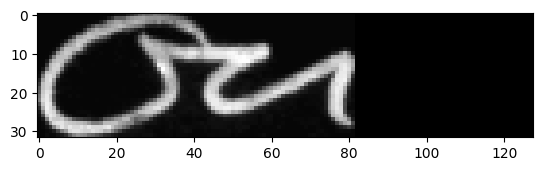



original_text =   February
predicted text = February

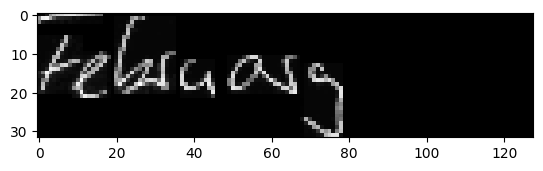



original_text =   20
predicted text = 20

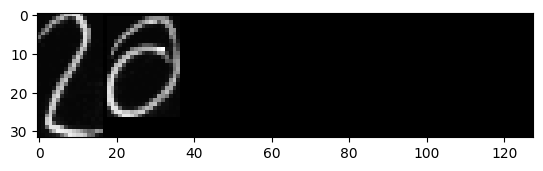



original_text =   .
predicted text = .

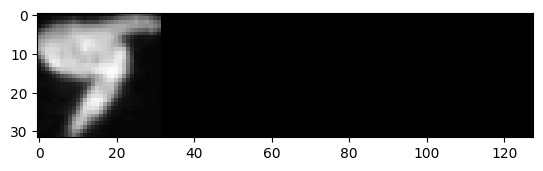



original_text =   Germany
predicted text = Germany

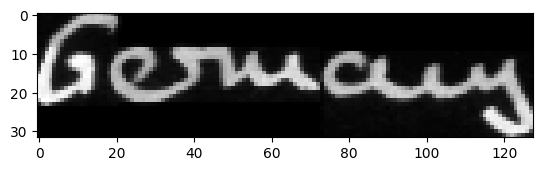



original_text =   ,
predicted text = ,

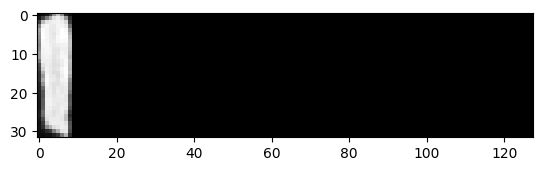



original_text =   Dr.
predicted text = Dr.

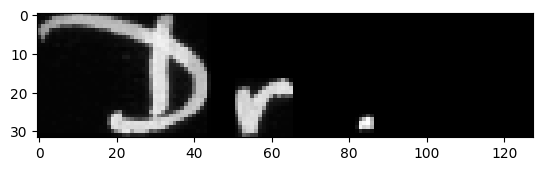



original_text =   Adenauer
predicted text = Adenauer

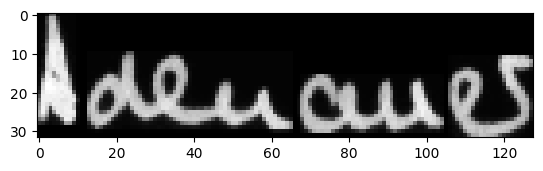



original_text =   in
predicted text = in

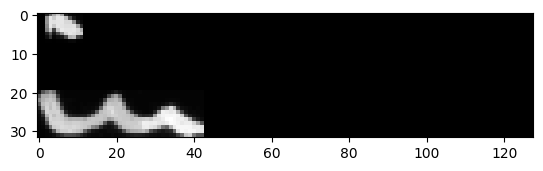



original_text =   a
predicted text = a

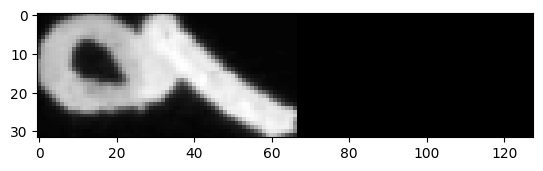



original_text =   tough
predicted text = tough

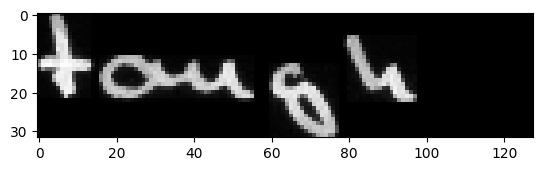



original_text =   spot
predicted text = spot

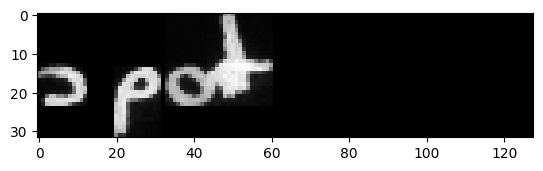



original_text =   .
predicted text = .

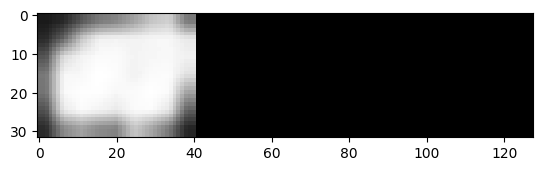



original_text =   Joyce
predicted text = Joyce

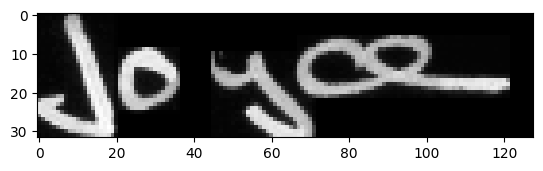



original_text =   Egginton
predicted text = Egginton

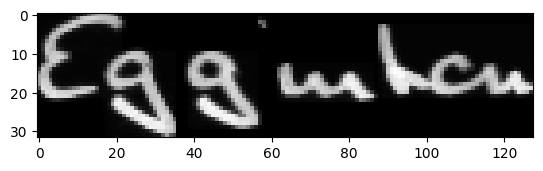



original_text =   cables
predicted text = cables

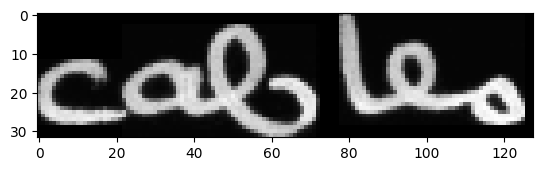



original_text =   :
predicted text = :

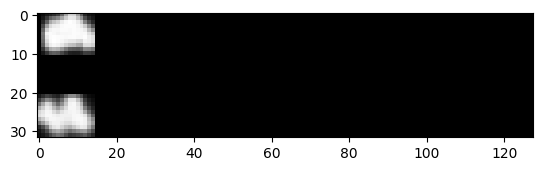



original_text =   Kennedy
predicted text = Kennedy

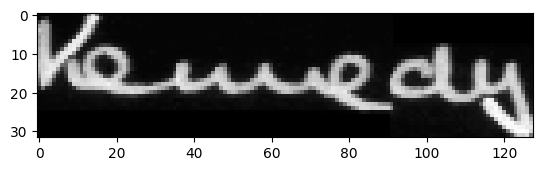



original_text =   at
predicted text = at

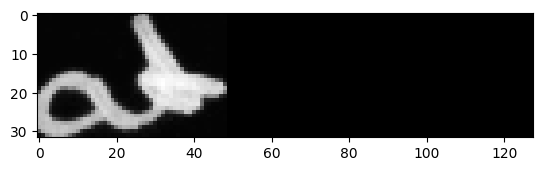



original_text =   his
predicted text = his

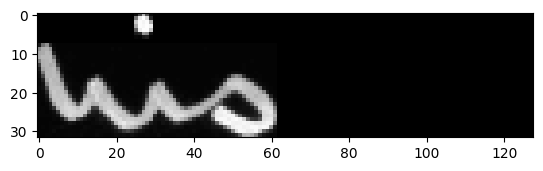



original_text =   Washington
predicted text = Washington

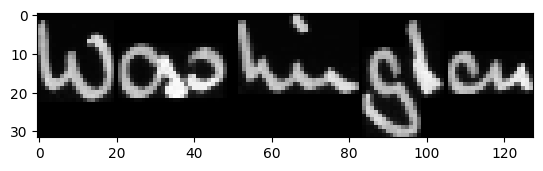



original_text =   Press
predicted text = Press

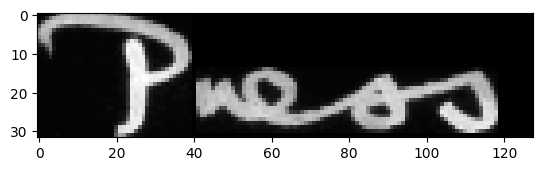



original_text =   conference
predicted text = conference

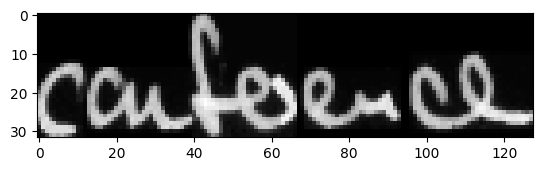



original_text =   admitted
predicted text = admitted

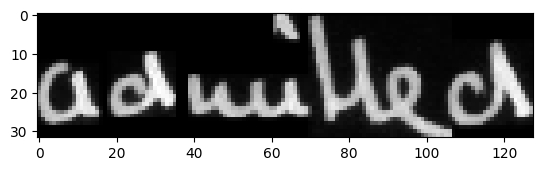



original_text =   he
predicted text = he

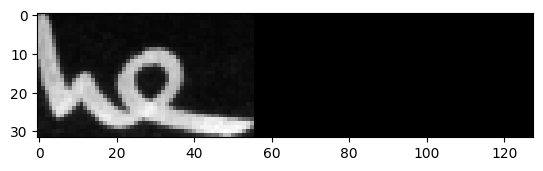



original_text =   did
predicted text = did

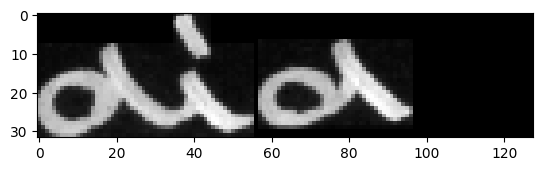



original_text =   know
predicted text = know

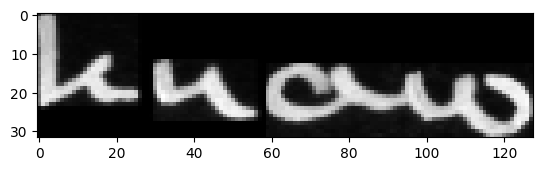



original_text =   whether
predicted text = whether

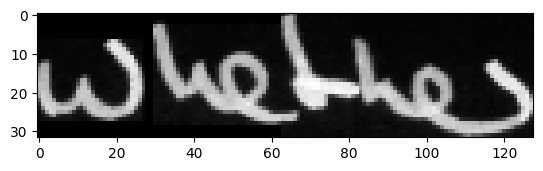



original_text =   America
predicted text = America

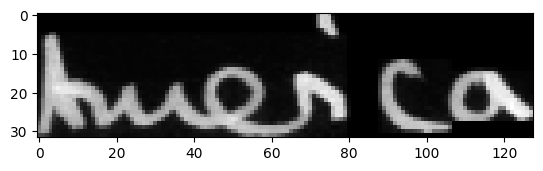



original_text =   was
predicted text = was

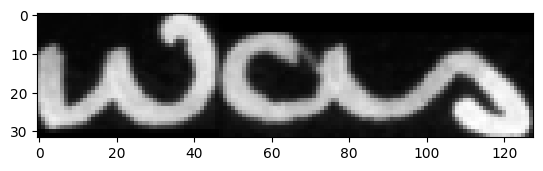



original_text =   lagging
predicted text = lagging

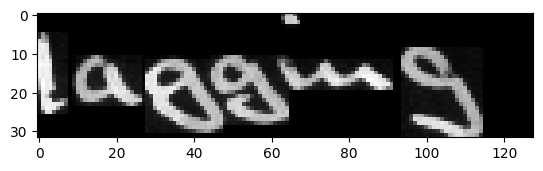



original_text =   behind
predicted text = behind

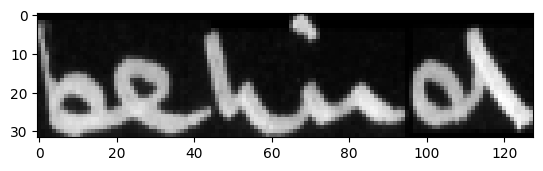



original_text =   Russia
predicted text = Russia

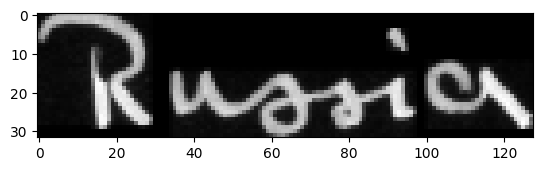



original_text =   in
predicted text = in

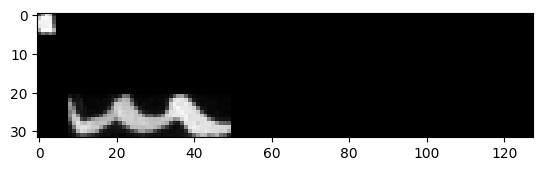



original_text =   missile
predicted text = missile

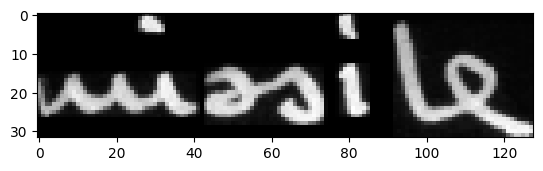



original_text =   .
predicted text = .

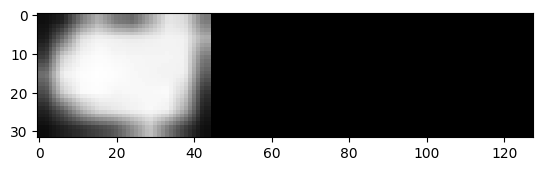



original_text =   He
predicted text = He

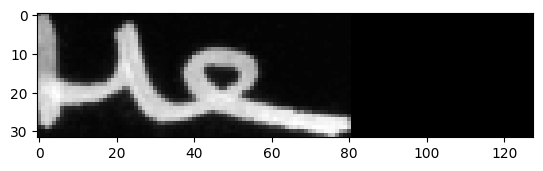



original_text =   said
predicted text = said

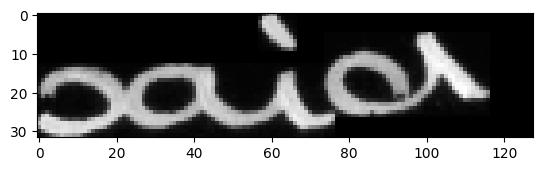



original_text =   he
predicted text = he

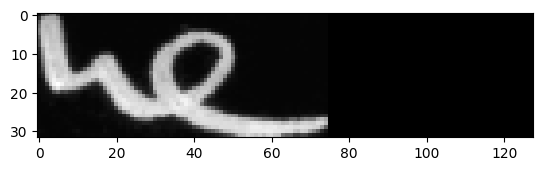



original_text =   was
predicted text = was

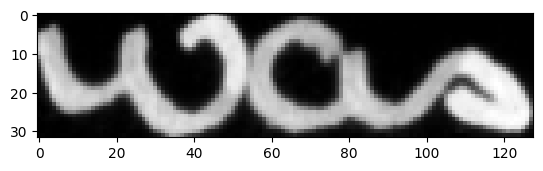



original_text =   waiting
predicted text = waiting

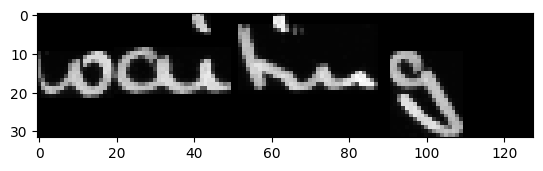



original_text =   for
predicted text = for

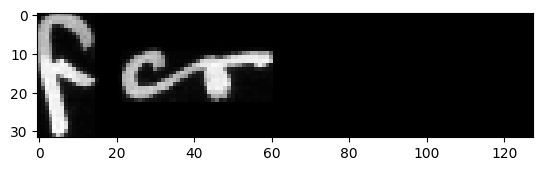



original_text =   his
predicted text = his

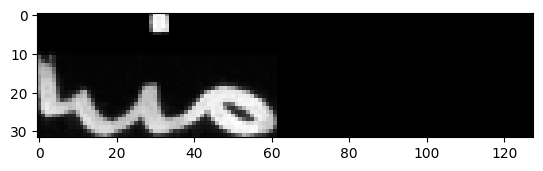



original_text =   senior
predicted text = senior

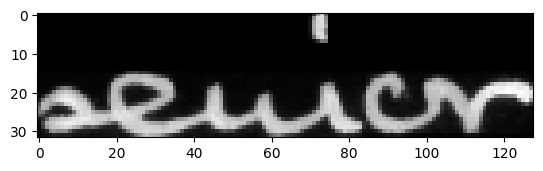



original_text =   aides
predicted text = aides

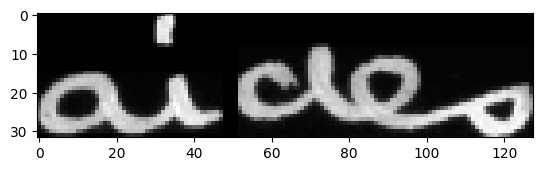



original_text =   to
predicted text = to

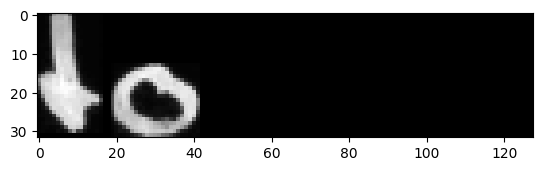



original_text =   come
predicted text = come

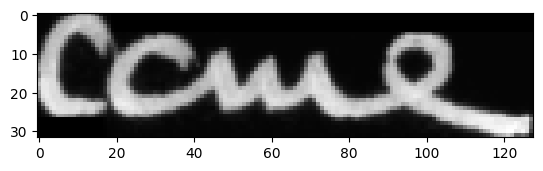



original_text =   up
predicted text = up

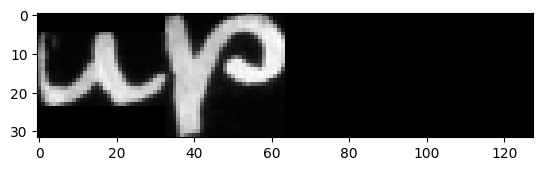



original_text =   with
predicted text = with

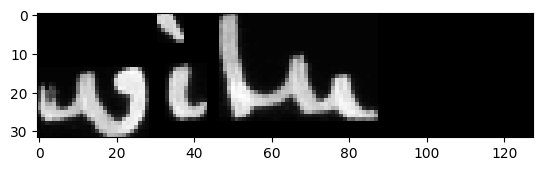



original_text =   the
predicted text = the

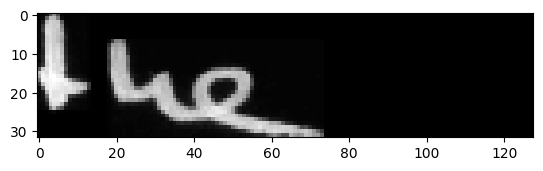



original_text =   answer
predicted text = answer

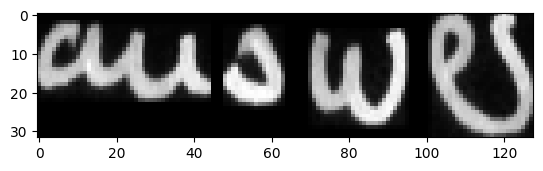



original_text =   on
predicted text = on

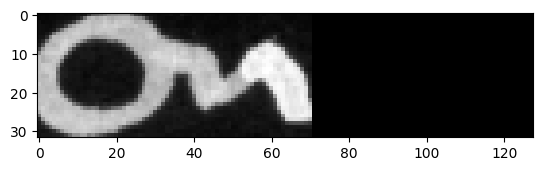



original_text =   February
predicted text = February

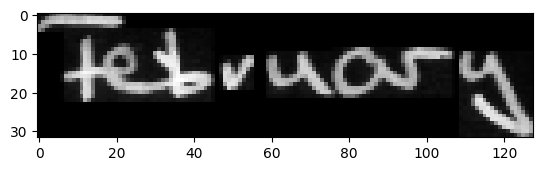



original_text =   .
predicted text = .

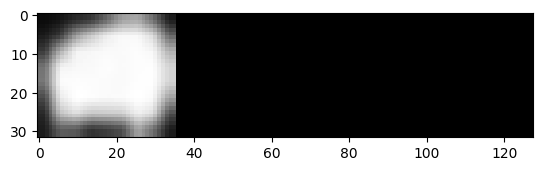



original_text =   This
predicted text = This

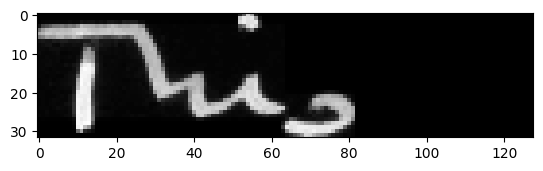



original_text =   surprising
predicted text = surprising

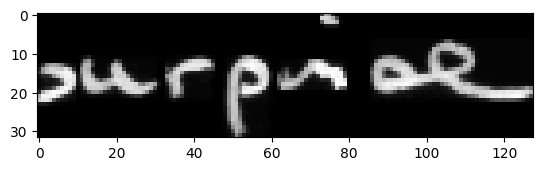



original_text =   statement
predicted text = statement

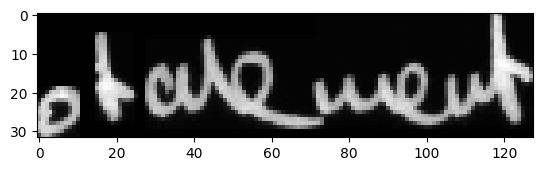



original_text =   was
predicted text = was

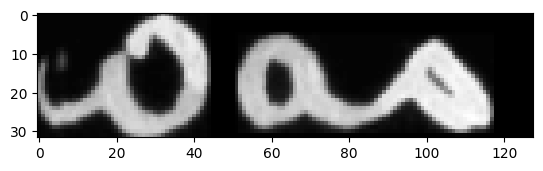



original_text =   a
predicted text = a

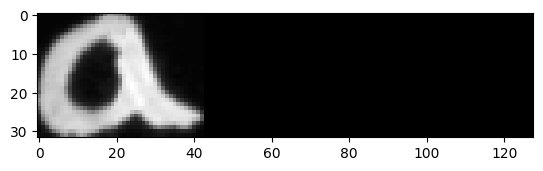



original_text =   sharp
predicted text = sharp

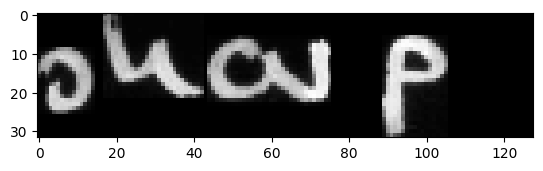



original_text =   about-
predicted text = about-

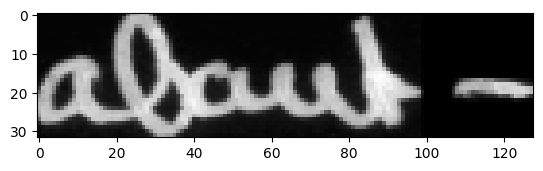



original_text =   face
predicted text = face

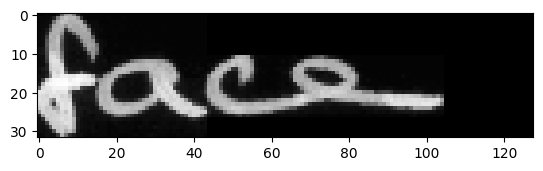



original_text =   his
predicted text = his

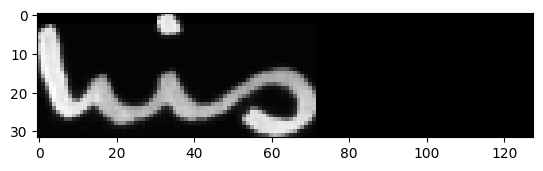



original_text =   warnings
predicted text = warnings

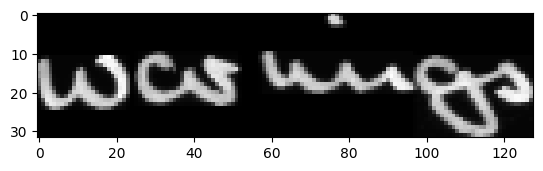



original_text =   during
predicted text = during

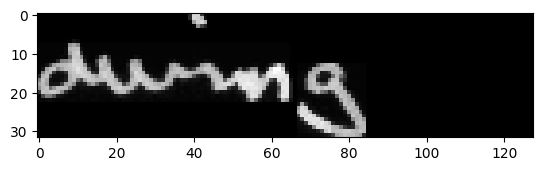



original_text =   the
predicted text = the

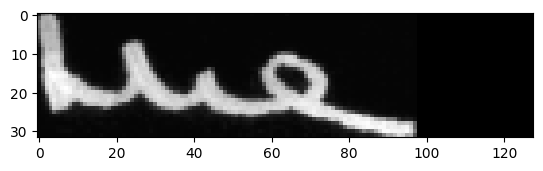



original_text =   Presidential
predicted text = Presidential

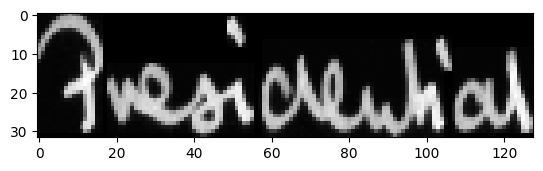



original_text =   election
predicted text = election

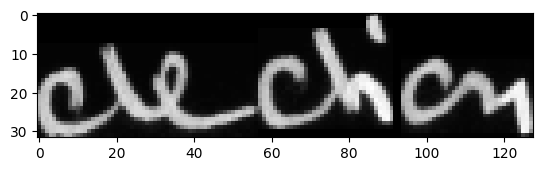



original_text =   campaign
predicted text = campaign

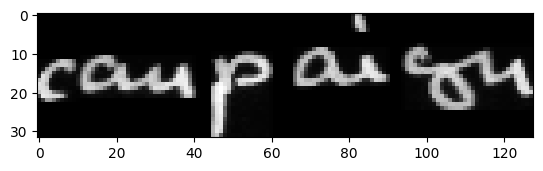



original_text =   .
predicted text = .

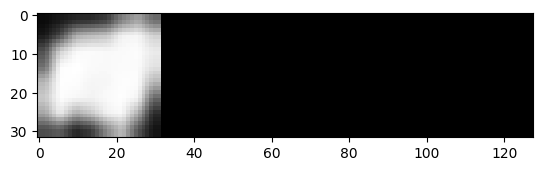



original_text =   He
predicted text = He

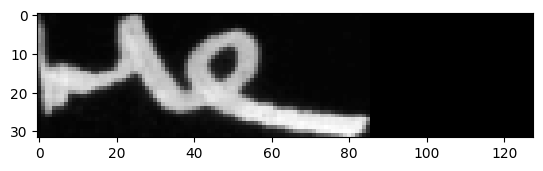



original_text =   slackness
predicted text = slackness

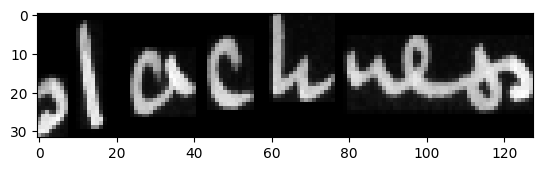



original_text =   in
predicted text = in

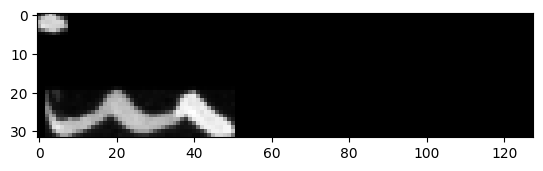



original_text =   the
predicted text = the

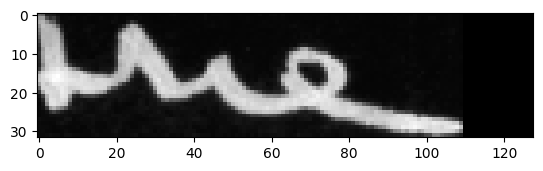



original_text =   Eisenhower
predicted text = Eisenhower

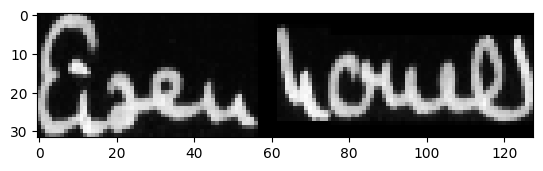



original_text =   Administration
predicted text = Administration

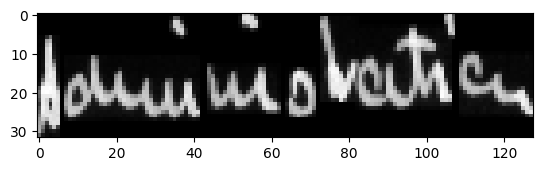



original_text =   had
predicted text = had

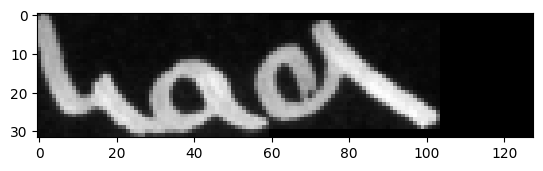



original_text =   caused
predicted text = caused

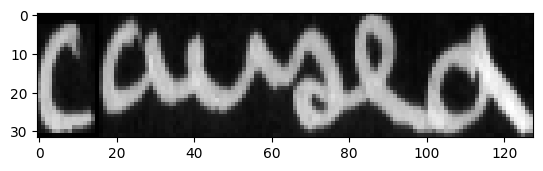



original_text =   America
predicted text = America

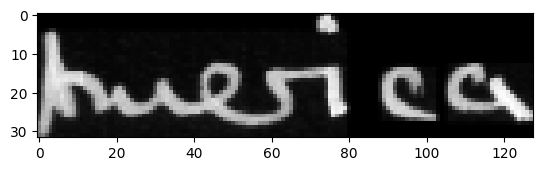



original_text =   to
predicted text = to

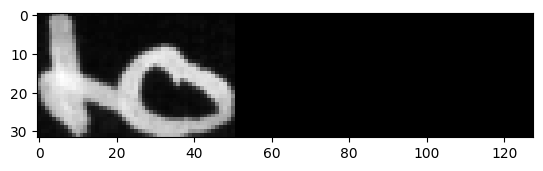



original_text =   behind
predicted text = behind

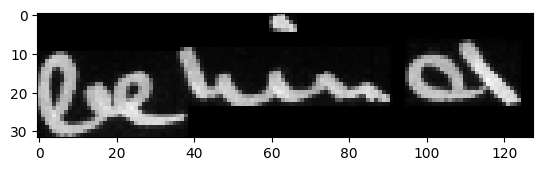



original_text =   Russia
predicted text = Russia

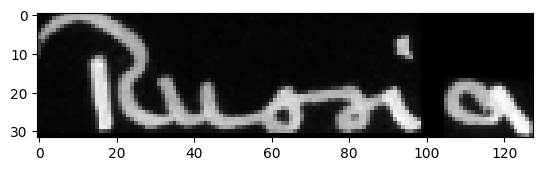



original_text =   in
predicted text = in

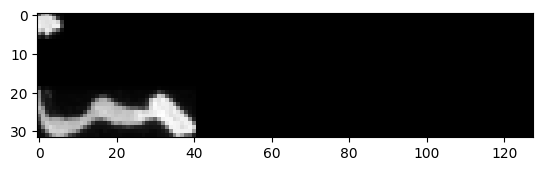



original_text =   nuclear
predicted text = nuclear

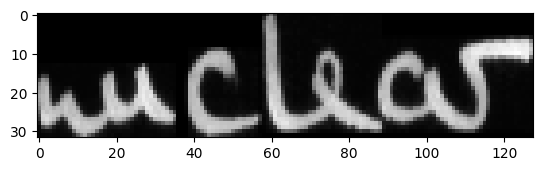



original_text =   development
predicted text = development

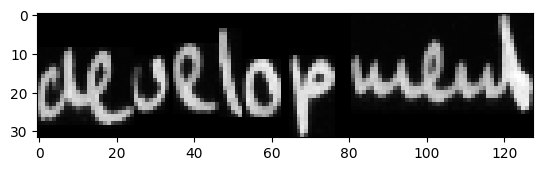



original_text =   .
predicted text = .

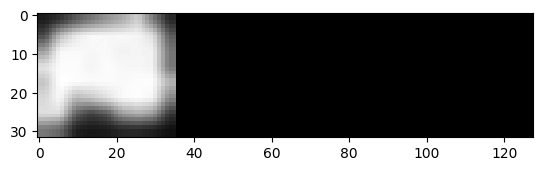



original_text =   President
predicted text = President

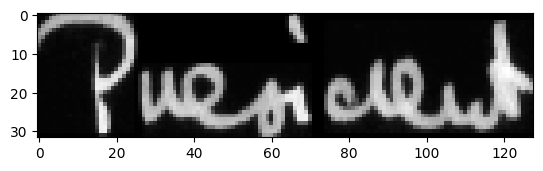



original_text =   Kennedy
predicted text = Kennedy

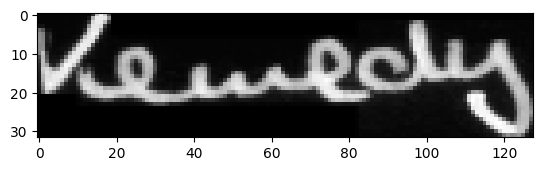



original_text =   did
predicted text = did

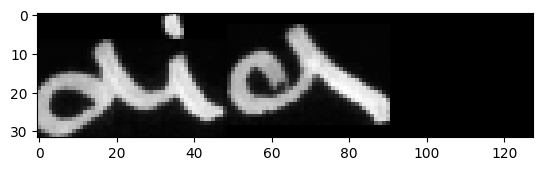



original_text =   best
predicted text = best

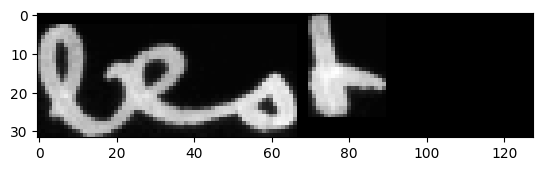



original_text =   to
predicted text = to

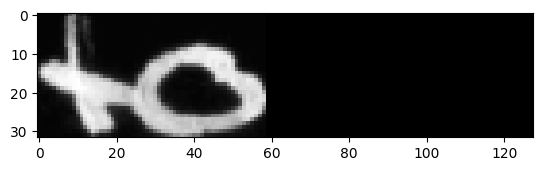



original_text =   avoid
predicted text = avoid

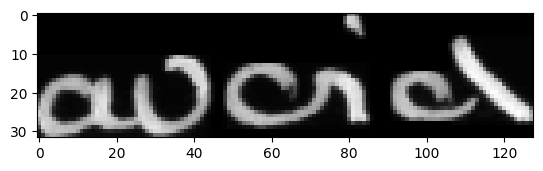



original_text =   giving
predicted text = giving

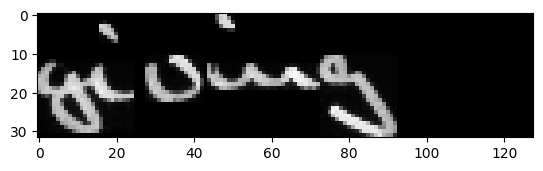



original_text =   Pressmen
predicted text = Pressmen

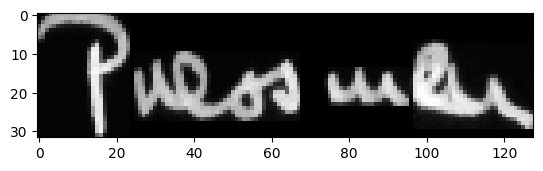



original_text =   a
predicted text = a

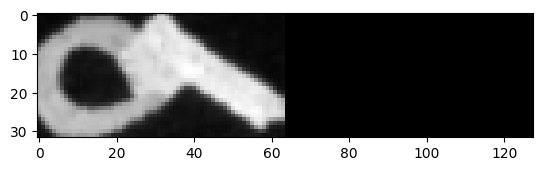



original_text =   direct
predicted text = direct

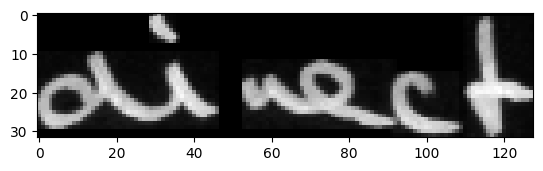



original_text =   answer
predicted text = answer

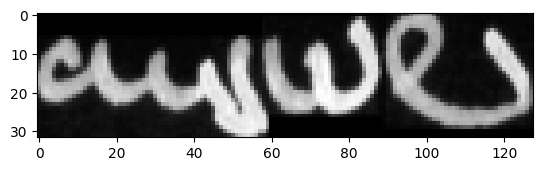



original_text =   .
predicted text = .

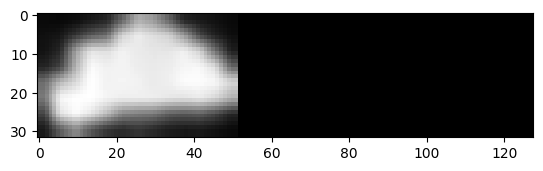



original_text =   Brown
predicted text = Brown

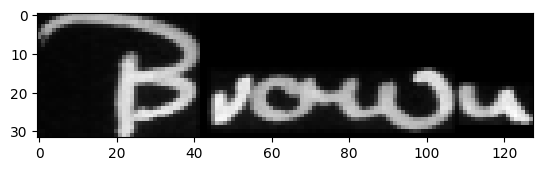



original_text =   CHILDREN
predicted text = CHILDREN

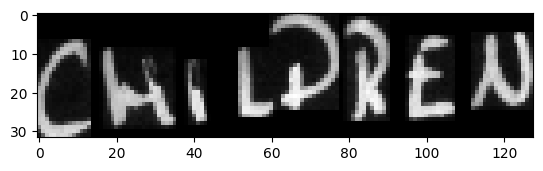



original_text =   TWO
predicted text = TWO

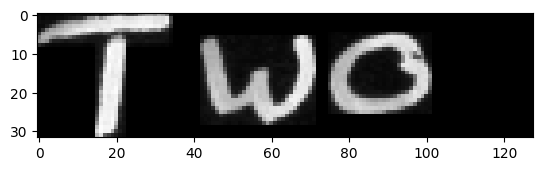



original_text =   men
predicted text = men

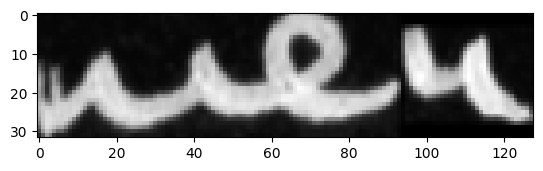



original_text =   who
predicted text = who

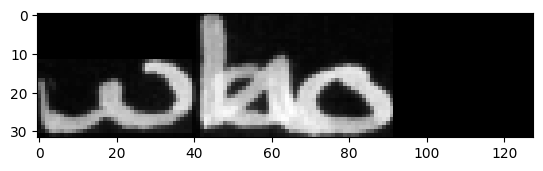



original_text =   are
predicted text = are

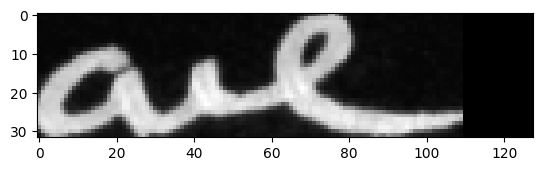



original_text =   poles
predicted text = poles

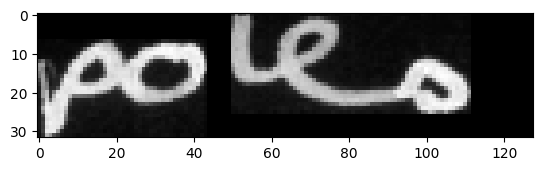



original_text =   apart
predicted text = apart

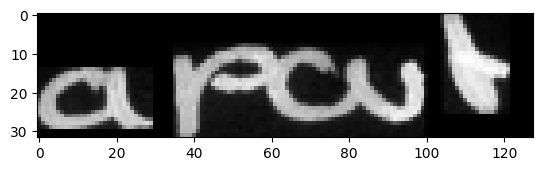



original_text =   in
predicted text = in

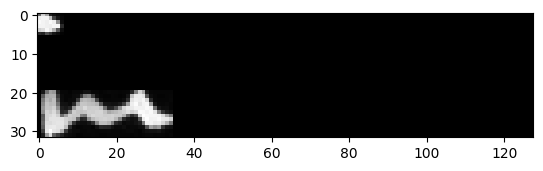



original_text =   last
predicted text = last

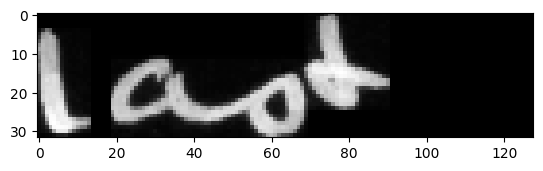



original_text =   night
predicted text = night

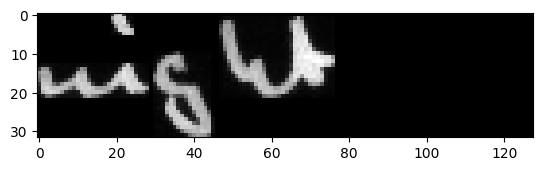



original_text =   dominated
predicted text = dominated

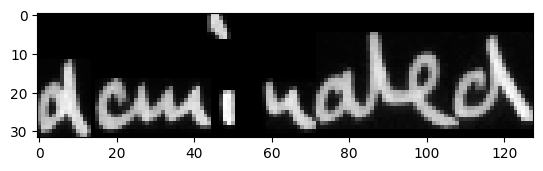



original_text =   Mr.
predicted text = Mr.

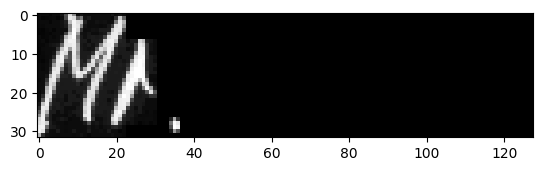



original_text =   Brown
predicted text = Brown

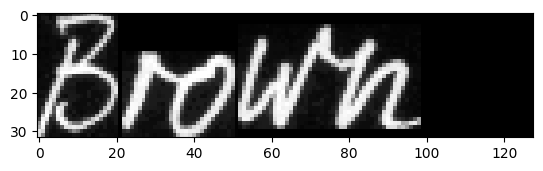



original_text =   ,
predicted text = ,

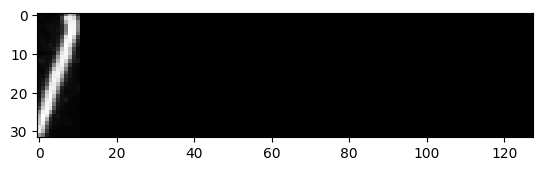



original_text =   passionate
predicted text = passionate

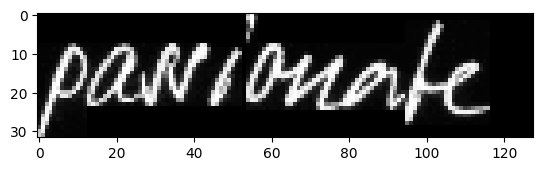



original_text =   and
predicted text = and

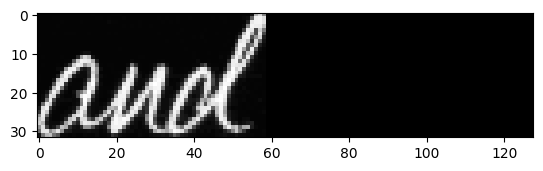



original_text =   warm-hearted
predicted text = warm-hearted

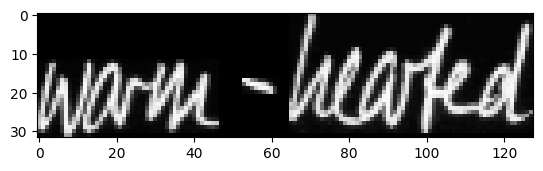



original_text =   led
predicted text = led

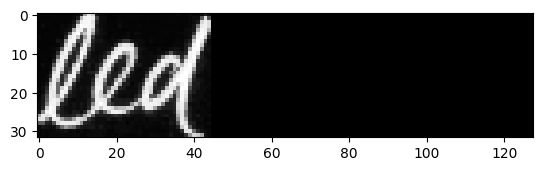



original_text =   Labour's
predicted text = Labour's

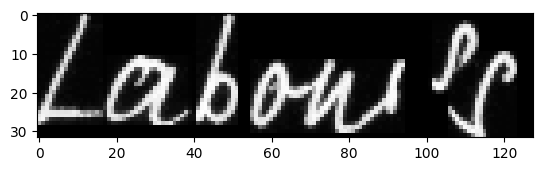



original_text =   attack
predicted text = attack

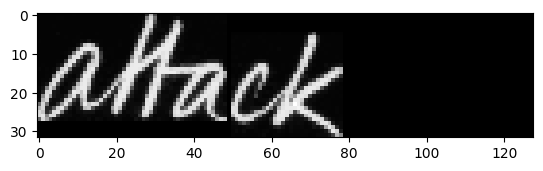



original_text =   on
predicted text = on

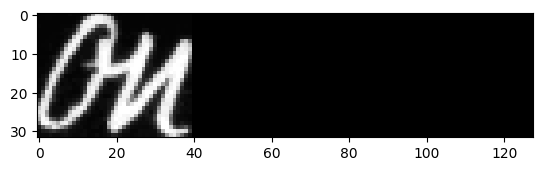



original_text =   the
predicted text = the

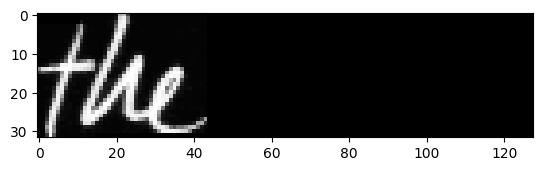



original_text =   higher
predicted text = higher

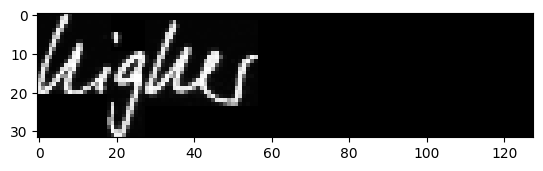



original_text =   health
predicted text = health

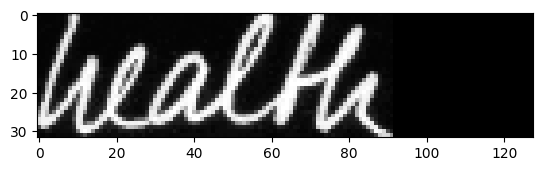



original_text =   charges
predicted text = charges

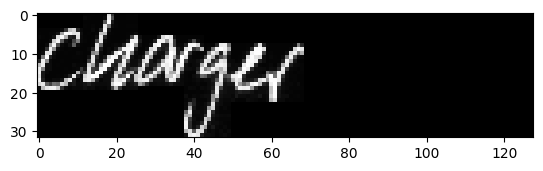



original_text =   .
predicted text = .

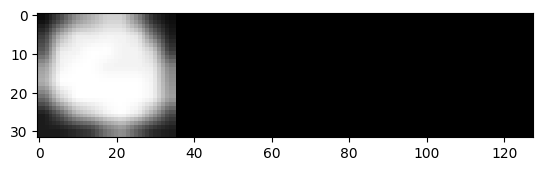



original_text =   Powell
predicted text = Powell

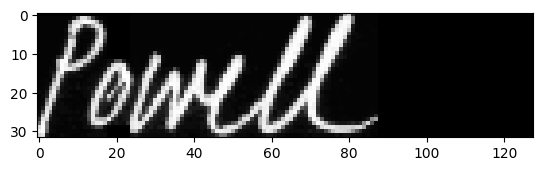



original_text =   ,
predicted text = ,

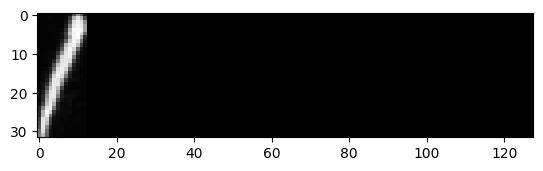



original_text =   white-faced
predicted text = white-faced

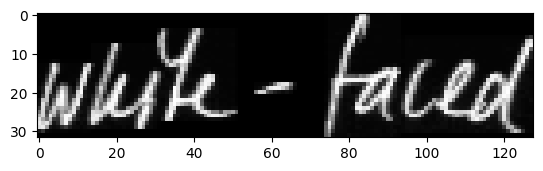



original_text =   and
predicted text = and

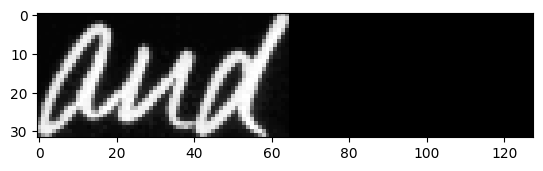



original_text =   outwardly
predicted text = outwardly

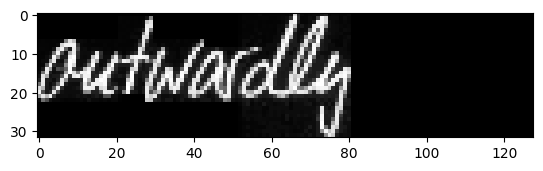



original_text =   unemotional
predicted text = unemotional

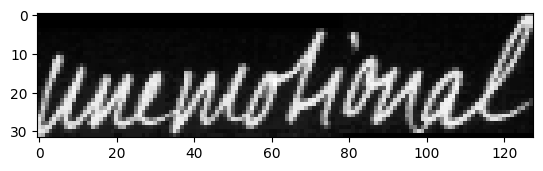



original_text =   ,
predicted text = ,

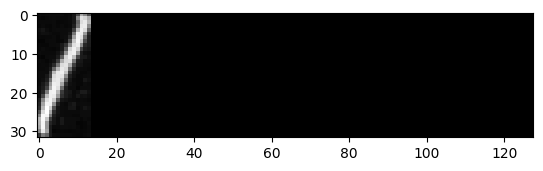



original_text =   replied
predicted text = replied

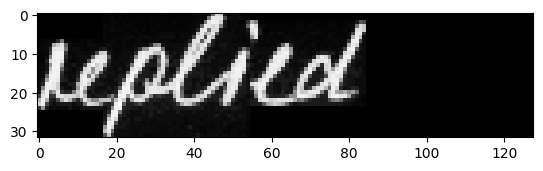



original_text =   with
predicted text = with

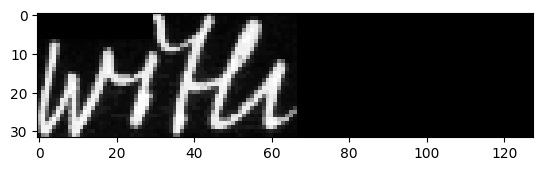



original_text =   statistical
predicted text = statistical

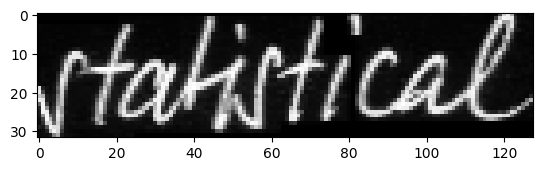



original_text =   state-
predicted text = state-

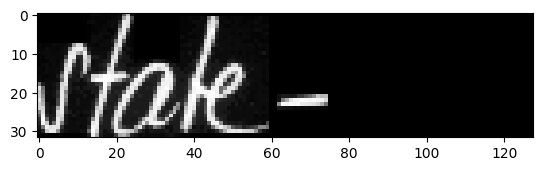



original_text =   ment
predicted text = ment

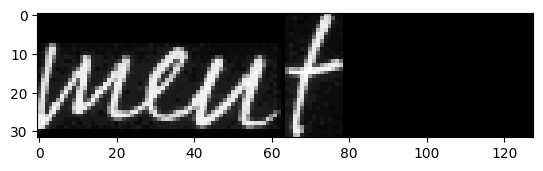



original_text =   -
predicted text = -

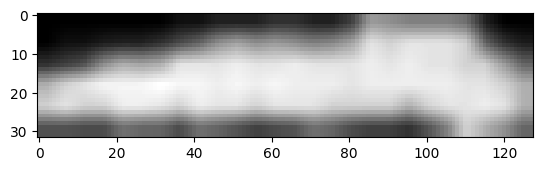



original_text =   and
predicted text = and

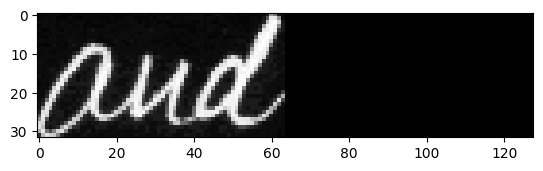



original_text =   ended
predicted text = ended

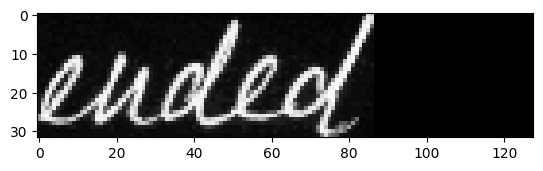



original_text =   by
predicted text = by

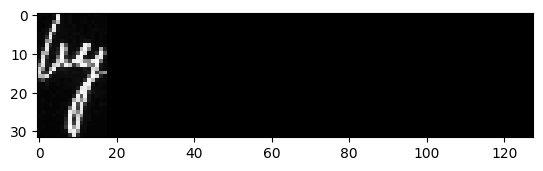



original_text =   inciting
predicted text = inciting

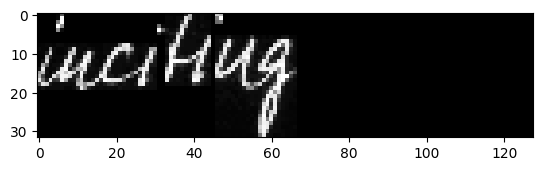



original_text =   Labour
predicted text = Labour

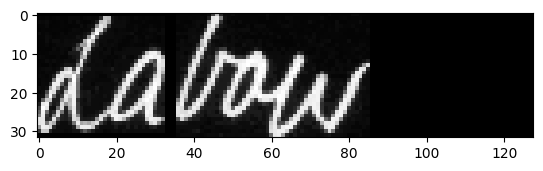



original_text =   to
predicted text = to

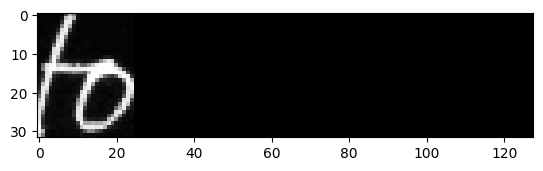



original_text =   angry
predicted text = angry

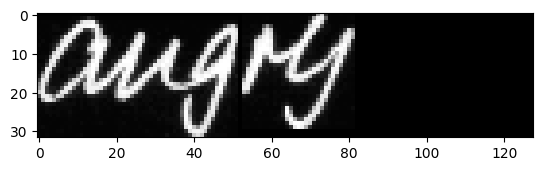



original_text =   uproar
predicted text = uproar

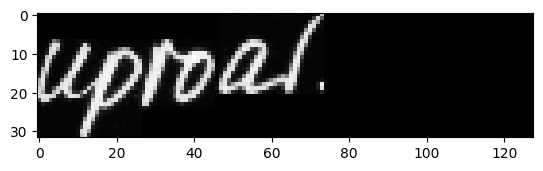



original_text =   .
predicted text = .

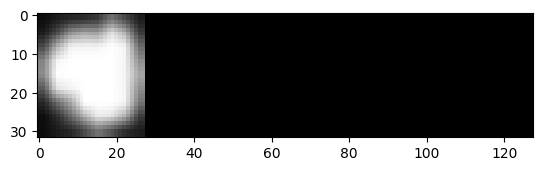



original_text =   One
predicted text = One

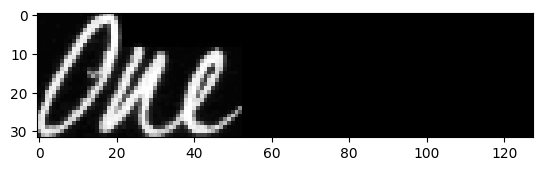



original_text =   dealt
predicted text = dealt

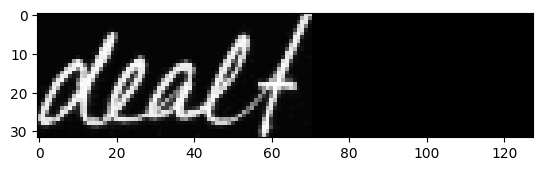



original_text =   with
predicted text = with

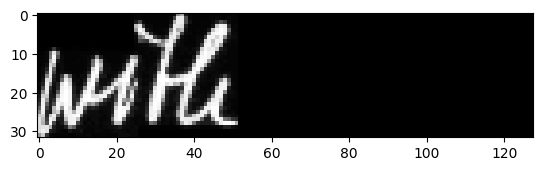



original_text =   the
predicted text = the

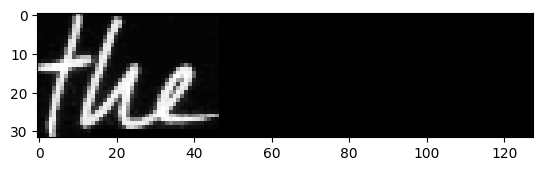



original_text =   human
predicted text = human

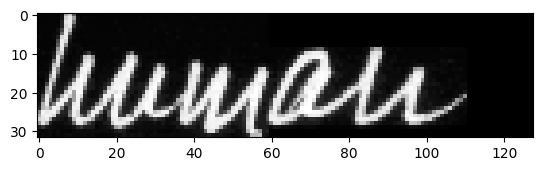



original_text =   behind
predicted text = behind

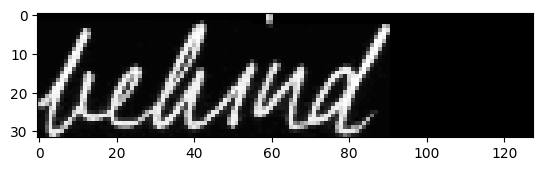



original_text =   the
predicted text = the

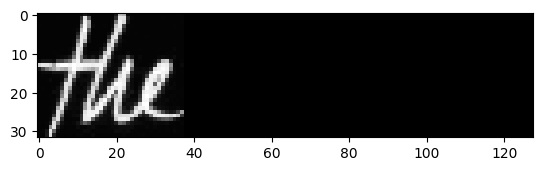



original_text =   Health
predicted text = Health

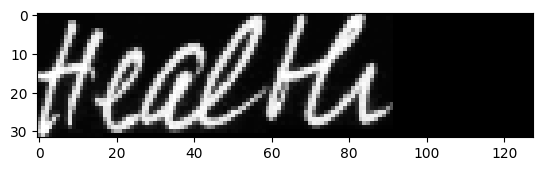



original_text =   Service
predicted text = Service

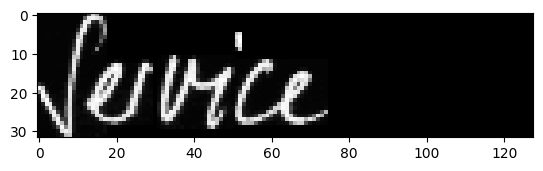



original_text =   ;
predicted text = ;

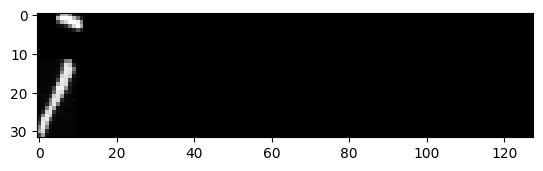



original_text =   the
predicted text = the

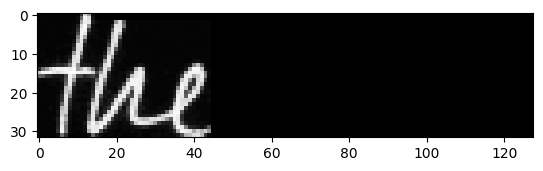



original_text =   other
predicted text = other

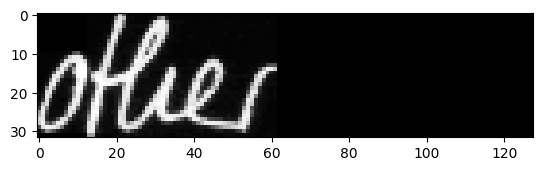



original_text =   always
predicted text = always

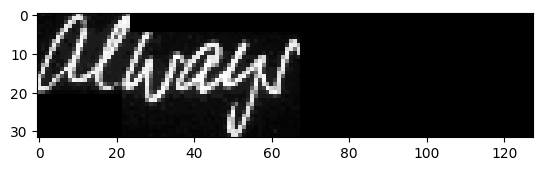



original_text =   come
predicted text = come

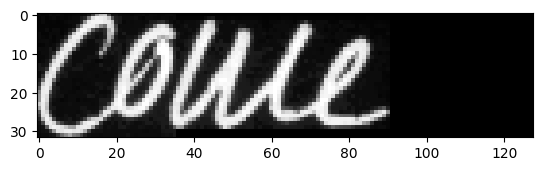



original_text =   first
predicted text = first

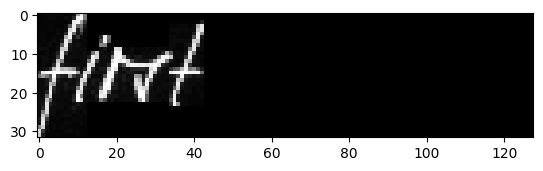



original_text =   .
predicted text = .

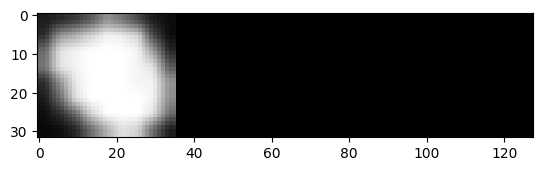



original_text =   Mr.
predicted text = Mr.

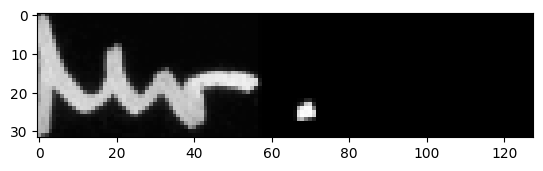



original_text =   ,
predicted text = ,

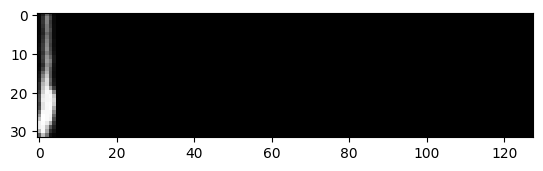



original_text =   passionate
predicted text = passionate

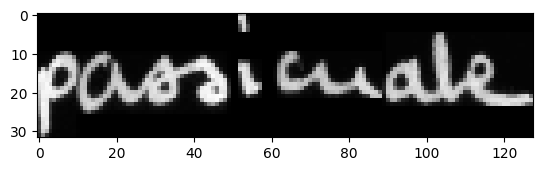



original_text =   and
predicted text = and

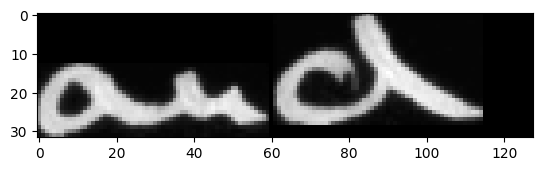



original_text =   warm-hearted
predicted text = warm-hearted

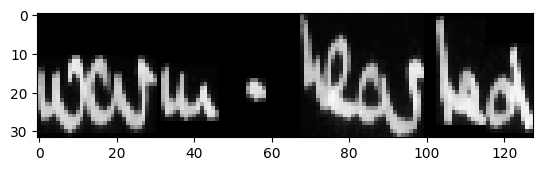



original_text =   ,
predicted text = ,

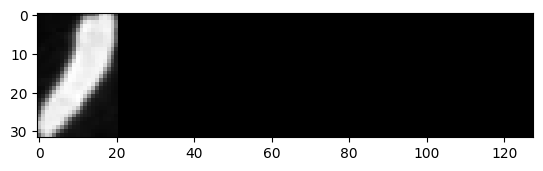



original_text =   led
predicted text = led

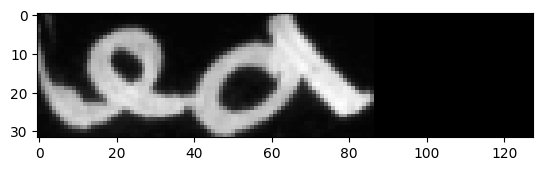



original_text =   Labour's
predicted text = Labour's

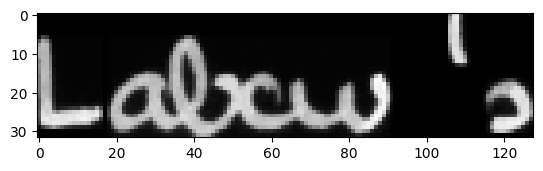



original_text =   attack
predicted text = attack

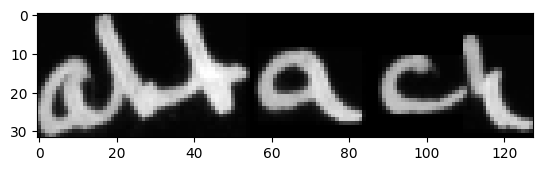



original_text =   on
predicted text = on

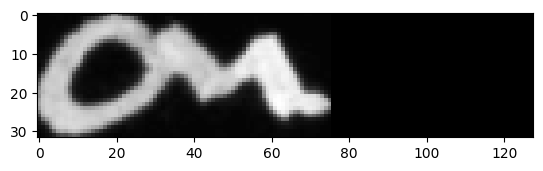



original_text =   higher
predicted text = higher

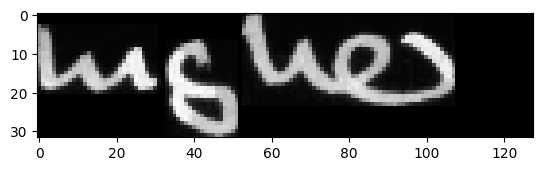



original_text =   health
predicted text = health

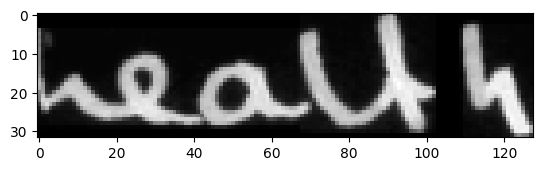



original_text =   charges
predicted text = charges

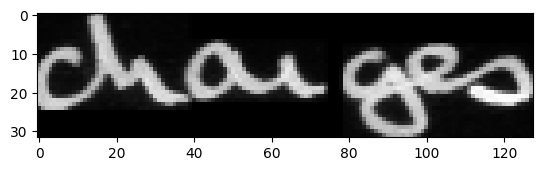



original_text =   .
predicted text = .

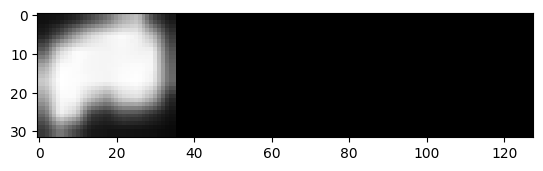



original_text =   Mr.
predicted text = Mr.

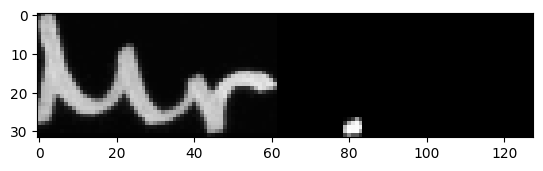



original_text =   Powell
predicted text = Powell

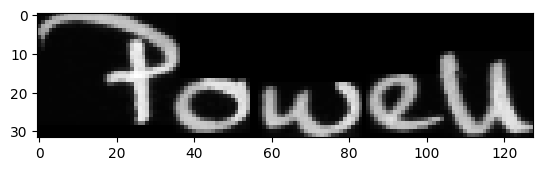



original_text =   ,
predicted text = ,

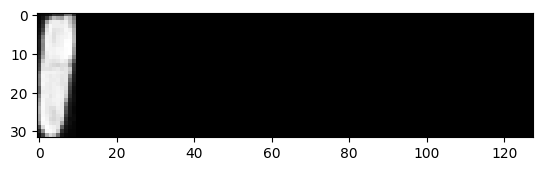



original_text =   white-faced
predicted text = white-faced

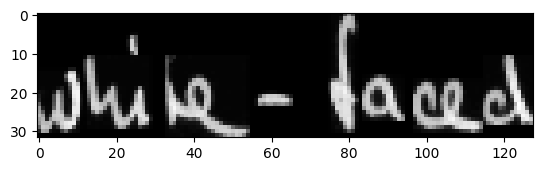



original_text =   and
predicted text = and

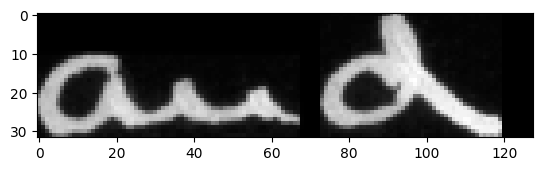



original_text =   unemotional
predicted text = unemotional

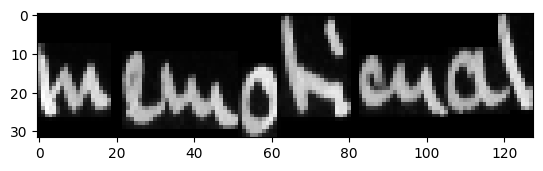



original_text =   ,
predicted text = ,

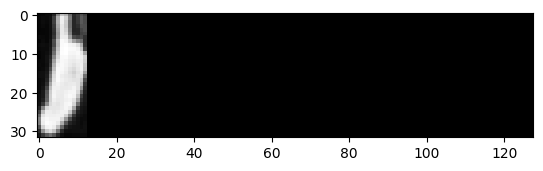



original_text =   replied
predicted text = replied

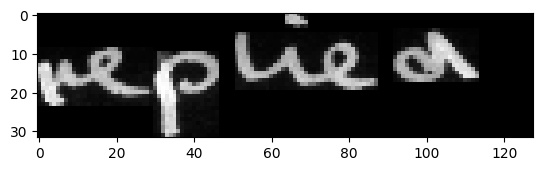



original_text =   with
predicted text = with

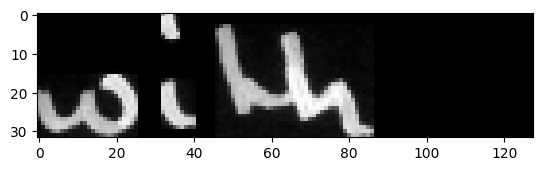



original_text =   a
predicted text = a

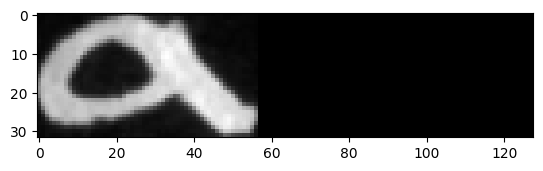



original_text =   statistical
predicted text = statistical

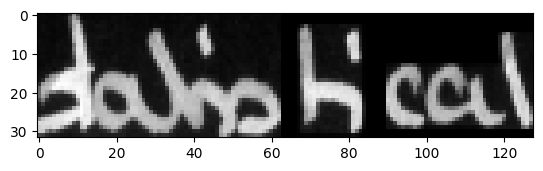



original_text =   statement
predicted text = statement

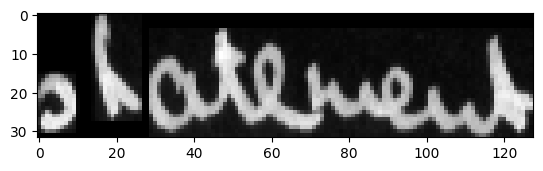



original_text =   -
predicted text = -

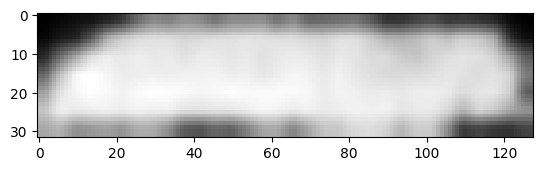



original_text =   and
predicted text = and

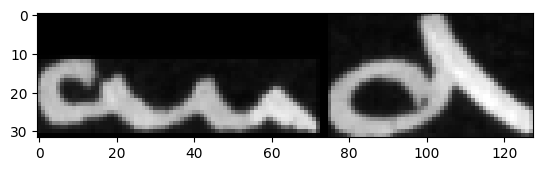



original_text =   by
predicted text = by

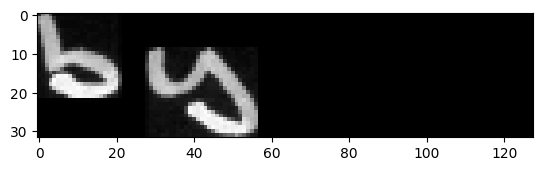



original_text =   inciting
predicted text = inciting

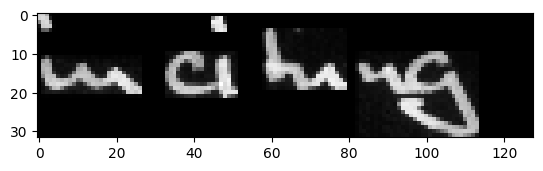



original_text =   Labour
predicted text = Labour

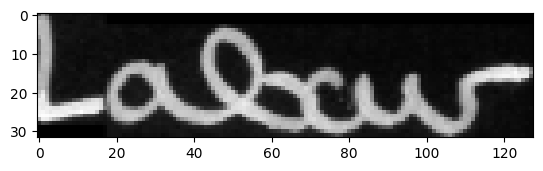



original_text =   MPs
predicted text = MPs

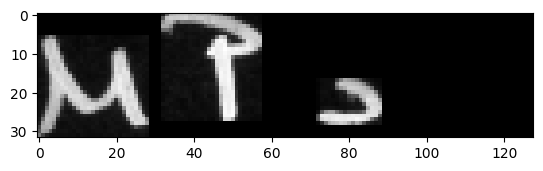



original_text =   to
predicted text = to

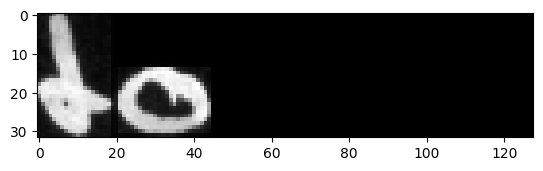



original_text =   angry
predicted text = angry

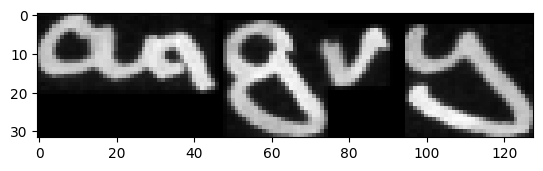



original_text =   uproar
predicted text = uproar

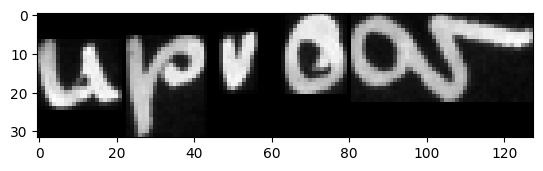



original_text =   .
predicted text = .

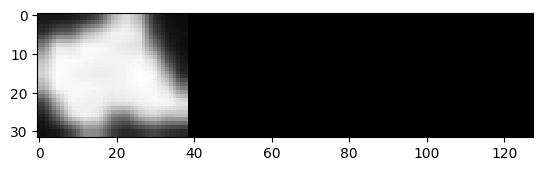



original_text =   One
predicted text = One

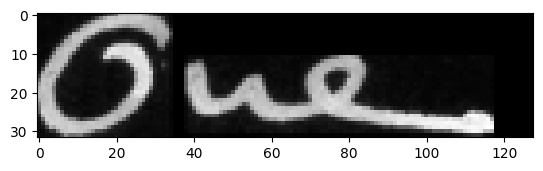



original_text =   with
predicted text = with

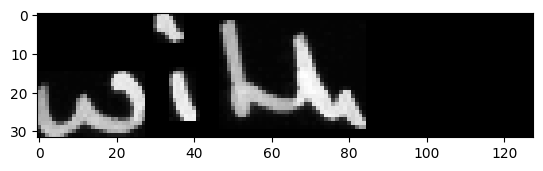



original_text =   the
predicted text = the

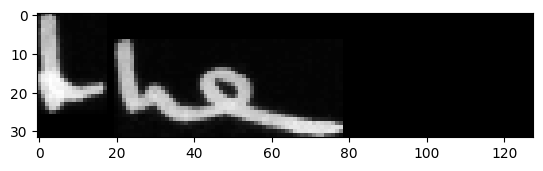



original_text =   human
predicted text = human

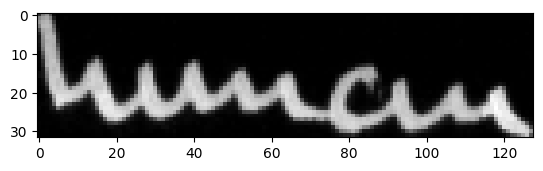



original_text =   issue
predicted text = issue

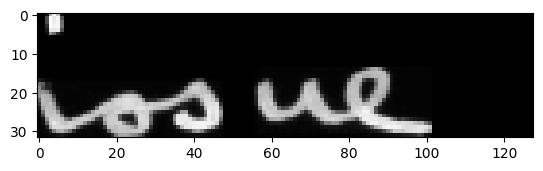



original_text =   behind
predicted text = behind

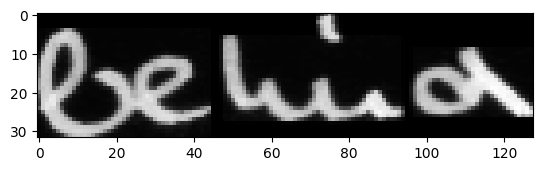



original_text =   the
predicted text = the

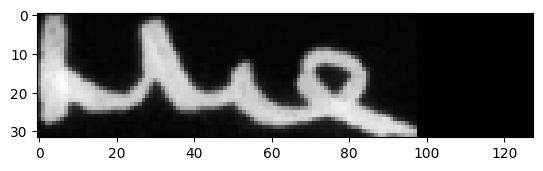



original_text =   Health
predicted text = Health

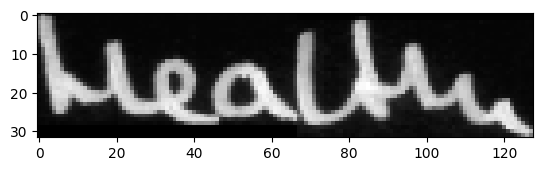



original_text =   Service
predicted text = Service

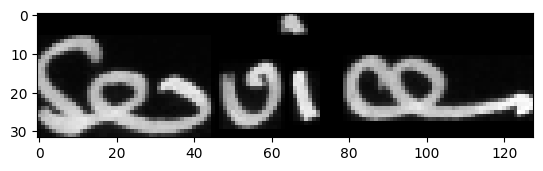



original_text =   ;
predicted text = ;

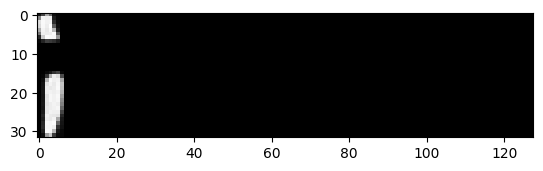



original_text =   other
predicted text = other

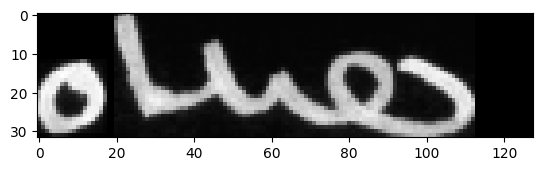



original_text =   tried
predicted text = tried

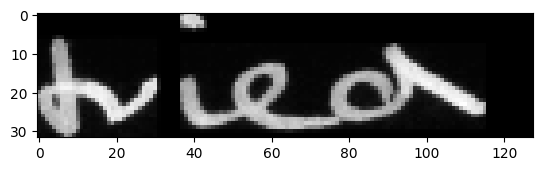



original_text =   to
predicted text = to

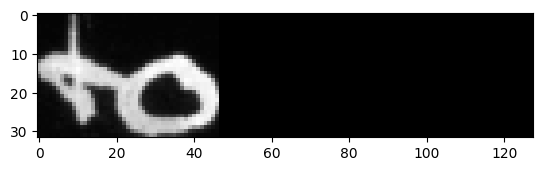



original_text =   show
predicted text = show

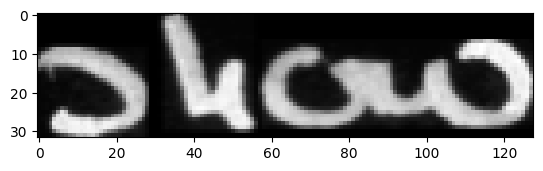



original_text =   that
predicted text = that

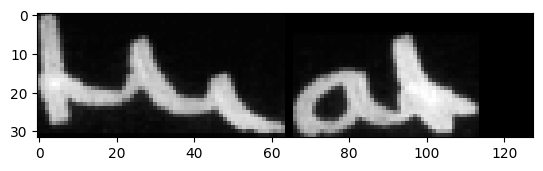



original_text =   the
predicted text = the

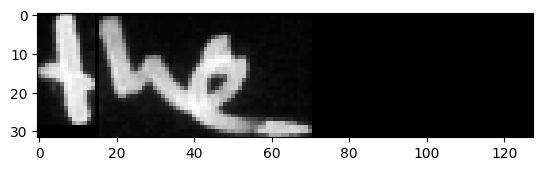



original_text =   balance-sheet
predicted text = balance-sheet

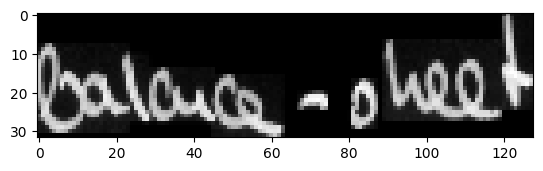



original_text =   must
predicted text = must

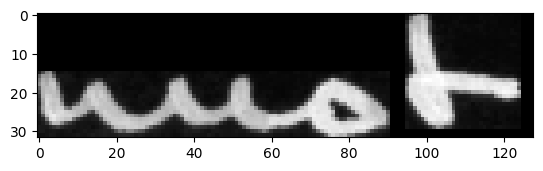



original_text =   always
predicted text = always

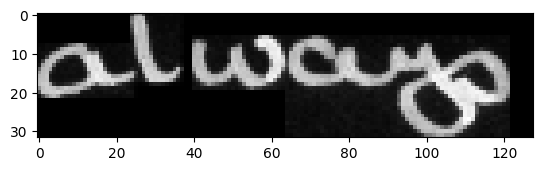



original_text =   first
predicted text = first

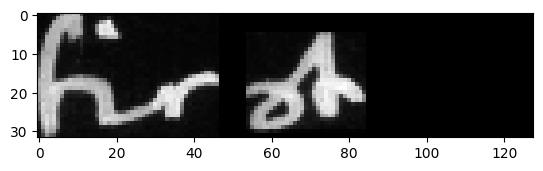



original_text =   .
predicted text = .

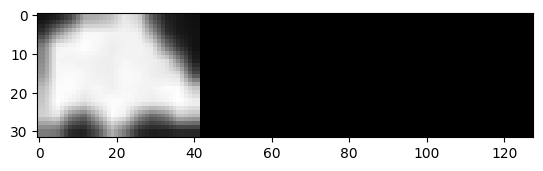



original_text =   The
predicted text = The

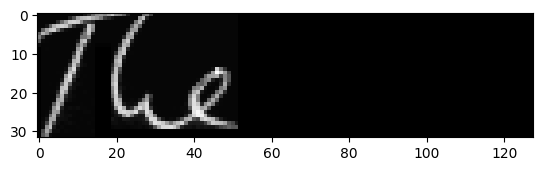



original_text =   result
predicted text = result

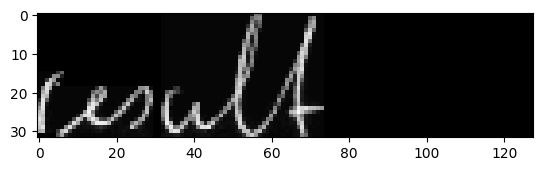



original_text =   of
predicted text = of

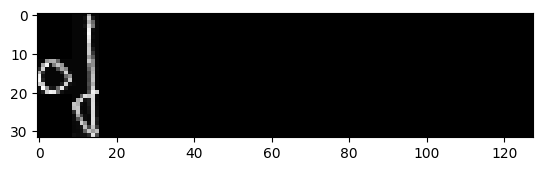



original_text =   the
predicted text = the

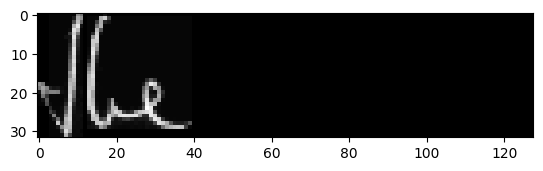



original_text =   vote
predicted text = vote

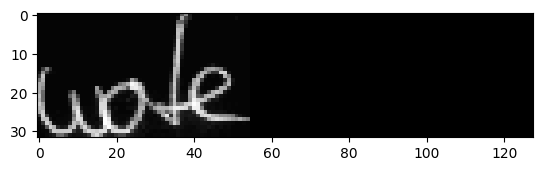



original_text =   was
predicted text = was

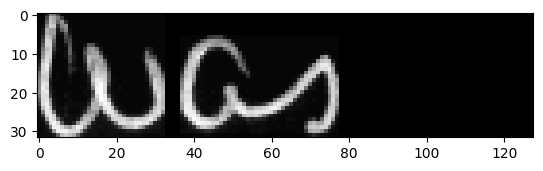



original_text =   not
predicted text = not

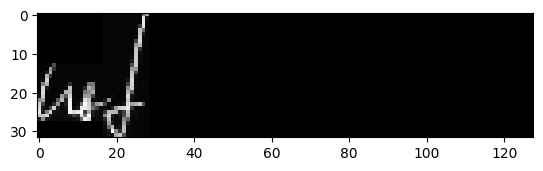



original_text =   doubt
predicted text = doubt

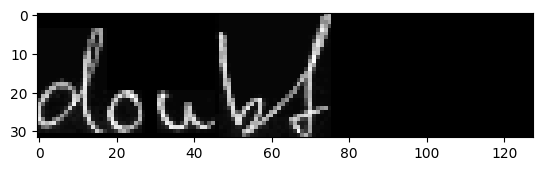



original_text =   .
predicted text = .

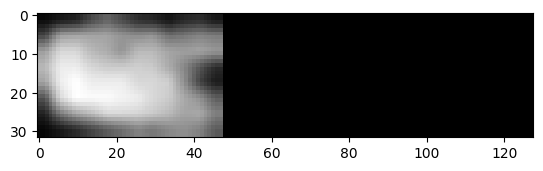



original_text =   For
predicted text = For

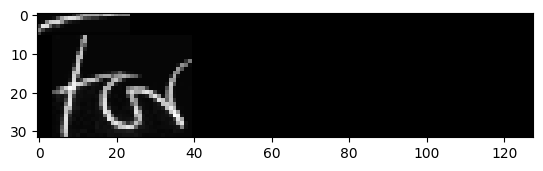



original_text =   the
predicted text = the

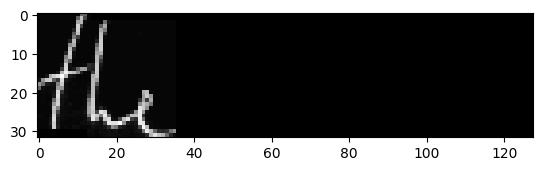



original_text =   Tories
predicted text = Tories

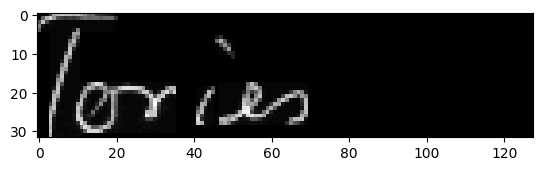



original_text =   were
predicted text = were

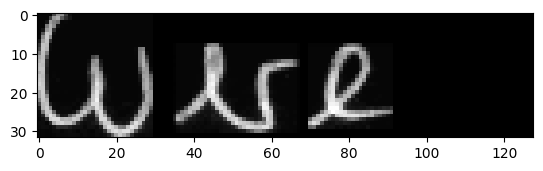



original_text =   massed
predicted text = massed

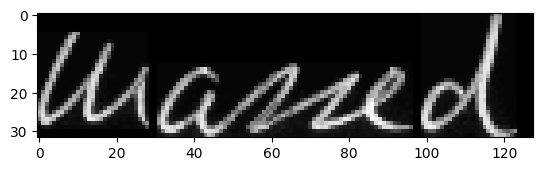



original_text =   in
predicted text = in

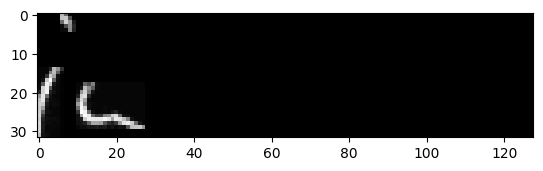



original_text =   answer
predicted text = answer

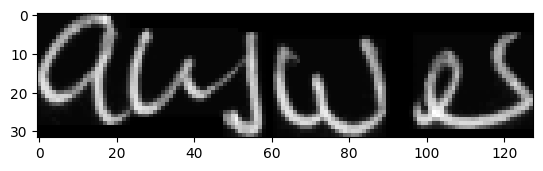



original_text =   their
predicted text = their

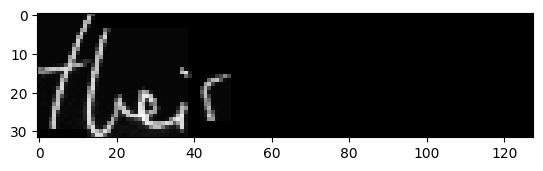



original_text =   whips
predicted text = whips

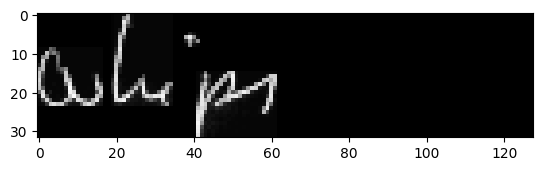



original_text =   to
predicted text = to

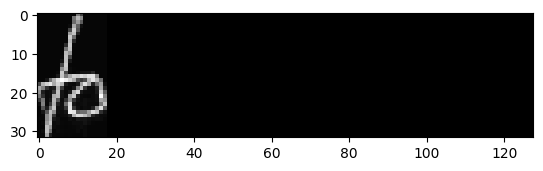



original_text =   defeat
predicted text = defeat

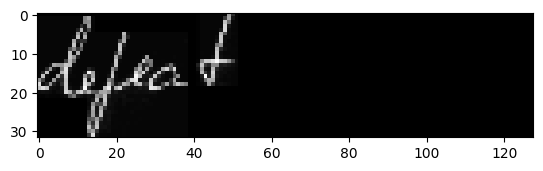



original_text =   a
predicted text = a

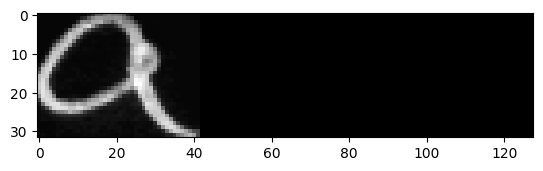



original_text =   censure
predicted text = censure

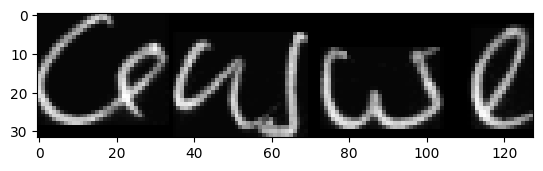



original_text =   motion
predicted text = motion

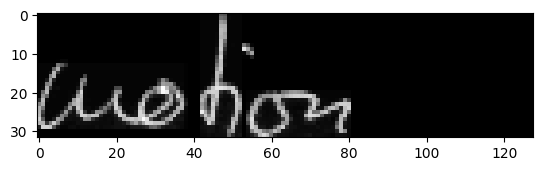



original_text =   on
predicted text = on

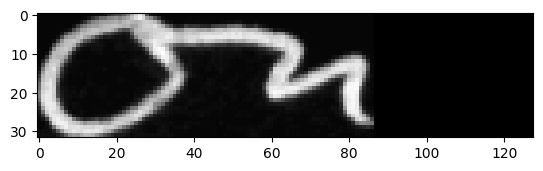



original_text =   the
predicted text = the

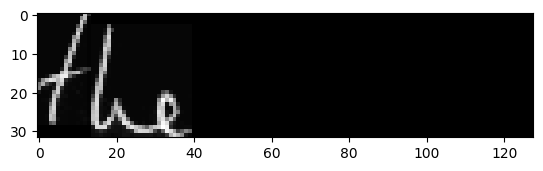



original_text =   for
predicted text = for

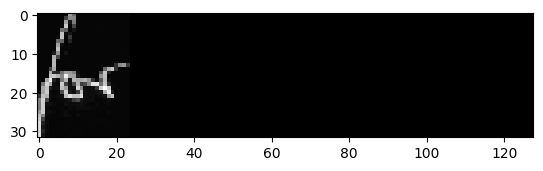



original_text =   "
predicted text = "

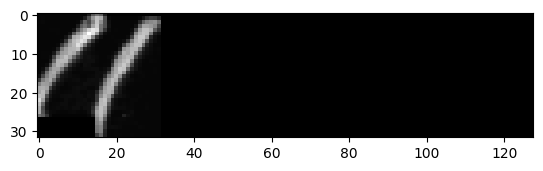



original_text =   undermining
predicted text = undermining

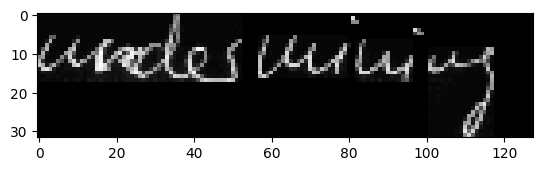



original_text =   the
predicted text = the

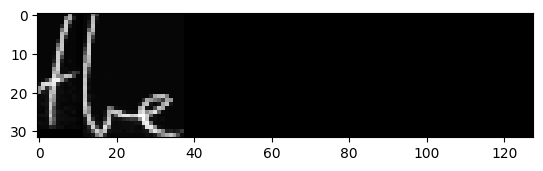



original_text =   Health
predicted text = Health

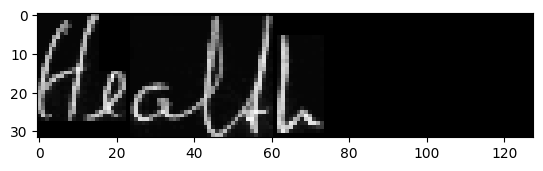



original_text =   Service
predicted text = Service

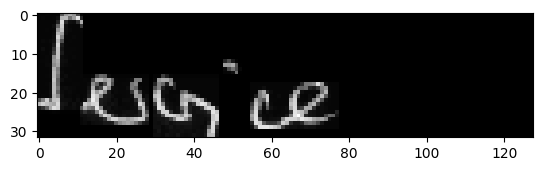



original_text =   "
predicted text = "

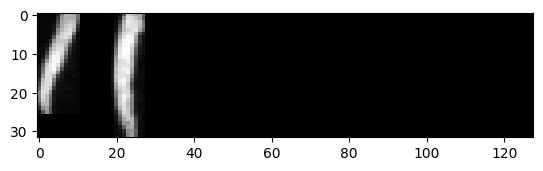



original_text =   and
predicted text = and

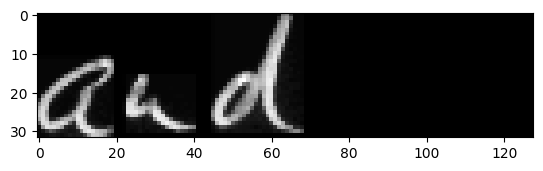



original_text =   placing
predicted text = placing

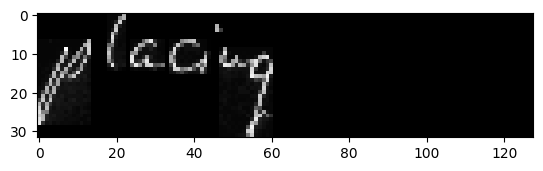



original_text =   burdens
predicted text = burdens

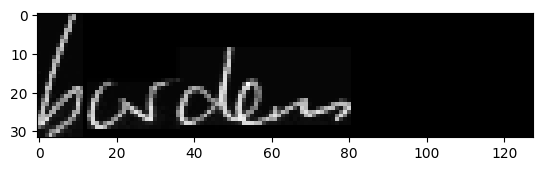



original_text =   on
predicted text = on

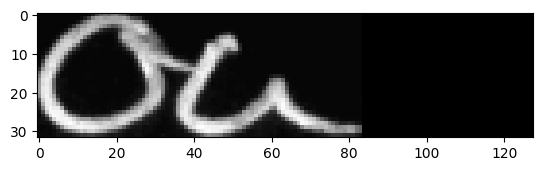



original_text =   those
predicted text = those

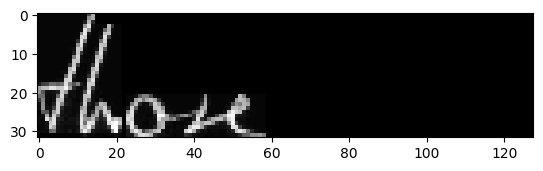



original_text =   least
predicted text = least

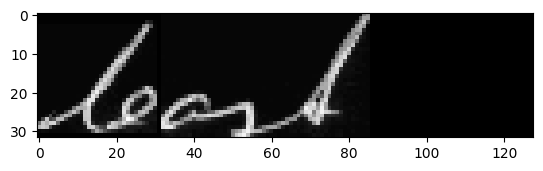



original_text =   able
predicted text = able

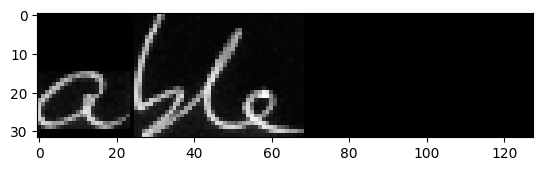



original_text =   to
predicted text = to

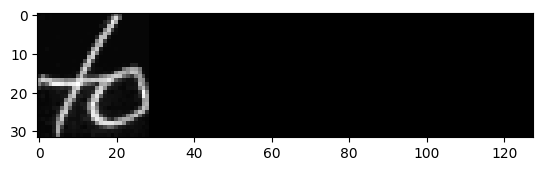



original_text =   bear
predicted text = bear

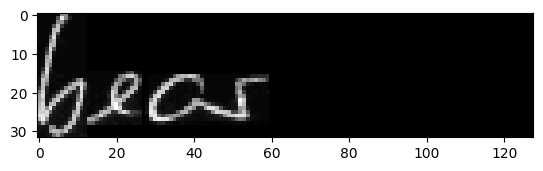



original_text =   them
predicted text = them

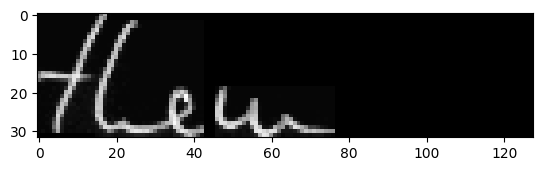



original_text =   .
predicted text = .

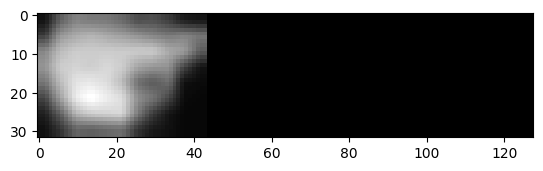



original_text =   Brown
predicted text = Brown

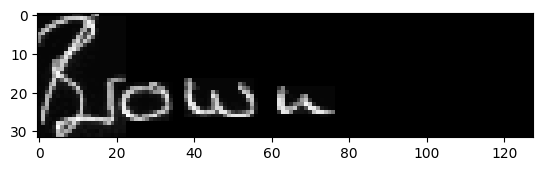



original_text =   declared
predicted text = declared

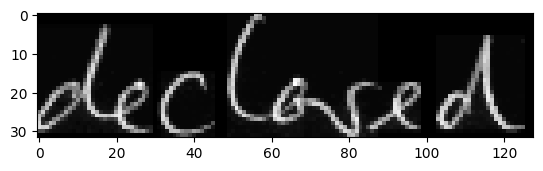



original_text =   that
predicted text = that

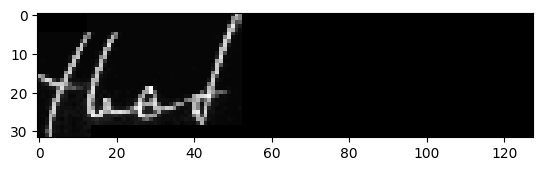



original_text =   the
predicted text = the

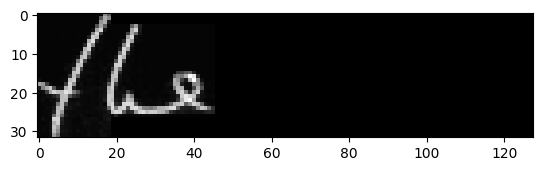



original_text =   policy
predicted text = policy

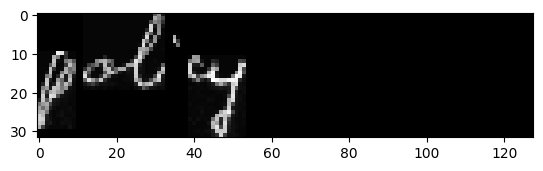



original_text =   under
predicted text = under

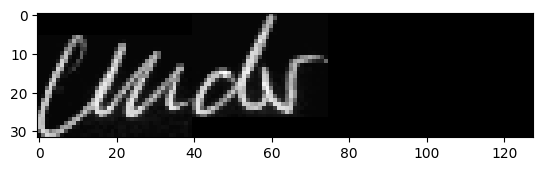



original_text =   censure
predicted text = censure

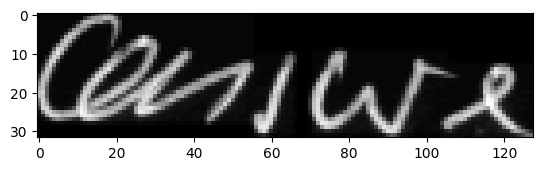



original_text =   was
predicted text = was

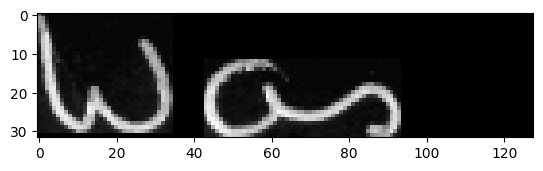



original_text =   monstrous
predicted text = monstrous

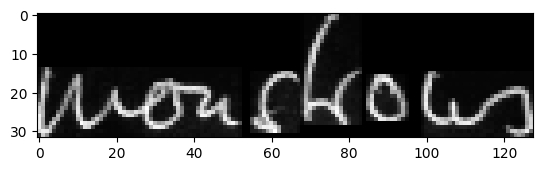



original_text =   It
predicted text = It

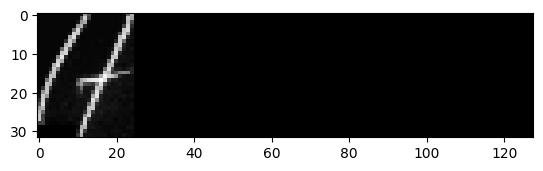



original_text =   had
predicted text = had

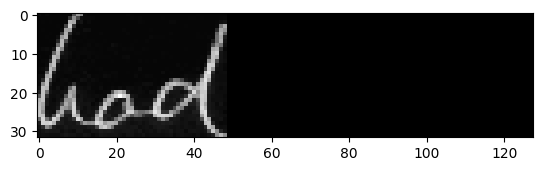



original_text =   offended
predicted text = offended

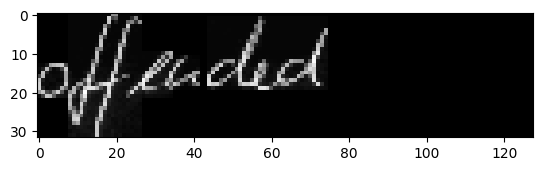



original_text =   many
predicted text = many

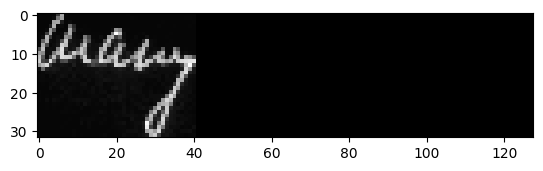



original_text =   people
predicted text = people

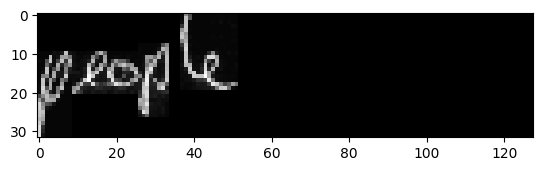



original_text =   far
predicted text = far

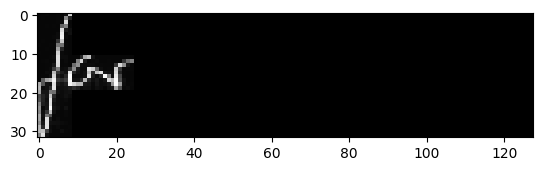



original_text =   beyond
predicted text = beyond

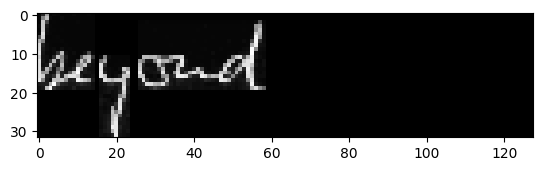



original_text =   the
predicted text = the

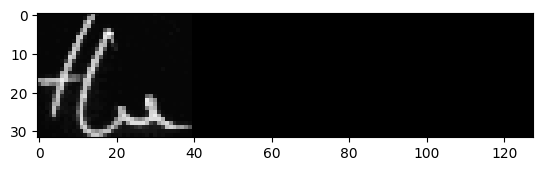



original_text =   ranks
predicted text = ranks

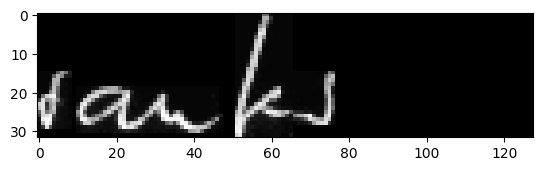



original_text =   Labour
predicted text = Labour

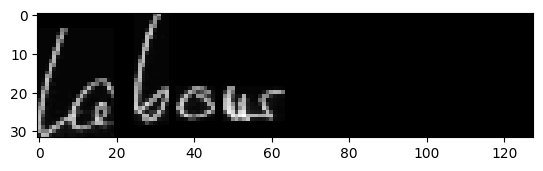



original_text =   supporters
predicted text = supporters

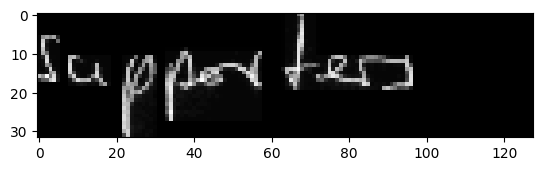



original_text =   .
predicted text = .

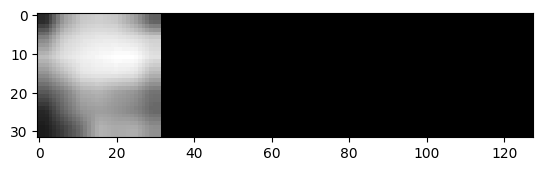



original_text =   The
predicted text = The

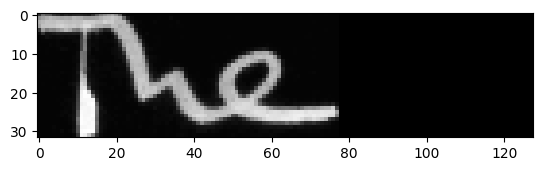



original_text =   result
predicted text = result

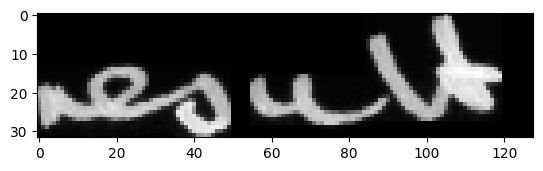



original_text =   of
predicted text = of

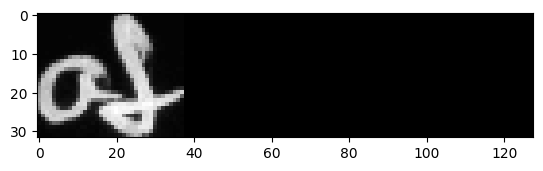



original_text =   the
predicted text = the

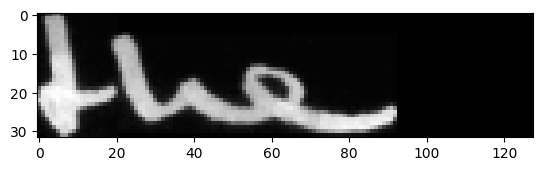



original_text =   vote
predicted text = vote

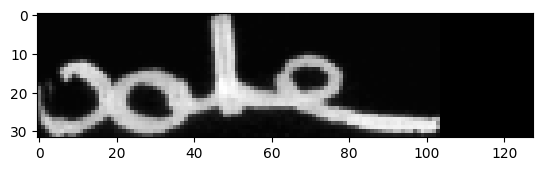



original_text =   was
predicted text = was

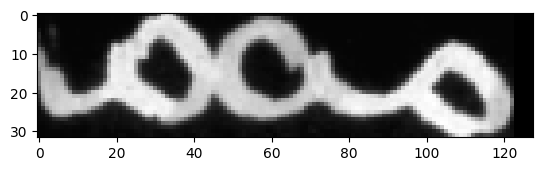



original_text =   in
predicted text = in

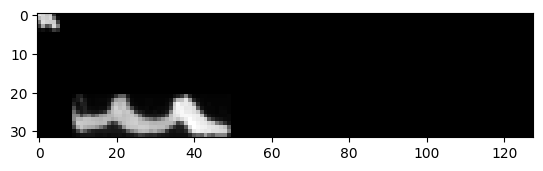



original_text =   doubt
predicted text = doubt

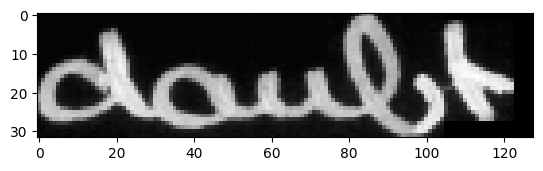



original_text =   .
predicted text = .

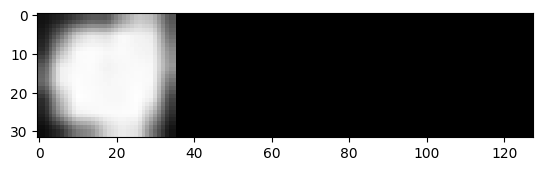



original_text =   For
predicted text = For

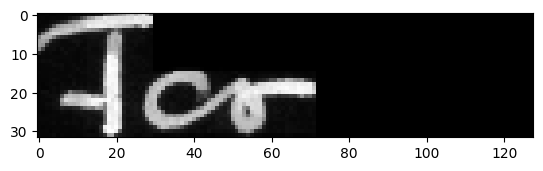



original_text =   the
predicted text = the

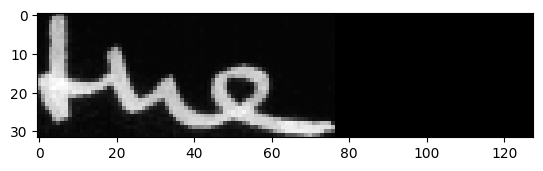



original_text =   Tories
predicted text = Tories

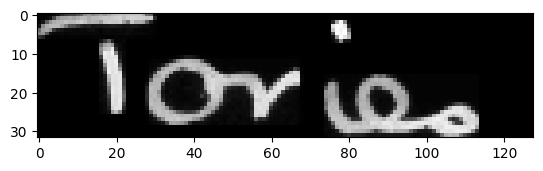



original_text =   were
predicted text = were

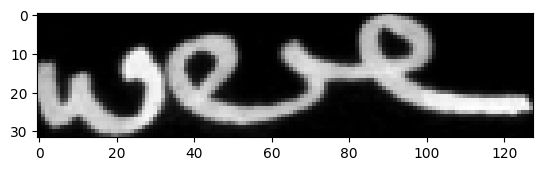



original_text =   massed
predicted text = massed

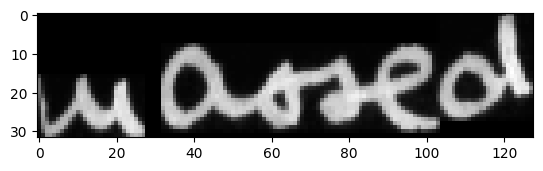



original_text =   in
predicted text = in

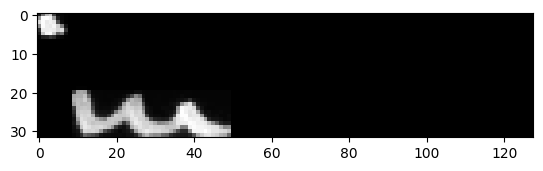



original_text =   to
predicted text = to

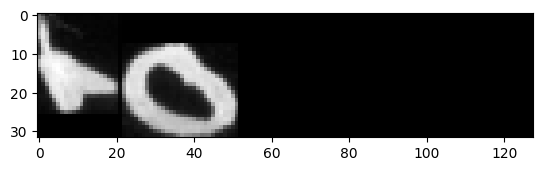



original_text =   their
predicted text = their

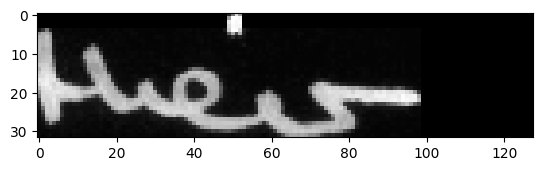



original_text =   whips
predicted text = whips

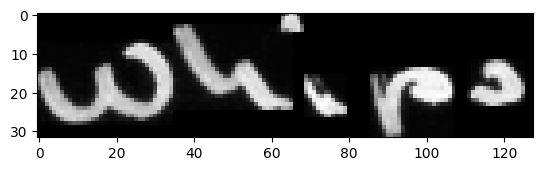



original_text =   to
predicted text = to

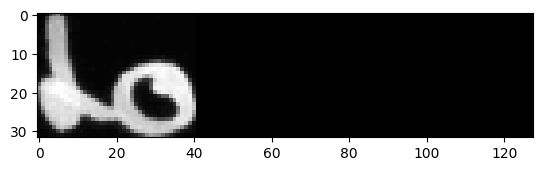



original_text =   defeat
predicted text = defeat

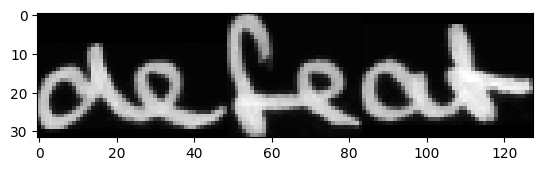



original_text =   a
predicted text = a

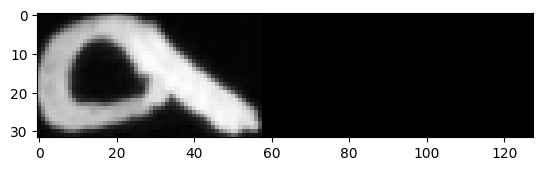



original_text =   censure
predicted text = censure

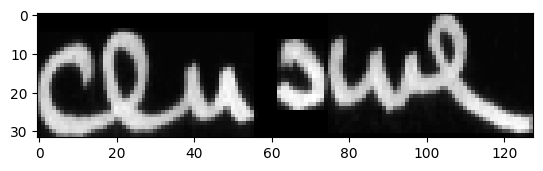



original_text =   motion
predicted text = motion

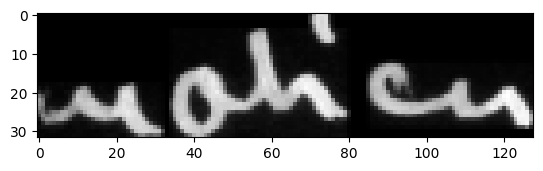



original_text =   on
predicted text = on

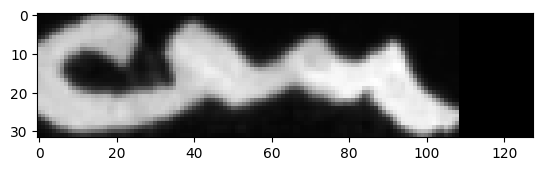



original_text =   Government
predicted text = Government

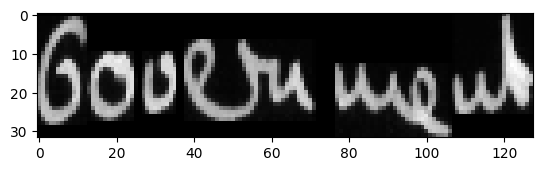



original_text =   for
predicted text = for

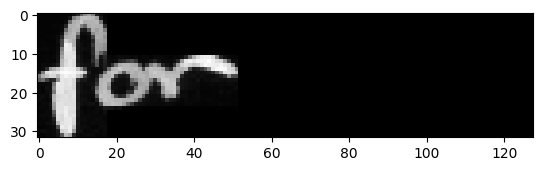



original_text =   "
predicted text = "

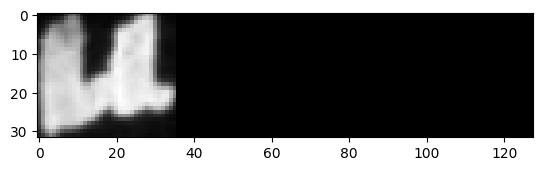



original_text =   undermining
predicted text = undermining

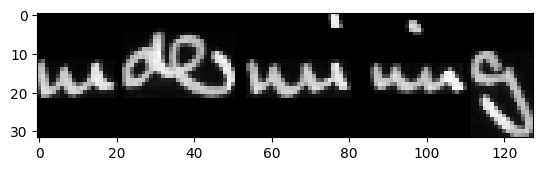



original_text =   the
predicted text = the

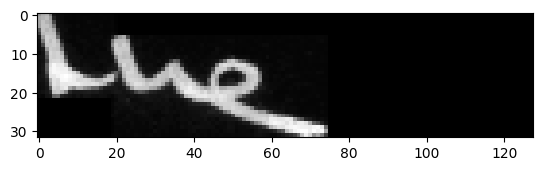



original_text =   Health
predicted text = Health

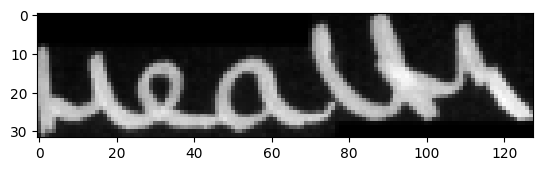



original_text =   Service
predicted text = Service

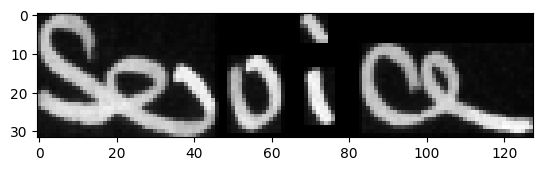



original_text =   "
predicted text = "

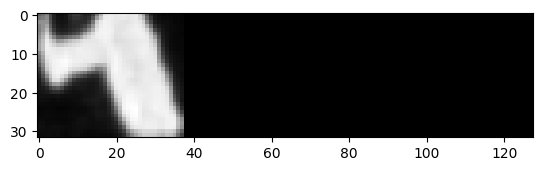



original_text =   and
predicted text = and

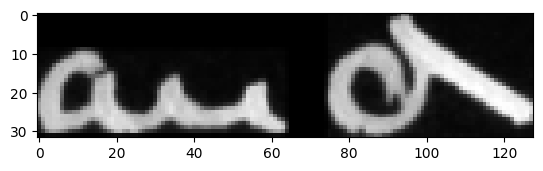



original_text =   heavy
predicted text = heavy

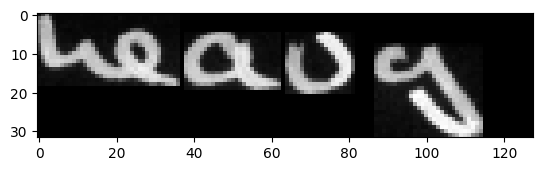



original_text =   burdens
predicted text = burdens

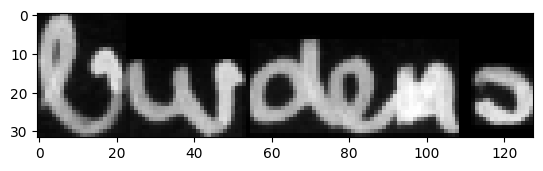



original_text =   on
predicted text = on

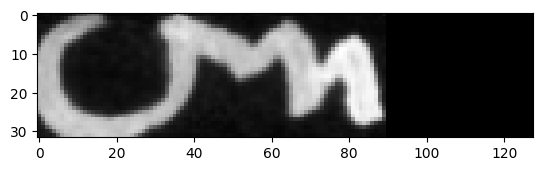



original_text =   those
predicted text = those

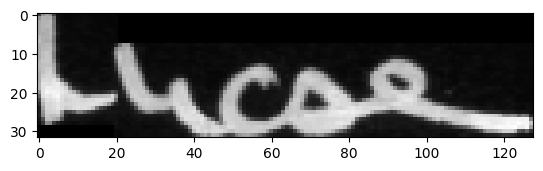



original_text =   least
predicted text = least

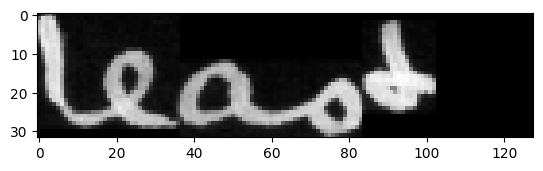



original_text =   able
predicted text = able

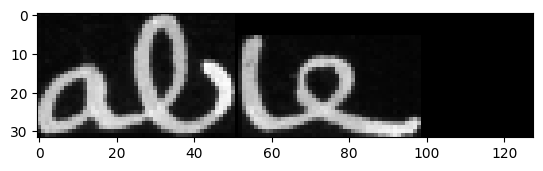



original_text =   to
predicted text = to

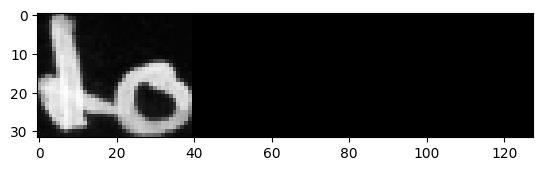



original_text =   bear
predicted text = bear

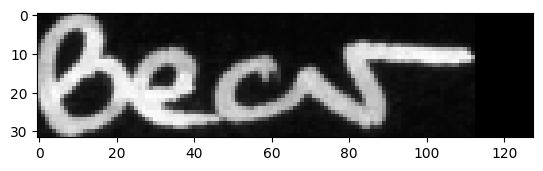



original_text =   them
predicted text = them

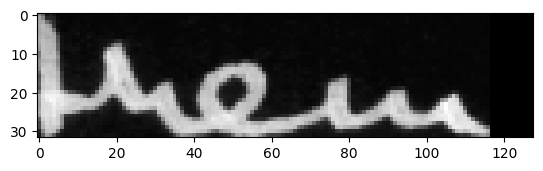



original_text =   Mr.
predicted text = Mr.

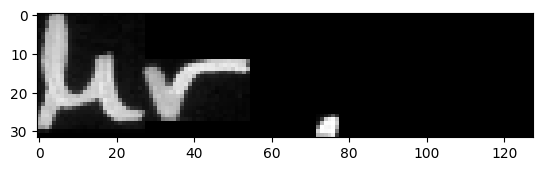



original_text =   Brown
predicted text = Brown

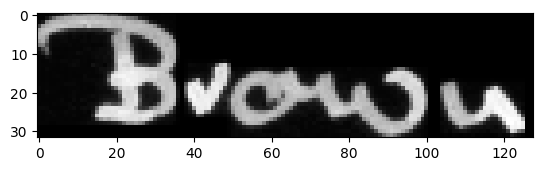



original_text =   declared
predicted text = declared

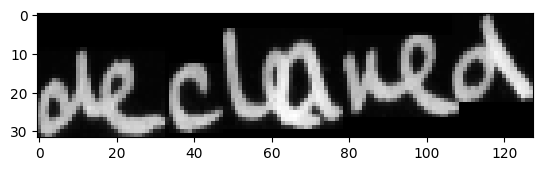



original_text =   that
predicted text = that

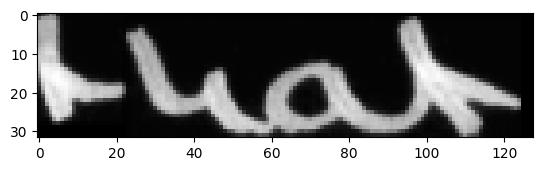



original_text =   the
predicted text = the

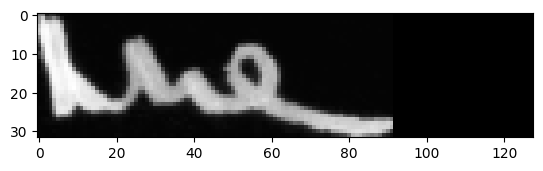



original_text =   policy
predicted text = policy

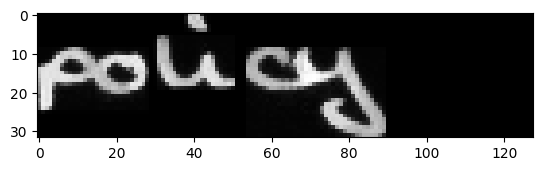



original_text =   under
predicted text = under

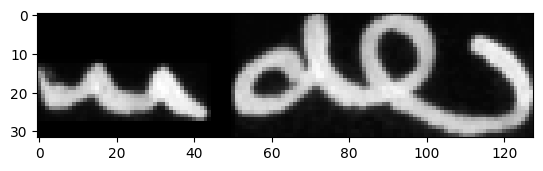



original_text =   censure
predicted text = censure

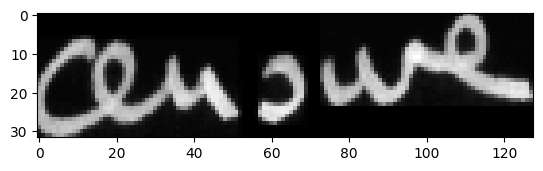



original_text =   was
predicted text = was

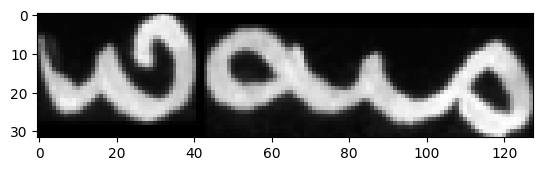



original_text =   .
predicted text = .

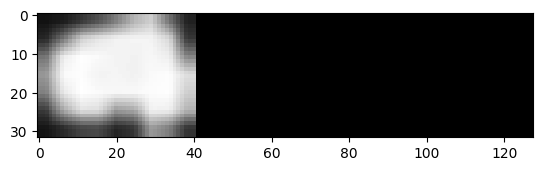



original_text =   It
predicted text = It

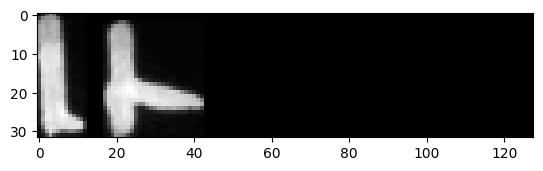



original_text =   had
predicted text = had

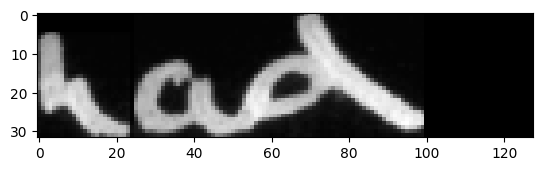



original_text =   offended
predicted text = offended

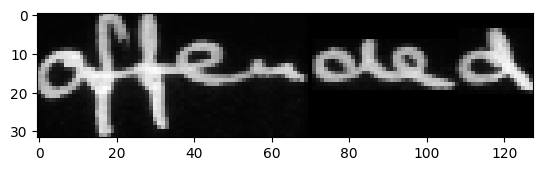



original_text =   many
predicted text = many

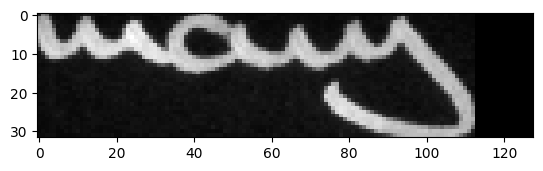



original_text =   people
predicted text = people

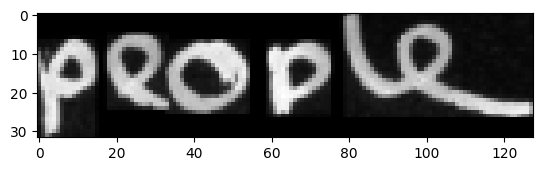



original_text =   far
predicted text = far

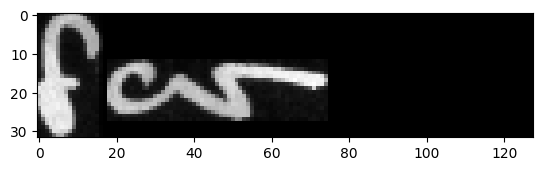



original_text =   beyond
predicted text = beyond

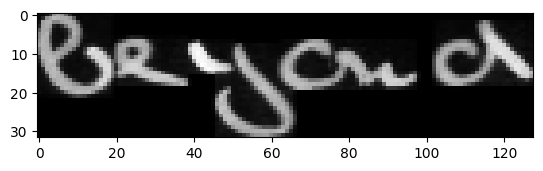



original_text =   the
predicted text = the

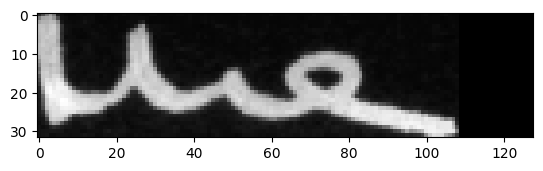



original_text =   of
predicted text = of

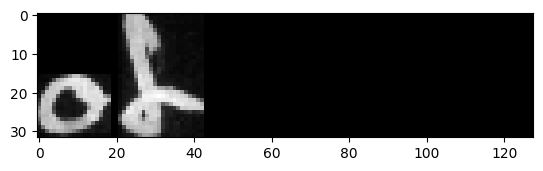



original_text =   Labour
predicted text = Labour

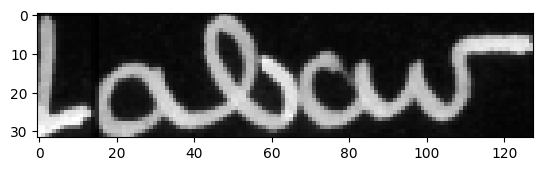



original_text =   supporters
predicted text = supporters

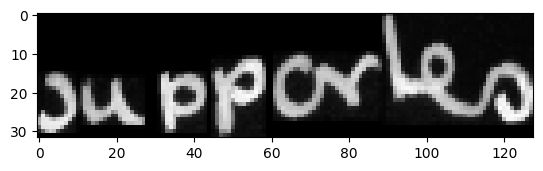



original_text =   .
predicted text = .

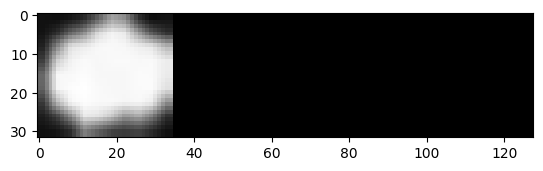



original_text =   The
predicted text = The

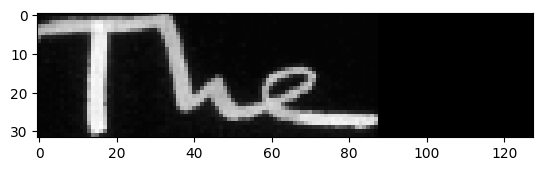



original_text =   Press
predicted text = Press

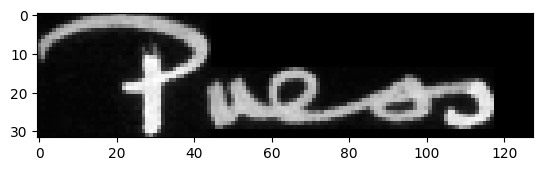



original_text =   ,
predicted text = ,

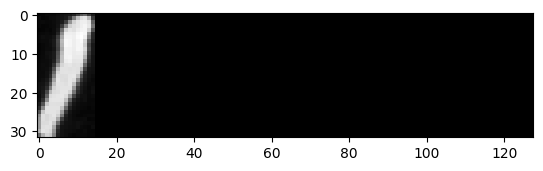



original_text =   many
predicted text = many

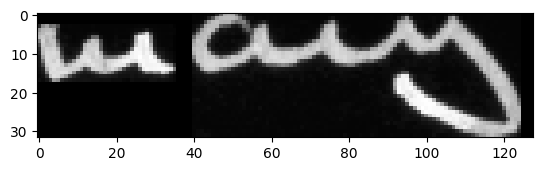



original_text =   doctors
predicted text = doctors

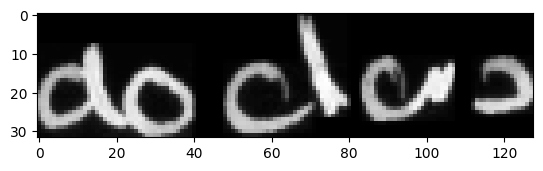



original_text =   public
predicted text = public

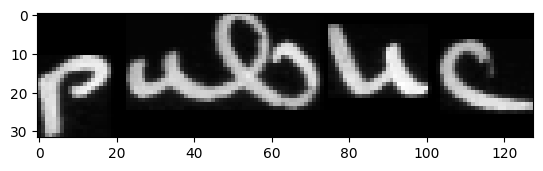



original_text =   were
predicted text = were

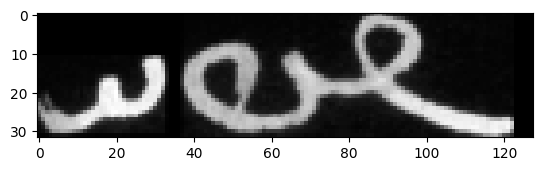



original_text =   letter
predicted text = letter

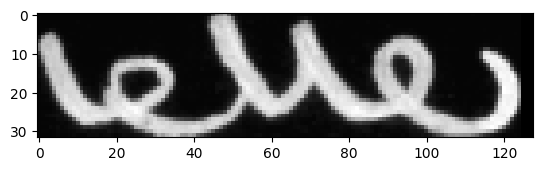



original_text =   which
predicted text = which

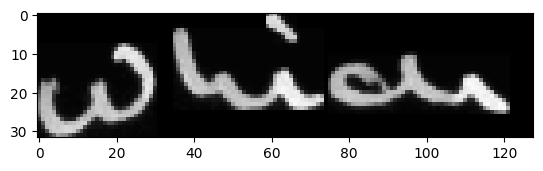



original_text =   Mr.
predicted text = Mr.

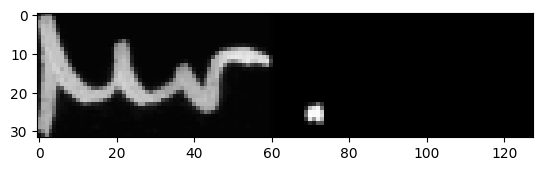



original_text =   Gaitskell
predicted text = Gaitskell

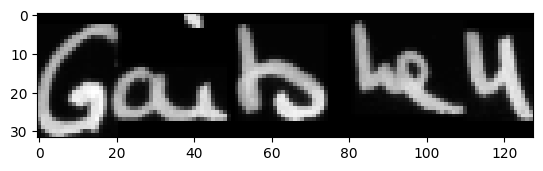



original_text =   had
predicted text = had

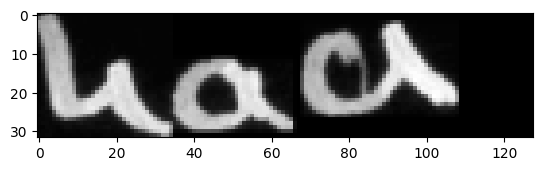



original_text =   received
predicted text = received

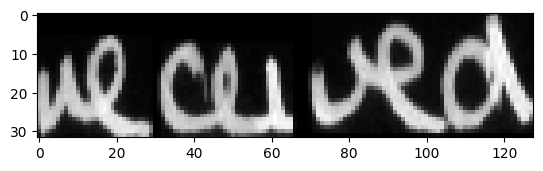



original_text =   :
predicted text = :

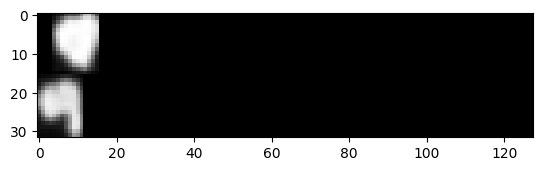



original_text =   has
predicted text = has

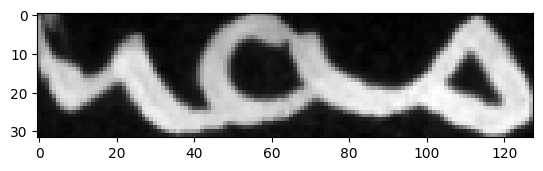



original_text =   practised
predicted text = practised

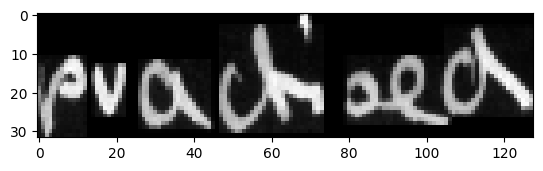



original_text =   for
predicted text = for

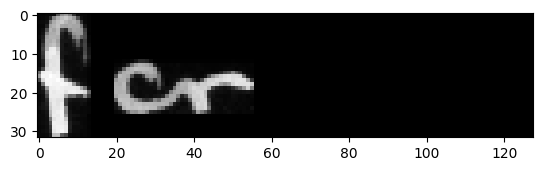



original_text =   43
predicted text = 43

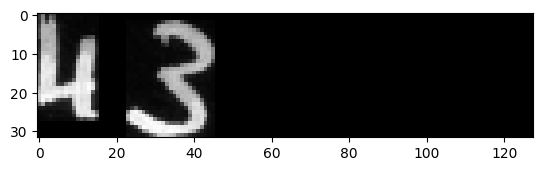



original_text =   years
predicted text = years

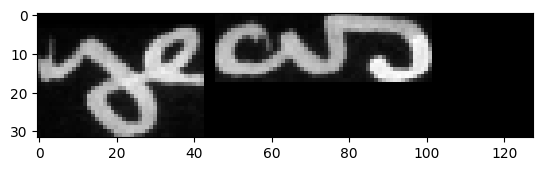



original_text =   ,
predicted text = ,

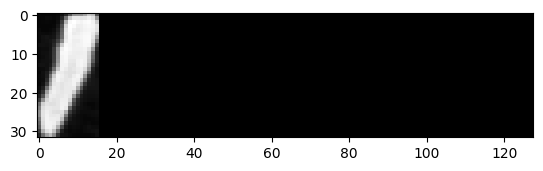



original_text =   chiefly
predicted text = chiefly

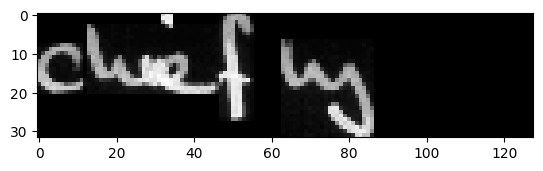



original_text =   as
predicted text = as

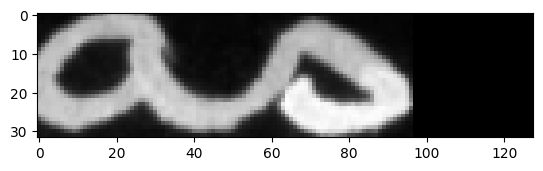



original_text =   a
predicted text = a

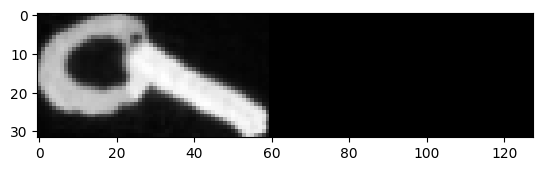



original_text =   panel
predicted text = panel

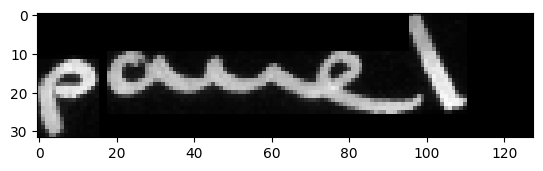



original_text =   doctor
predicted text = doctor

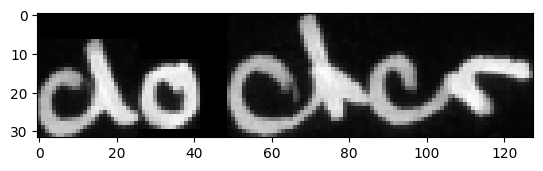



original_text =   "
predicted text = "

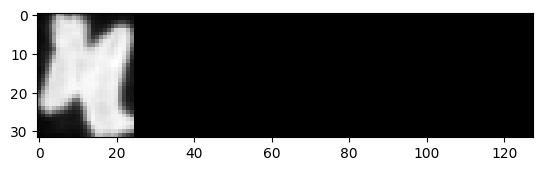



original_text =   I
predicted text = I

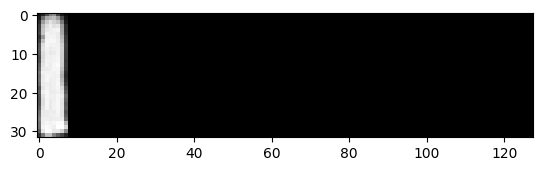



original_text =   am
predicted text = am

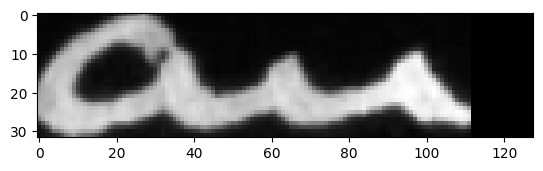



original_text =   a
predicted text = a

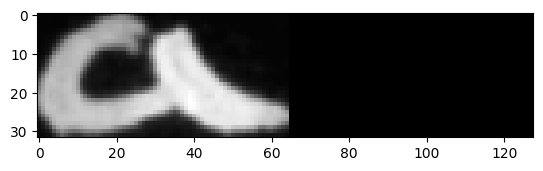



original_text =   lifelong
predicted text = lifelong

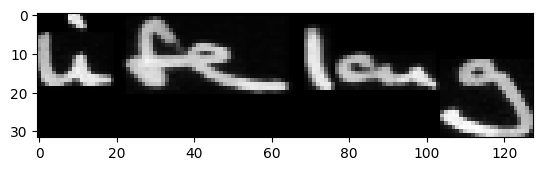



original_text =   Conservative
predicted text = Conservative

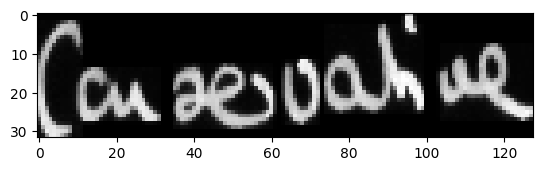



original_text =   .
predicted text = .

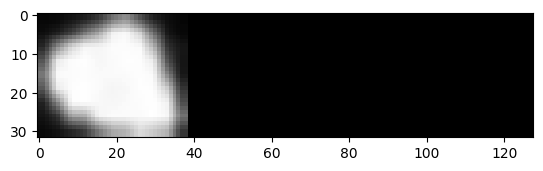



original_text =   I
predicted text = I

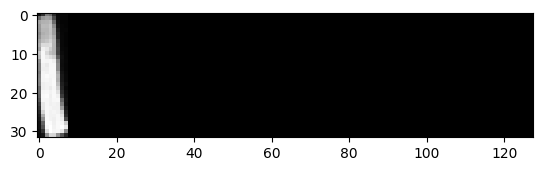



original_text =   am
predicted text = am

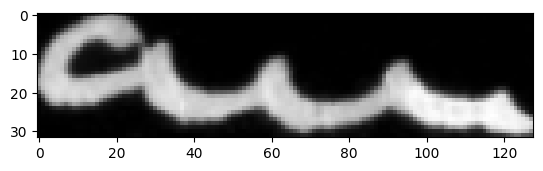



original_text =   and
predicted text = and

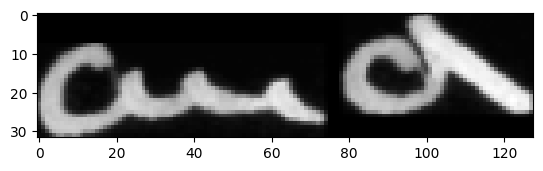



original_text =   amazed
predicted text = amazed

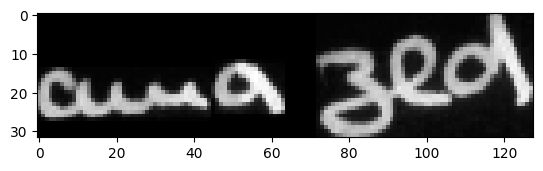



original_text =   by
predicted text = by

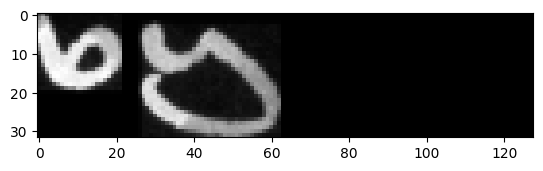



original_text =   my
predicted text = my

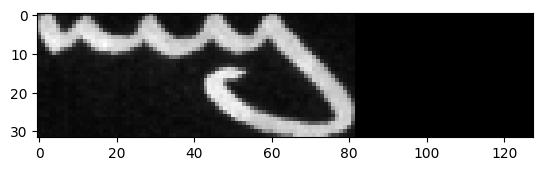



original_text =   party's
predicted text = party's

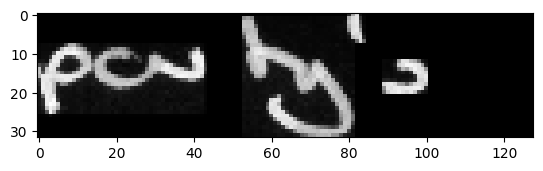



original_text =   proposal
predicted text = proposal

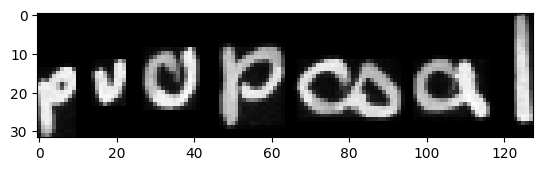



original_text =   to
predicted text = to

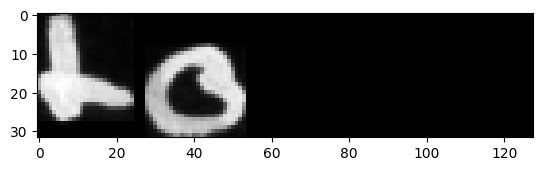



original_text =   prostitute
predicted text = prostitute

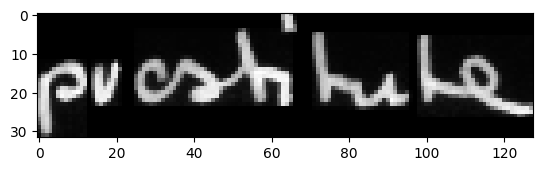



original_text =   the
predicted text = the

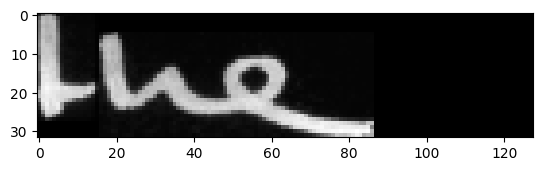



original_text =   principle
predicted text = principle

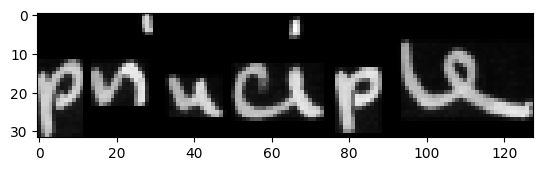



original_text =   of
predicted text = of

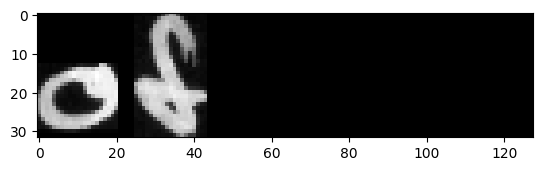



original_text =   the
predicted text = the

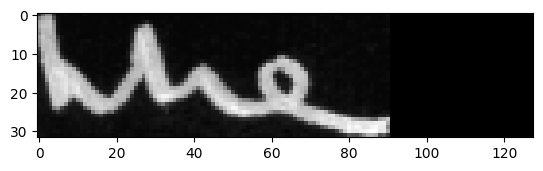



original_text =   State
predicted text = State

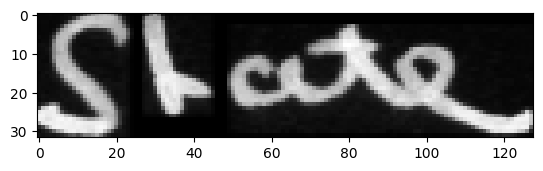



original_text =   service
predicted text = service

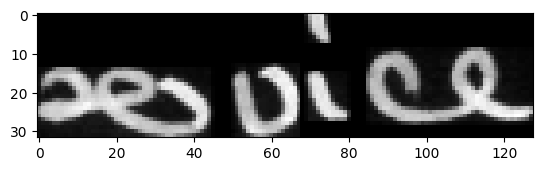



original_text =   and
predicted text = and

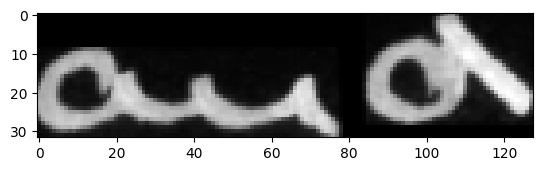



original_text =   to
predicted text = to

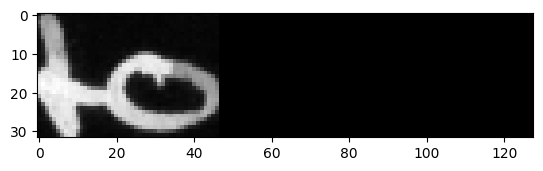



original_text =   render
predicted text = render

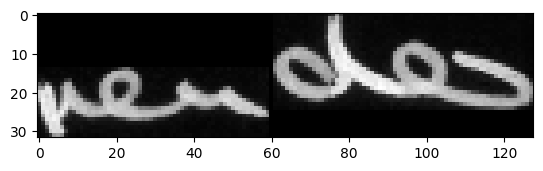



original_text =   that
predicted text = that

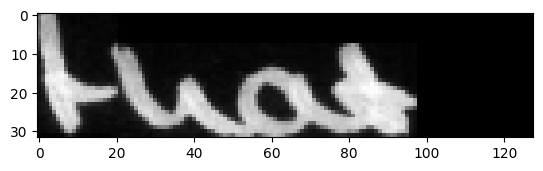



original_text =   a
predicted text = a

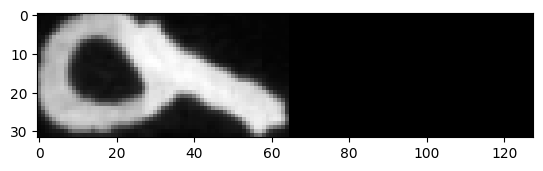



original_text =   hardship
predicted text = hardship

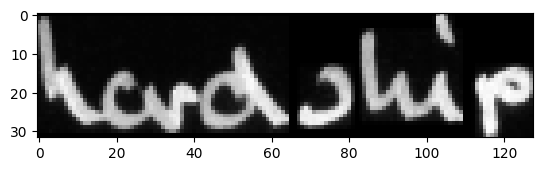



original_text =   to
predicted text = to

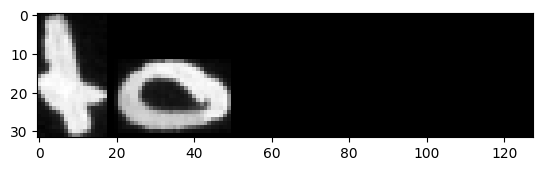



original_text =   poor
predicted text = poor

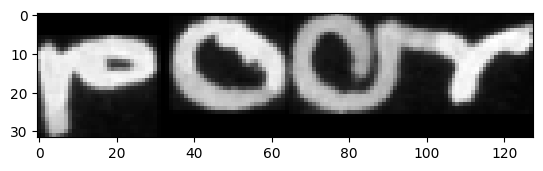



original_text =   people
predicted text = people

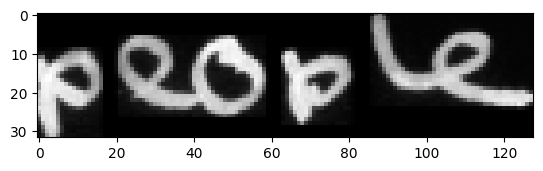



original_text =   .
predicted text = .

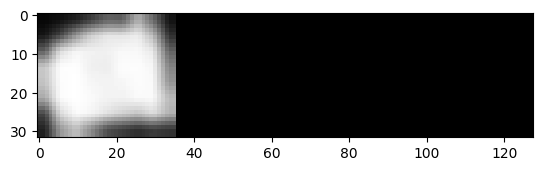



original_text =   "
predicted text = "

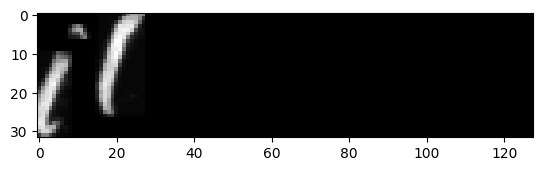



original_text =   After
predicted text = After

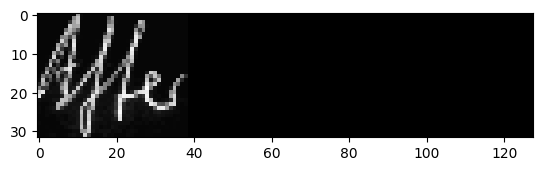



original_text =   a
predicted text = a

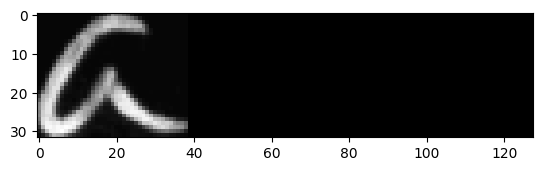



original_text =   of
predicted text = of

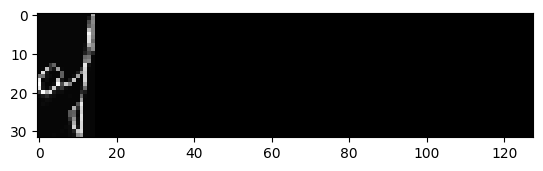



original_text =   helping
predicted text = helping

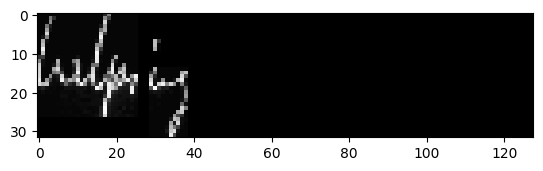



original_text =   others
predicted text = others

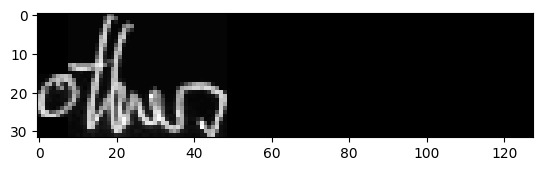



original_text =   and
predicted text = and

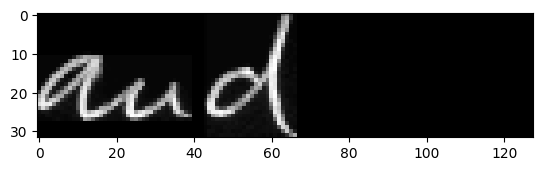



original_text =   healing
predicted text = healing

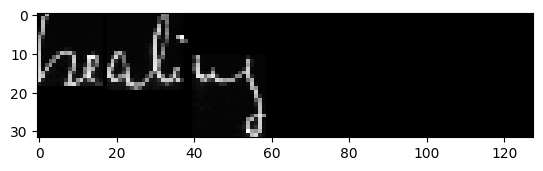



original_text =   the
predicted text = the

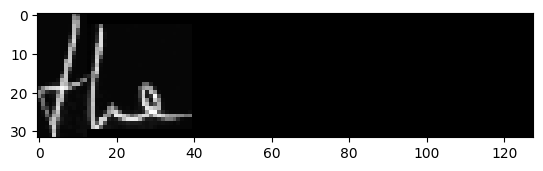



original_text =   sick
predicted text = sick

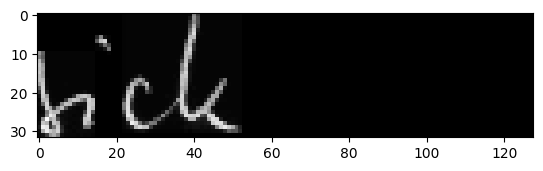



original_text =   ,
predicted text = ,

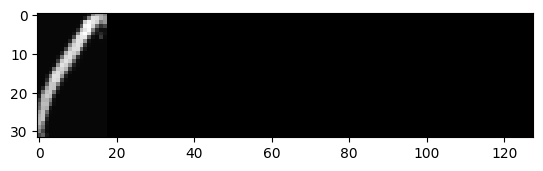



original_text =   my
predicted text = my

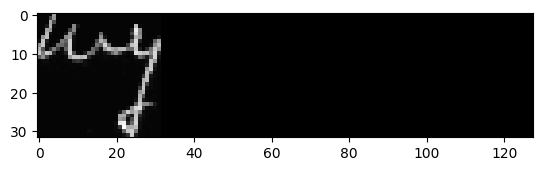



original_text =   are
predicted text = are

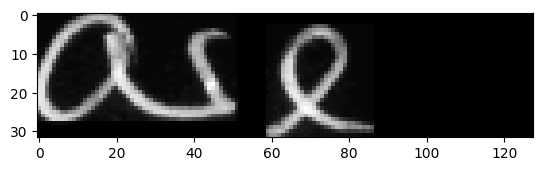



original_text =   dealing
predicted text = dealing

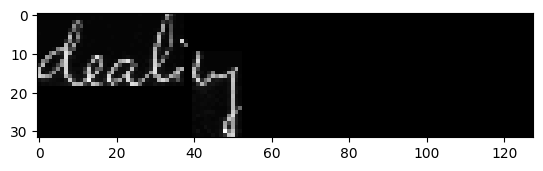



original_text =   with
predicted text = with

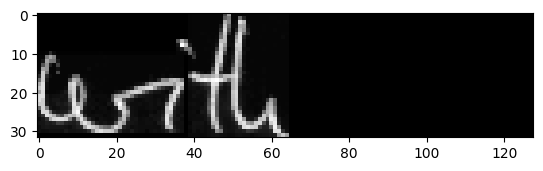



original_text =   a
predicted text = a

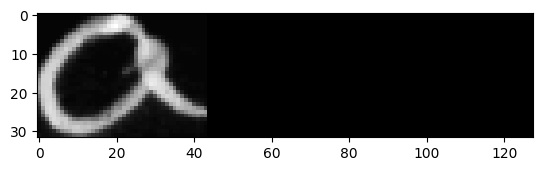



original_text =   noble
predicted text = noble

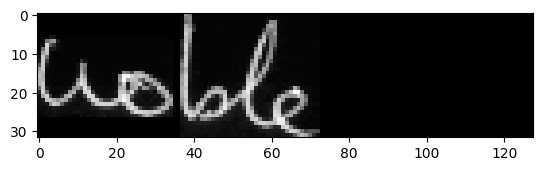



original_text =   edifice
predicted text = edifice

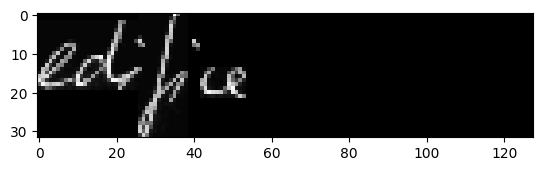



original_text =   needs
predicted text = needs

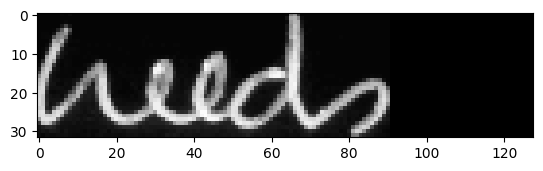



original_text =   an
predicted text = an

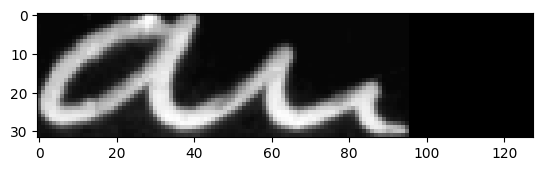



original_text =   imaginative
predicted text = imaginative

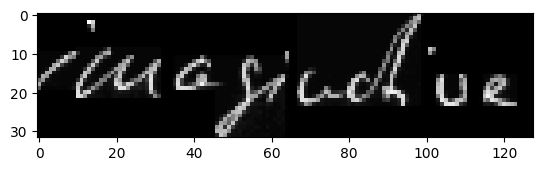



original_text =   architect
predicted text = architect

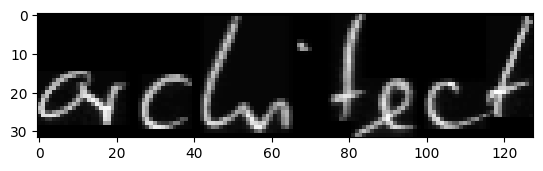



original_text =   to
predicted text = to

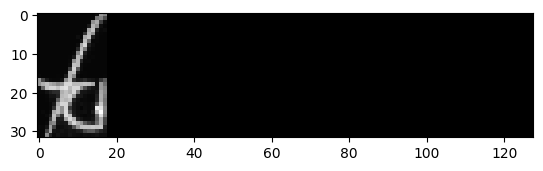



original_text =   improve
predicted text = improve

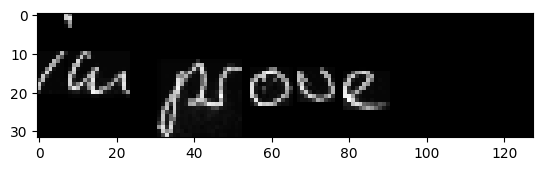



original_text =   it
predicted text = it

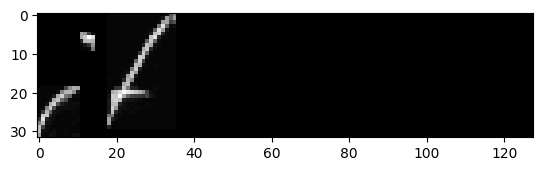



original_text =   ,
predicted text = ,

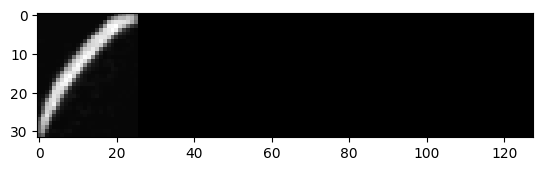



original_text =   but
predicted text = but

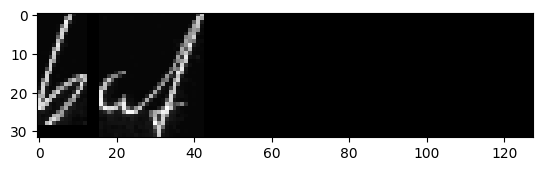



original_text =   has
predicted text = has

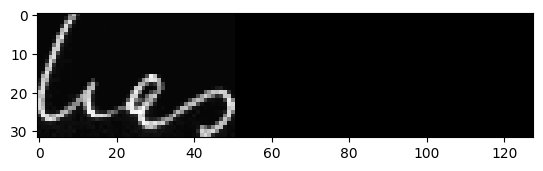



original_text =   got
predicted text = got

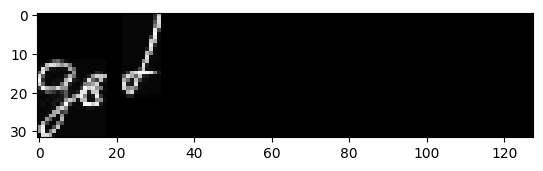



original_text =   a
predicted text = a

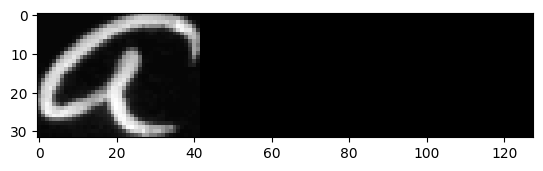



original_text =   quantity
predicted text = quantity

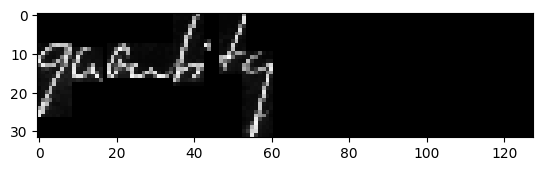



original_text =   surveyor
predicted text = surveyor

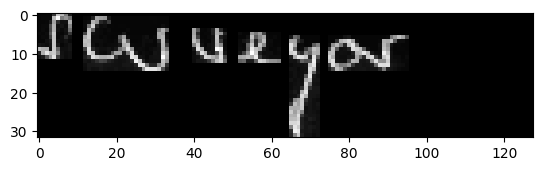



original_text =   .
predicted text = .

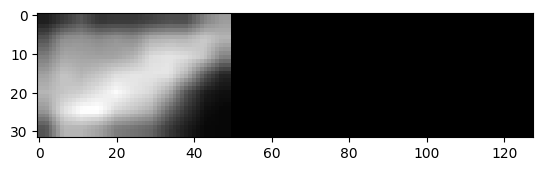



original_text =   We
predicted text = We

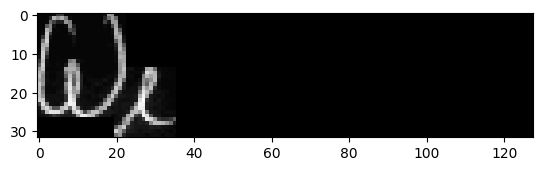



original_text =   have
predicted text = have

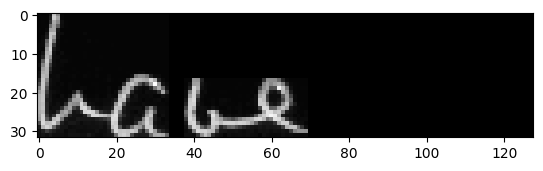



original_text =   descended
predicted text = descended

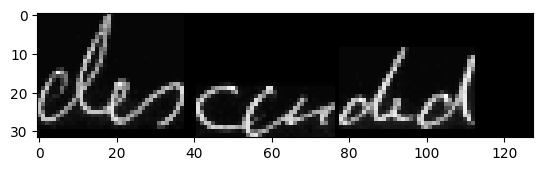



original_text =   the
predicted text = the

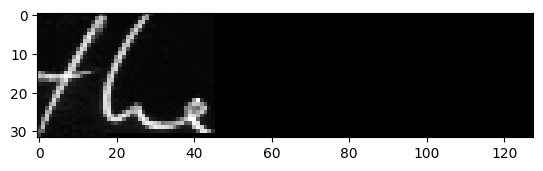



original_text =   real
predicted text = real

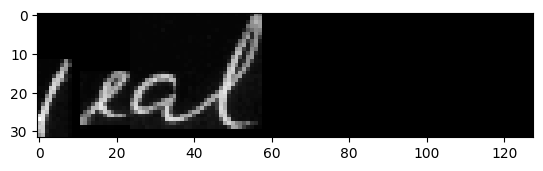



original_text =   problems
predicted text = problems

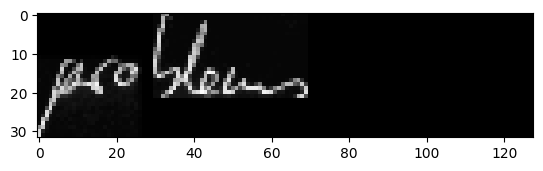



original_text =   to
predicted text = to

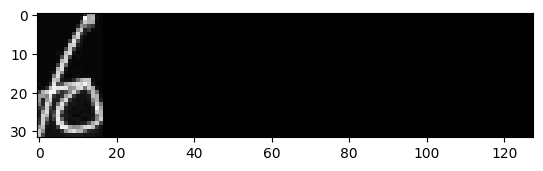



original_text =   fiddling
predicted text = fiddling

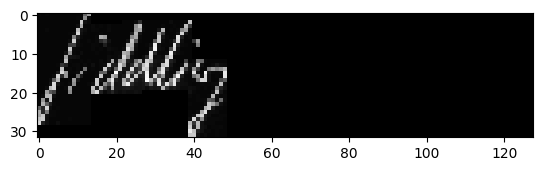



original_text =   about
predicted text = about

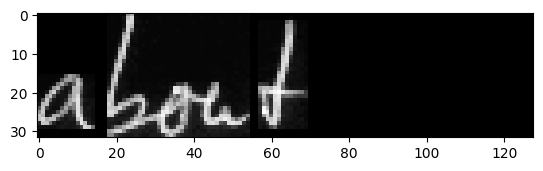



original_text =   with
predicted text = with

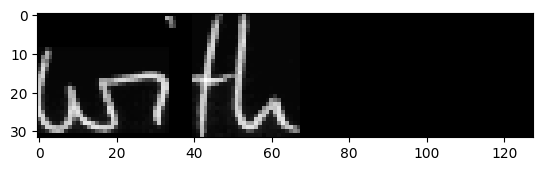



original_text =   bills
predicted text = bills

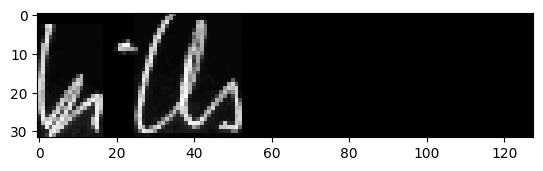



original_text =   of
predicted text = of

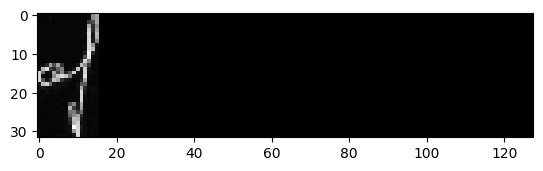



original_text =   .
predicted text = .

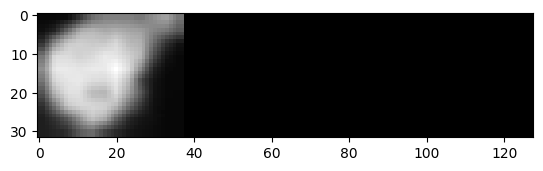



original_text =   the
predicted text = the

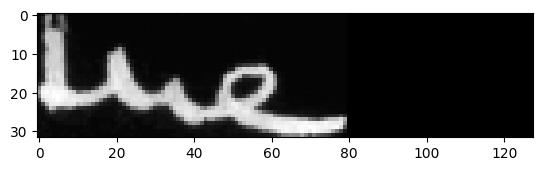



original_text =   sick
predicted text = sick

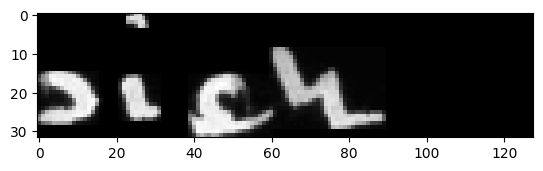



original_text =   ,
predicted text = ,

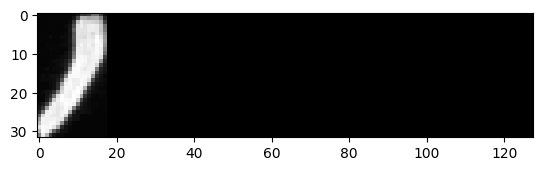



original_text =   my
predicted text = my

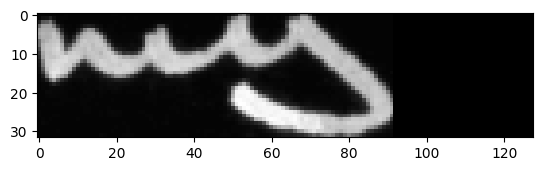



original_text =   considered
predicted text = considered

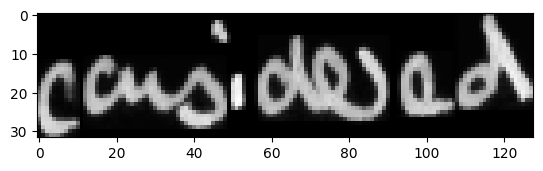



original_text =   opinion
predicted text = opinion

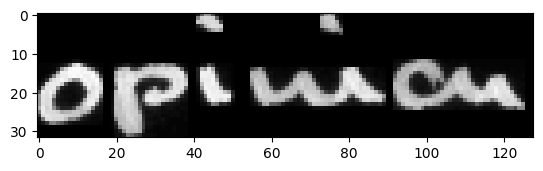



original_text =   is
predicted text = is

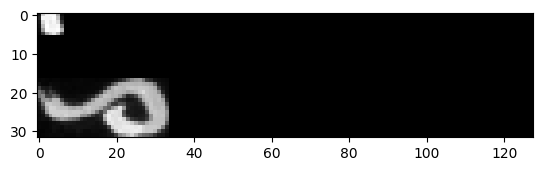



original_text =   that
predicted text = that

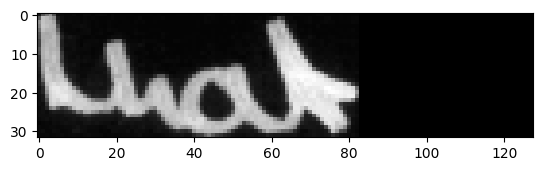



original_text =   anybody
predicted text = anybody

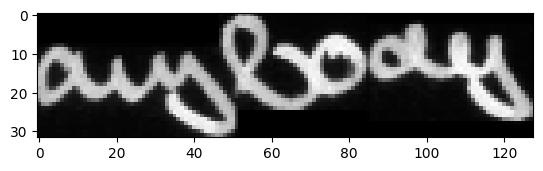



original_text =   the
predicted text = the

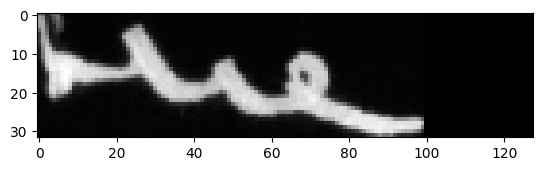



original_text =   increased
predicted text = increased

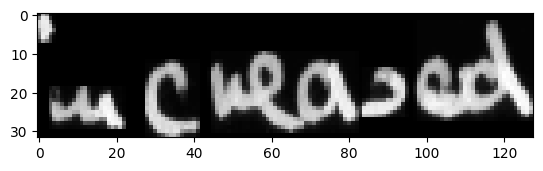



original_text =   charges
predicted text = charges

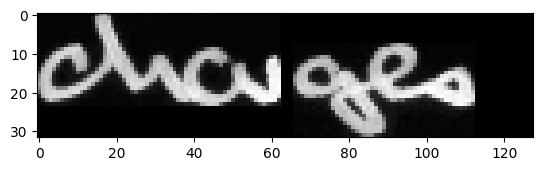



original_text =   is
predicted text = is

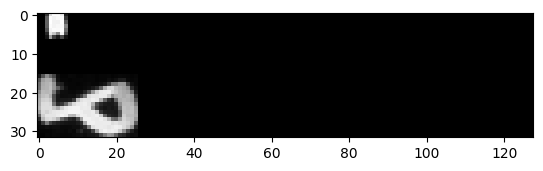



original_text =   a
predicted text = a

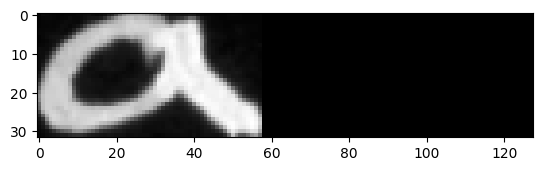



original_text =   wicked
predicted text = wicked

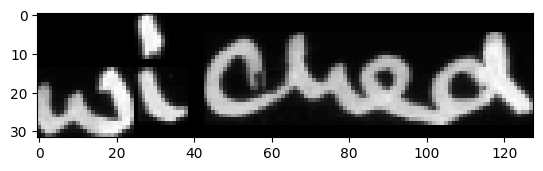



original_text =   ,
predicted text = ,

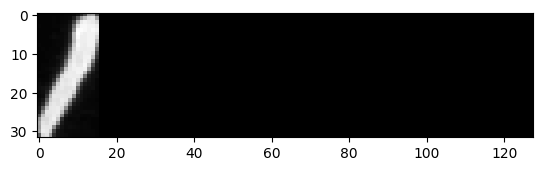



original_text =   old
predicted text = old

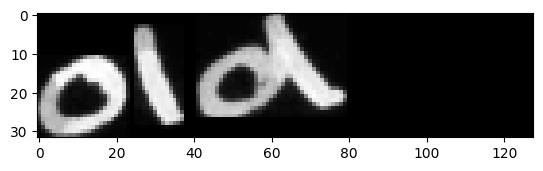



original_text =   -
predicted text = -

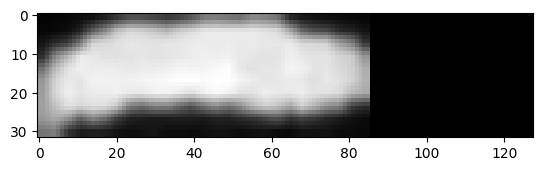



original_text =   "
predicted text = "

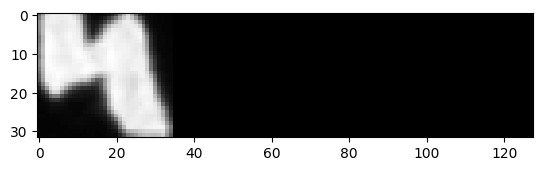



original_text =   Mr.
predicted text = Mr.

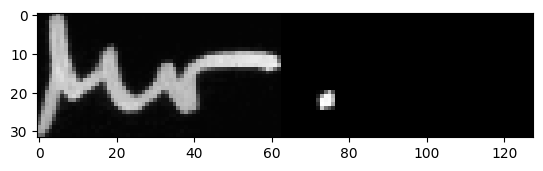



original_text =   Brown
predicted text = Brown

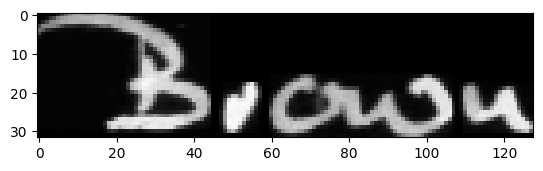



original_text =   went
predicted text = went

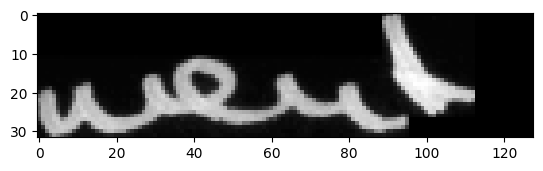



original_text =   on
predicted text = on

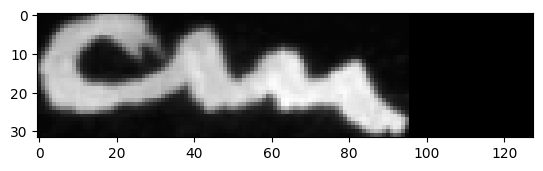



original_text =   :
predicted text = :

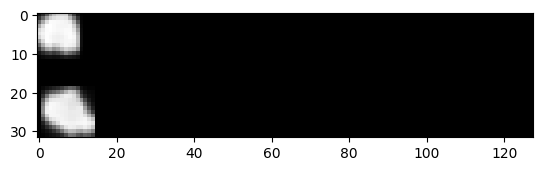



original_text =   "
predicted text = "

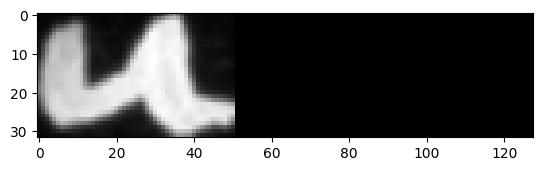



original_text =   We
predicted text = We

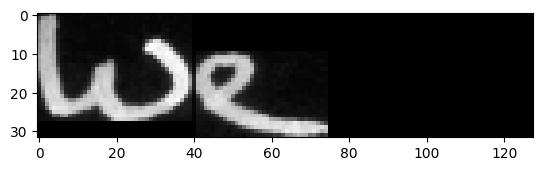



original_text =   are
predicted text = are

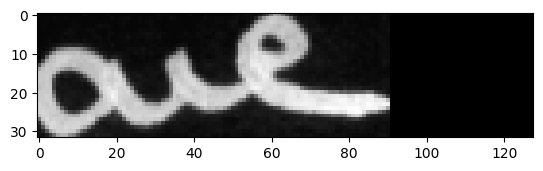



original_text =   with
predicted text = with

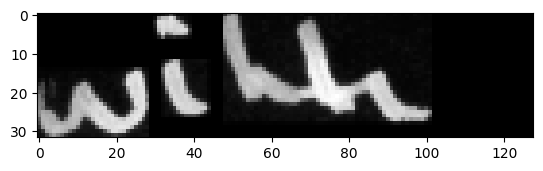



original_text =   a
predicted text = a

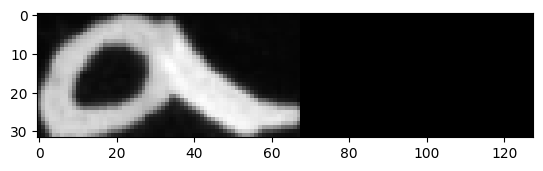



original_text =   noble
predicted text = noble

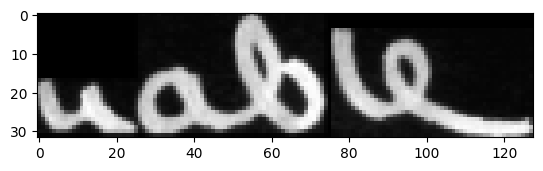



original_text =   edifice
predicted text = edifice

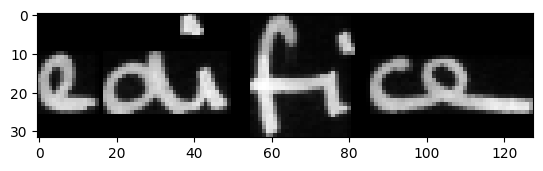



original_text =   which
predicted text = which

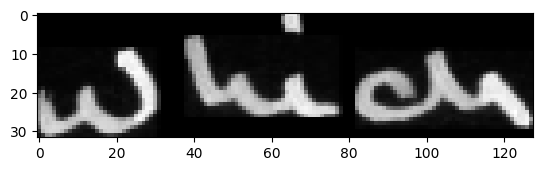



original_text =   needs
predicted text = needs

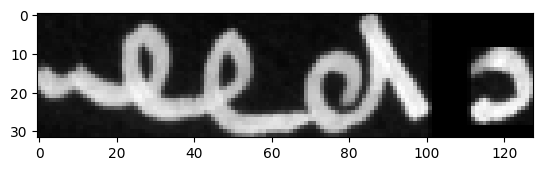



original_text =   an
predicted text = an

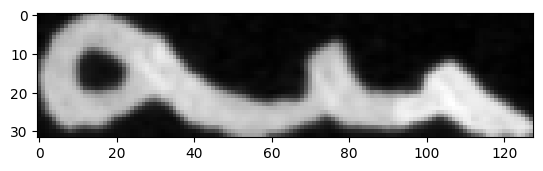



original_text =   imaginative
predicted text = imaginative

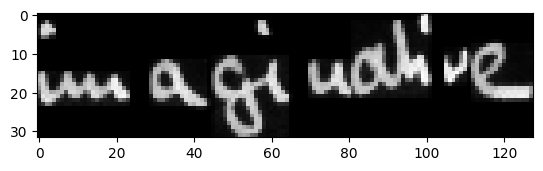



original_text =   architect
predicted text = architect

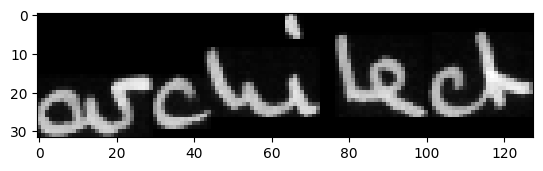



original_text =   improve
predicted text = improve

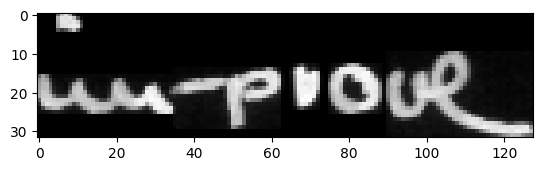



original_text =   it
predicted text = it

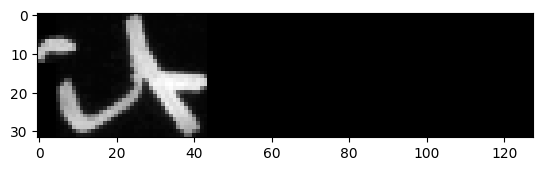



original_text =   ,
predicted text = ,

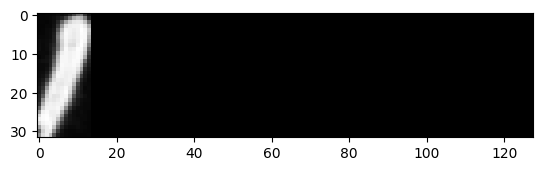



original_text =   but
predicted text = but

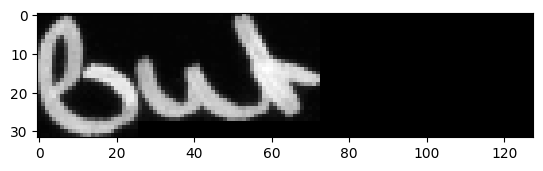



original_text =   it
predicted text = it

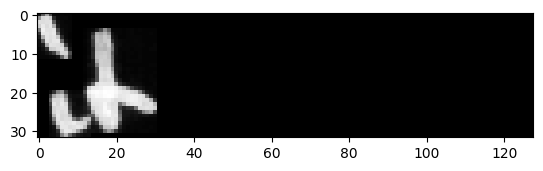



original_text =   has
predicted text = has

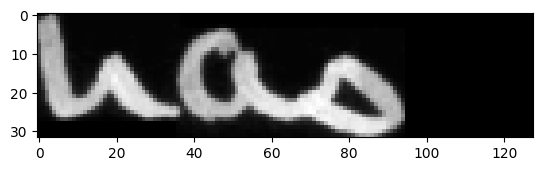



original_text =   got
predicted text = got

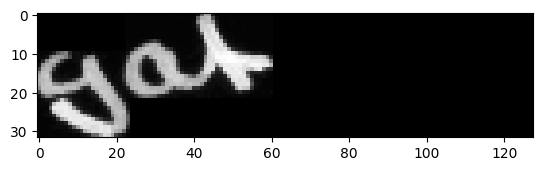



original_text =   a
predicted text = a

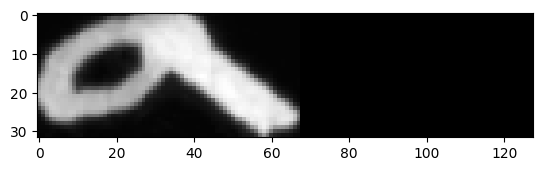



original_text =   quantity
predicted text = quantity

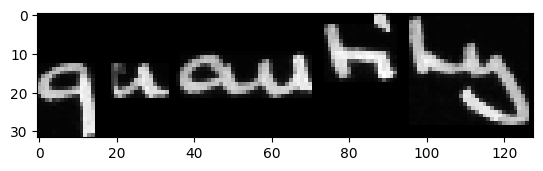



original_text =   .
predicted text = .

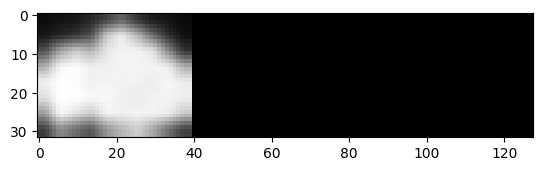



original_text =   We
predicted text = We

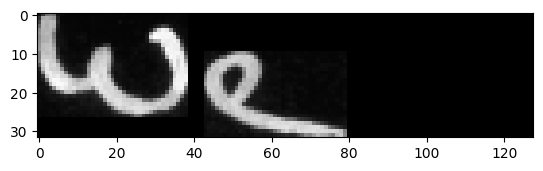



original_text =   have
predicted text = have

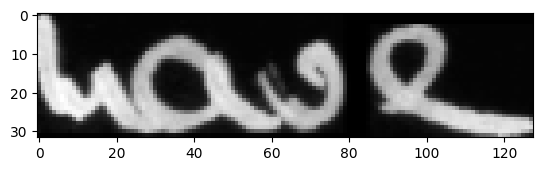



original_text =   descended
predicted text = descended

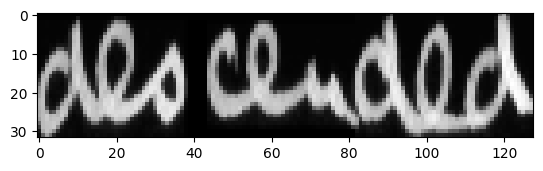



original_text =   from
predicted text = from

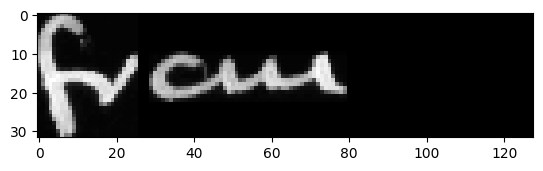



original_text =   the
predicted text = the

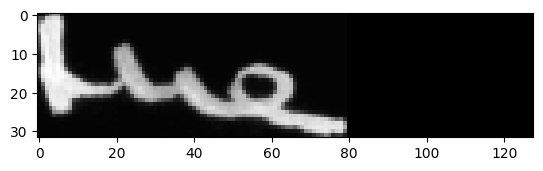



original_text =   real
predicted text = real

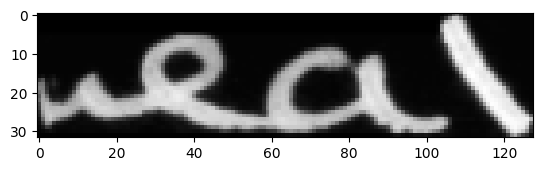



original_text =   problems
predicted text = problems

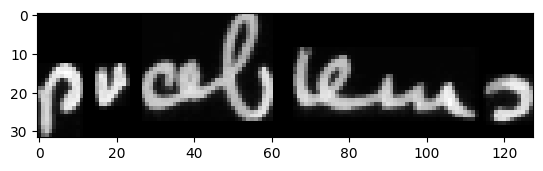



original_text =   to
predicted text = to

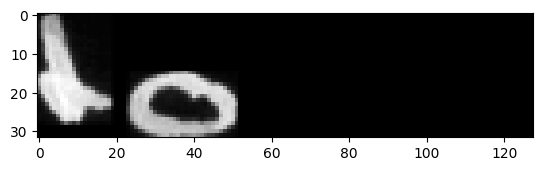



original_text =   about
predicted text = about

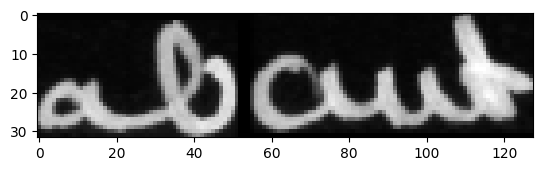



original_text =   with
predicted text = with

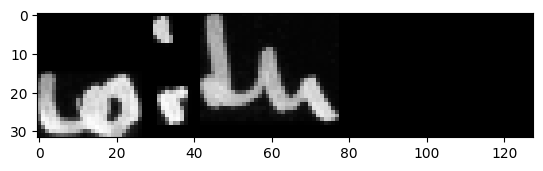



original_text =   bills
predicted text = bills

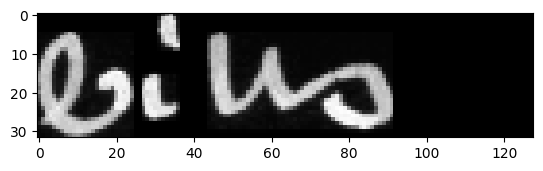



original_text =   of
predicted text = of

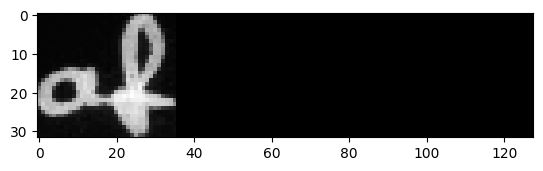



original_text =   cost
predicted text = cost

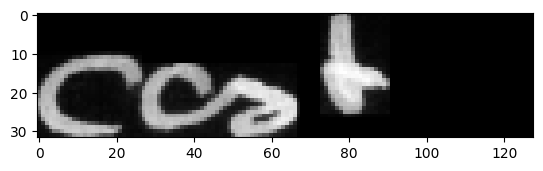



original_text =   .
predicted text = .

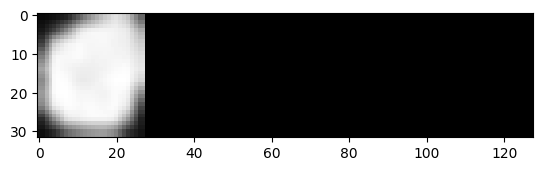



original_text =   We
predicted text = We

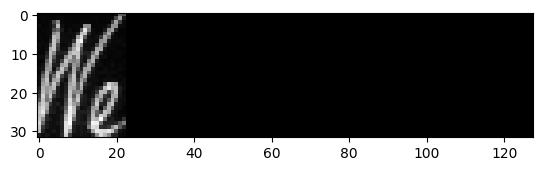



original_text =   believe
predicted text = believe

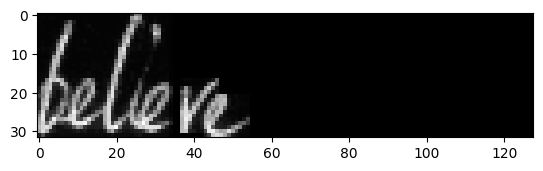



original_text =   that
predicted text = that

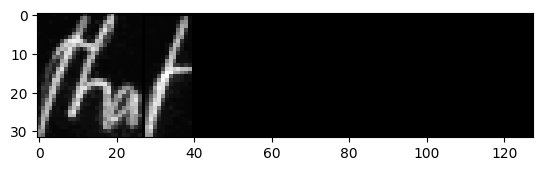



original_text =   comprehensive
predicted text = comprehensive

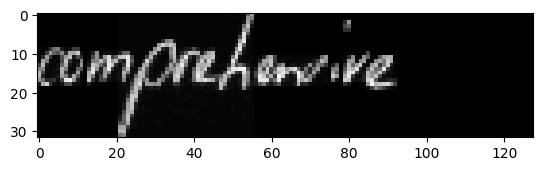



original_text =   medical
predicted text = medical

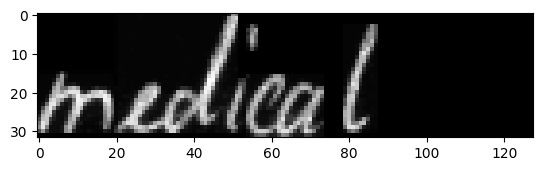



original_text =   service
predicted text = service

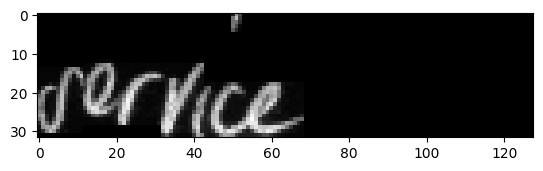



original_text =   ,
predicted text = ,

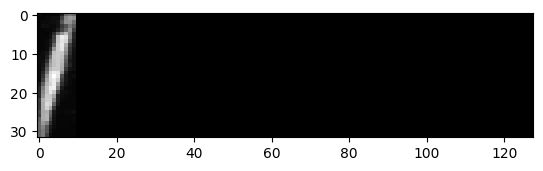



original_text =   free
predicted text = free

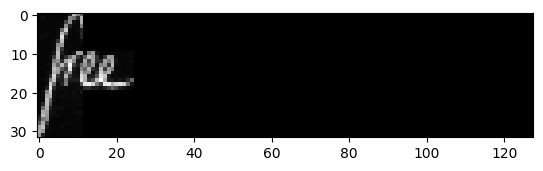



original_text =   to
predicted text = to

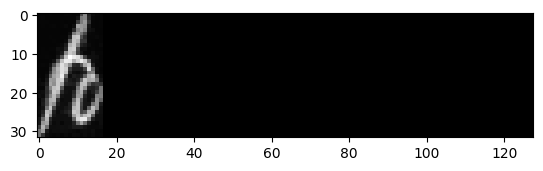



original_text =   the
predicted text = the

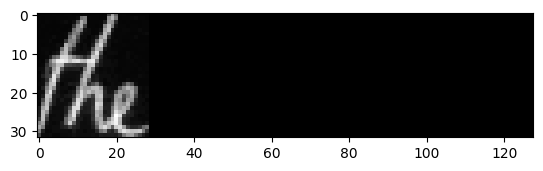



original_text =   patient
predicted text = patient

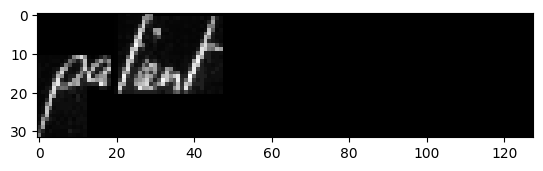



original_text =   at
predicted text = at

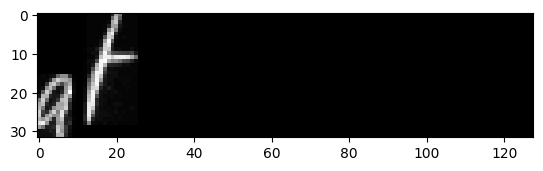



original_text =   point
predicted text = point

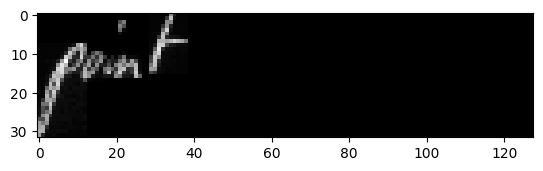



original_text =   of
predicted text = of

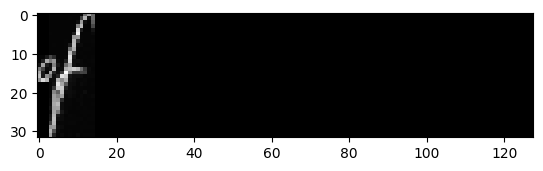



original_text =   need
predicted text = need

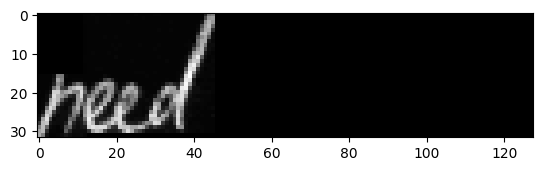



original_text =   and
predicted text = and

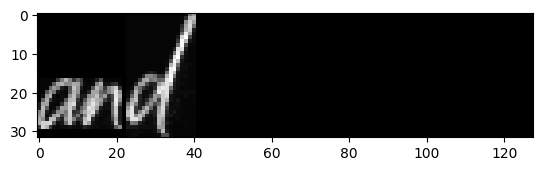



original_text =   with
predicted text = with

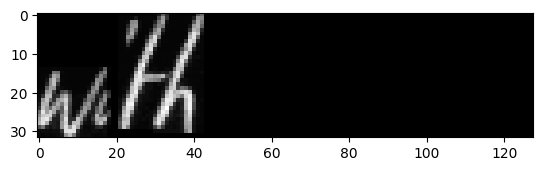



original_text =   one
predicted text = one

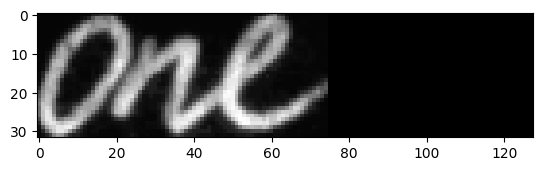



original_text =   standard
predicted text = standard

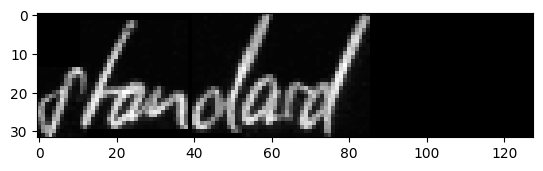



original_text =   for
predicted text = for

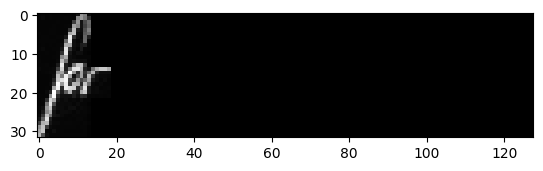



original_text =   all
predicted text = all

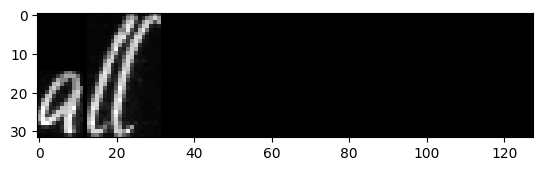



original_text =   The
predicted text = The

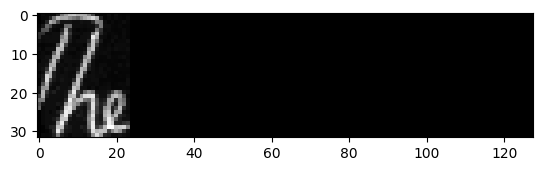



original_text =   jackals
predicted text = jackals

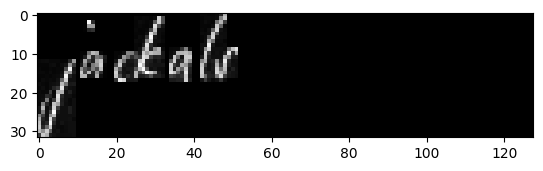



original_text =   bay
predicted text = bay

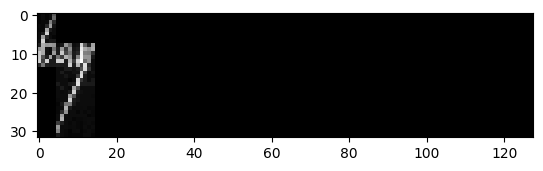



original_text =   when
predicted text = when

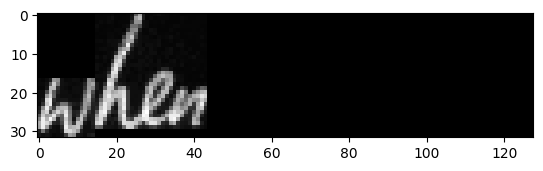



original_text =   there
predicted text = there

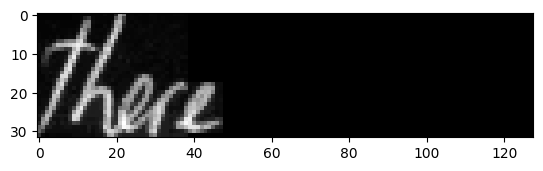



original_text =   is
predicted text = is

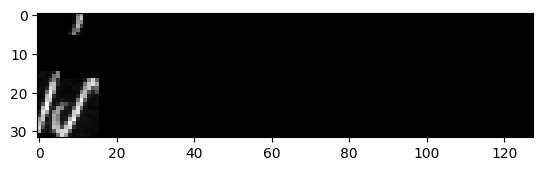



original_text =   nothing
predicted text = nothing

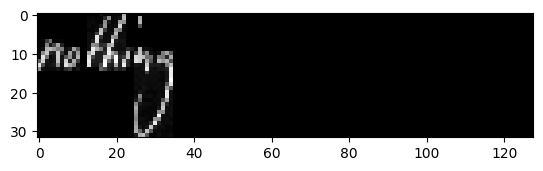



original_text =   better
predicted text = better

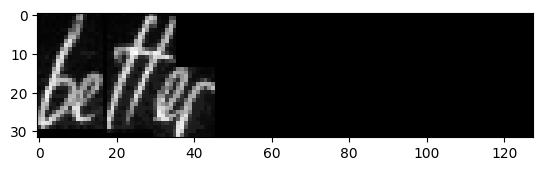



original_text =   they
predicted text = they

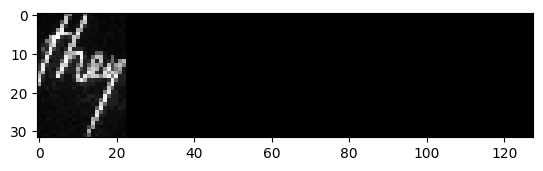



original_text =   do
predicted text = do

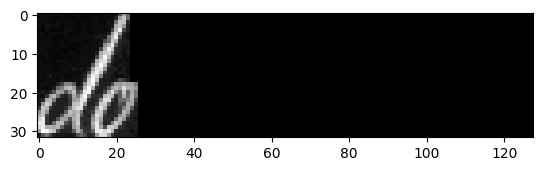



original_text =   .
predicted text = .

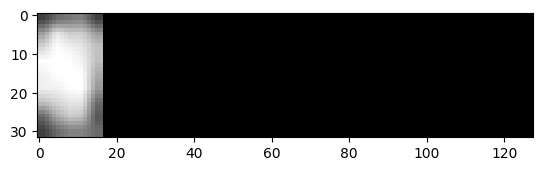



original_text =   "
predicted text = "

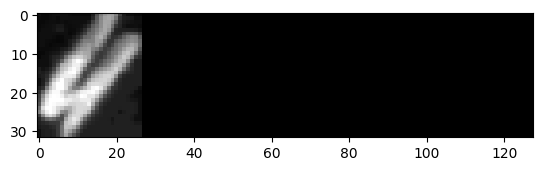



original_text =   "
predicted text = "

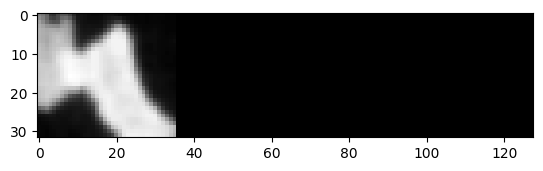



original_text =   We
predicted text = We

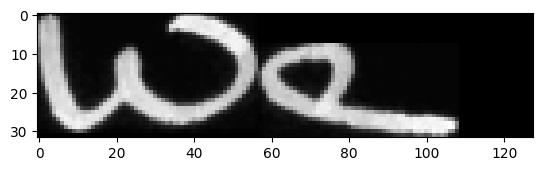



original_text =   believe
predicted text = believe

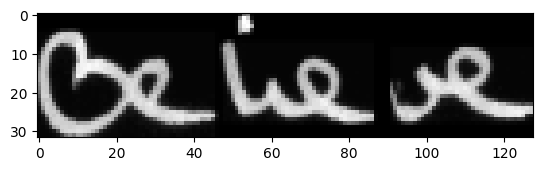



original_text =   that
predicted text = that

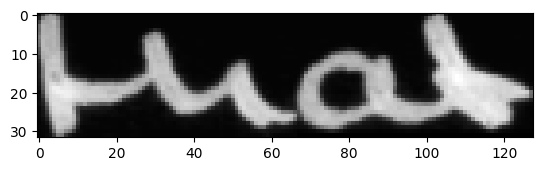



original_text =   a
predicted text = a

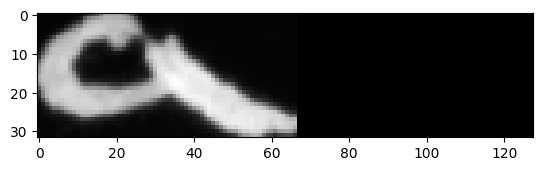



original_text =   comprehensive
predicted text = comprehensive

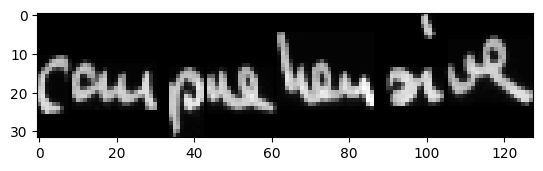



original_text =   need
predicted text = need

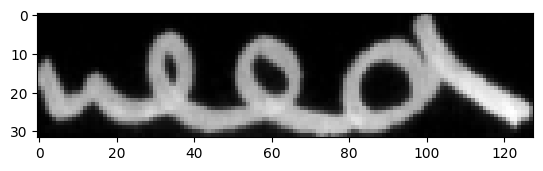



original_text =   and
predicted text = and

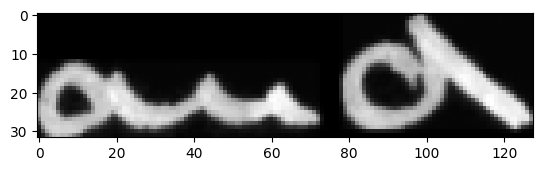



original_text =   with
predicted text = with

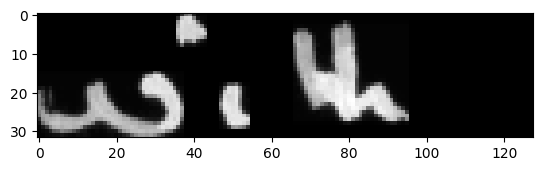



original_text =   one
predicted text = one

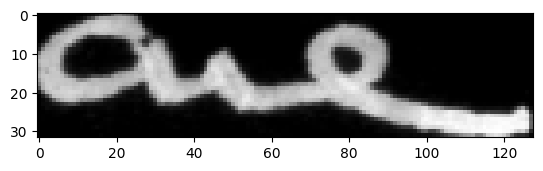



original_text =   standard
predicted text = standard

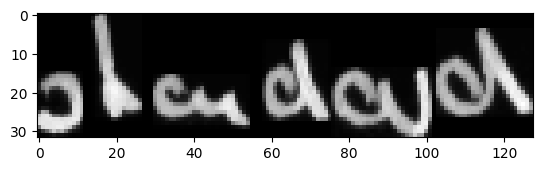



original_text =   for
predicted text = for

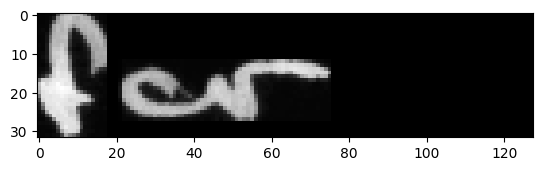



original_text =   all
predicted text = all

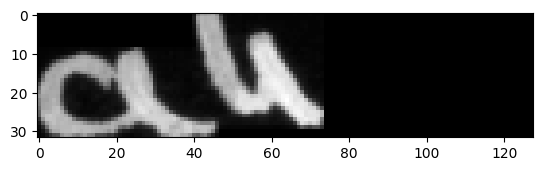



original_text =   sick
predicted text = sick

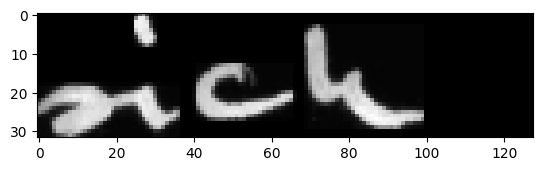



original_text =   people
predicted text = people

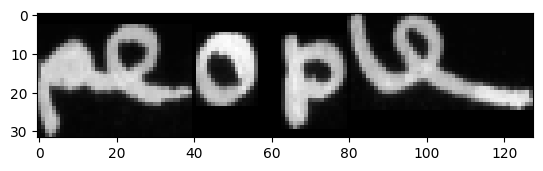



original_text =   is
predicted text = is

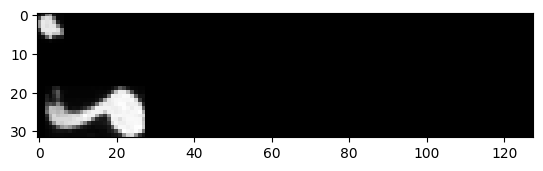



original_text =   good
predicted text = good

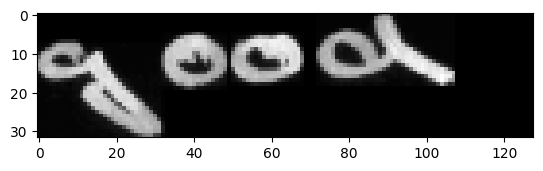



original_text =   and
predicted text = and

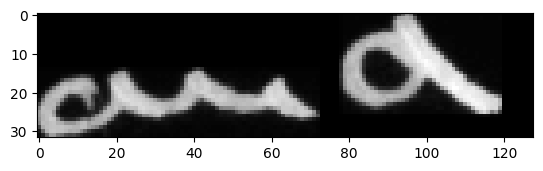



original_text =   attainable
predicted text = attainable

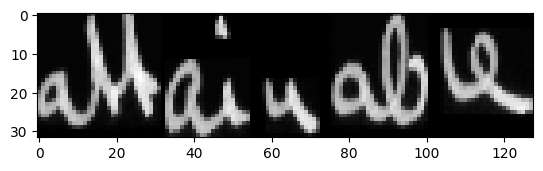



original_text =   .
predicted text = .

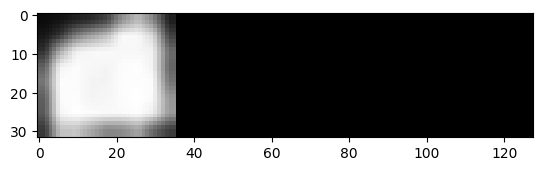



original_text =   "
predicted text = "

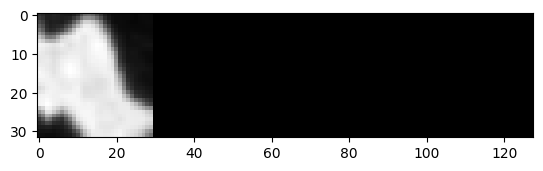



original_text =   We
predicted text = We

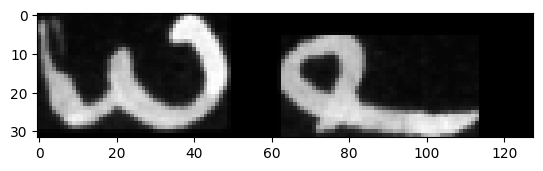



original_text =   remain
predicted text = remain

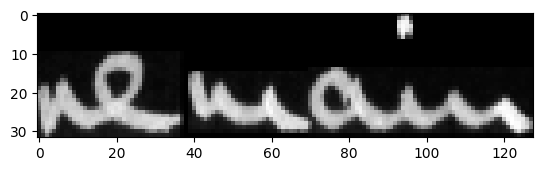



original_text =   for
predicted text = for

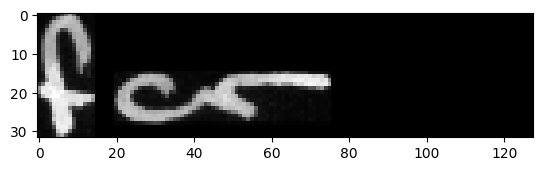



original_text =   .
predicted text = .

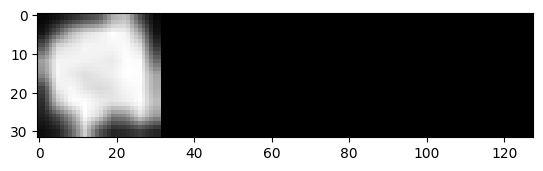



original_text =   But
predicted text = But

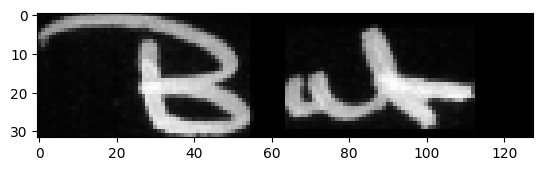



original_text =   the
predicted text = the

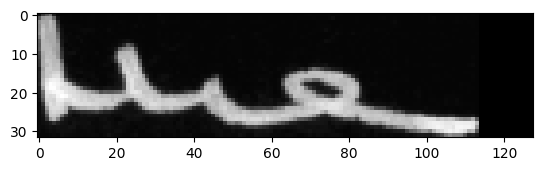



original_text =   Tories
predicted text = Tories

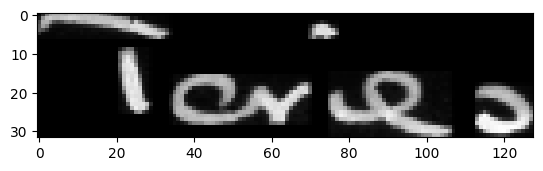



original_text =   never
predicted text = never

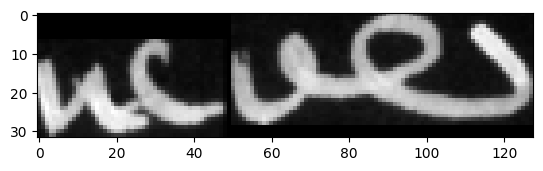



original_text =   were
predicted text = were

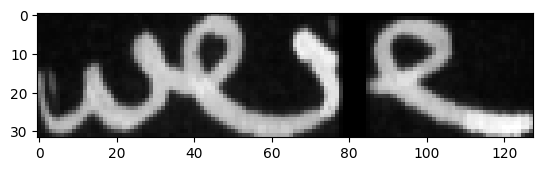



original_text =   .
predicted text = .

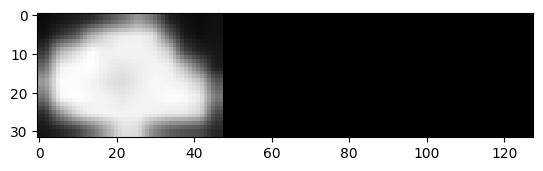



original_text =   "
predicted text = "

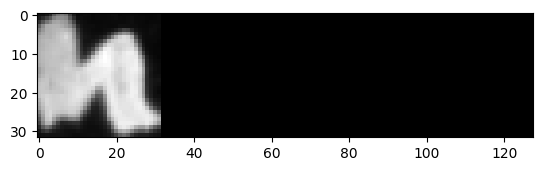



original_text =   Interrupted
predicted text = Interrupted

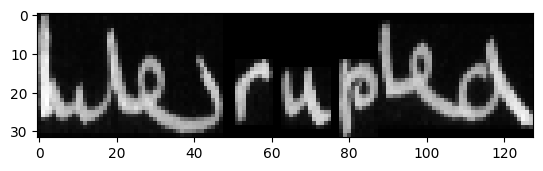



original_text =   angry
predicted text = angry

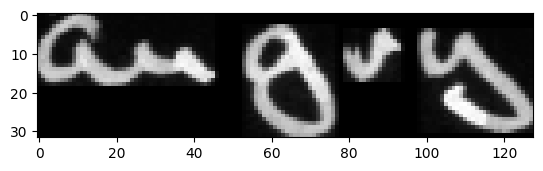



original_text =   Tories
predicted text = Tories

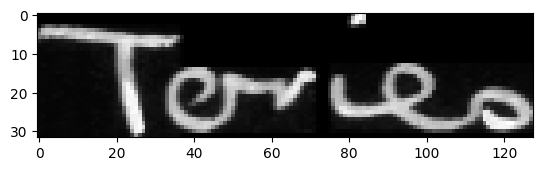



original_text =   ,
predicted text = ,

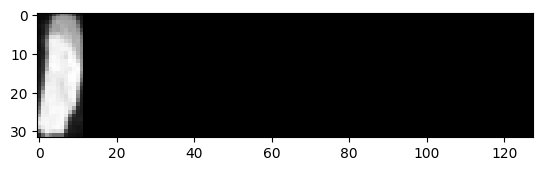



original_text =   Mr.
predicted text = Mr.

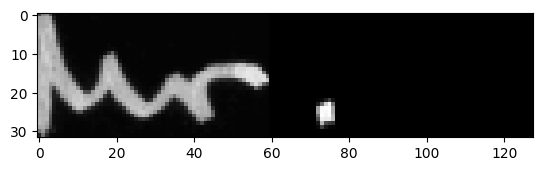



original_text =   Brown
predicted text = Brown

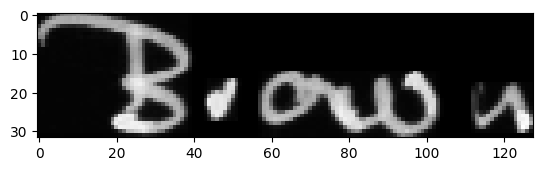



original_text =   retorted
predicted text = retorted

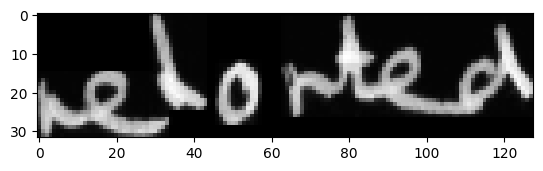



original_text =   :
predicted text = :

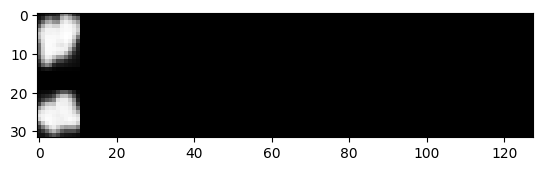



original_text =   "
predicted text = "

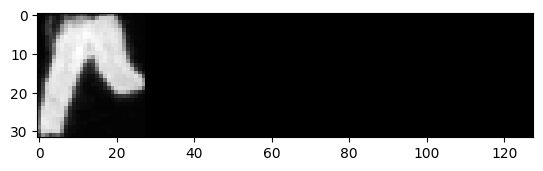



original_text =   The
predicted text = The

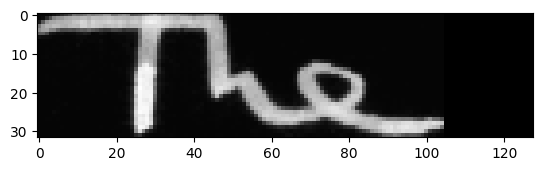



original_text =   bay
predicted text = bay

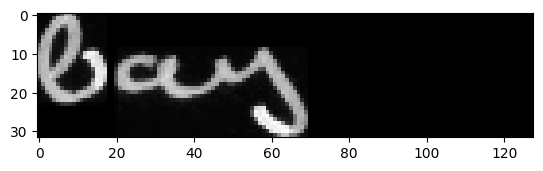



original_text =   when
predicted text = when

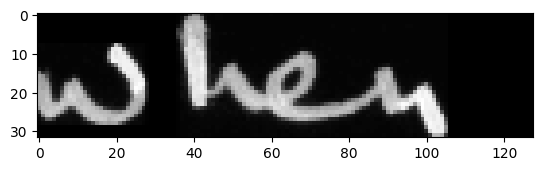



original_text =   there
predicted text = there

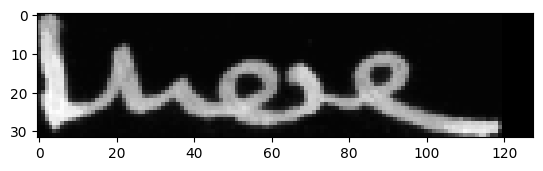



original_text =   is
predicted text = is

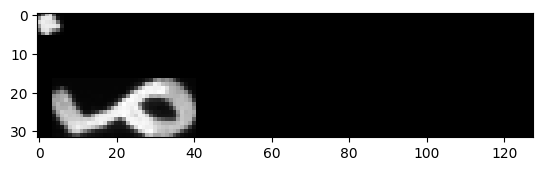



original_text =   nothing
predicted text = nothing

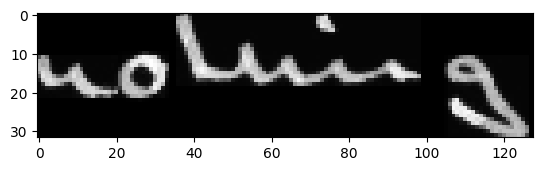



original_text =   better
predicted text = better

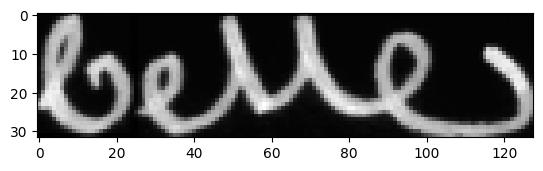



original_text =   they
predicted text = they

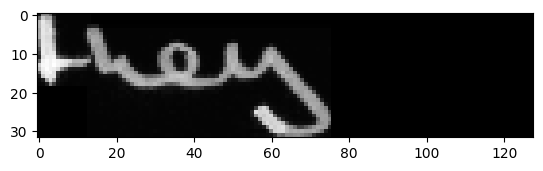



original_text =   can
predicted text = can

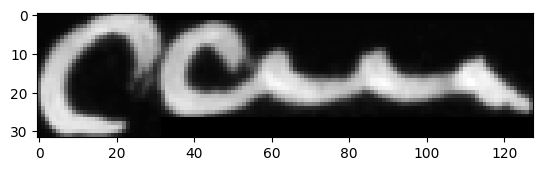



original_text =   do
predicted text = do

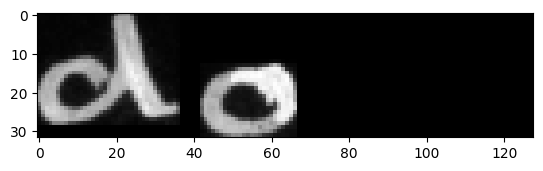



original_text =   "
predicted text = "

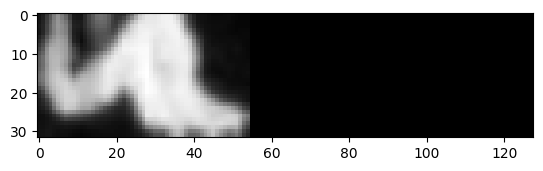



original_text =   He
predicted text = He

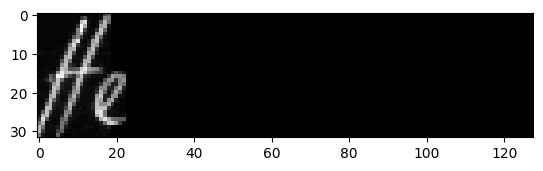



original_text =   told
predicted text = told

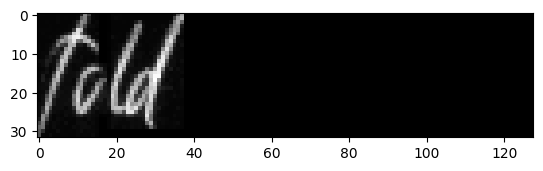



original_text =   them
predicted text = them

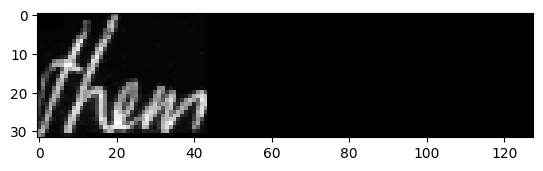



original_text =   that
predicted text = that

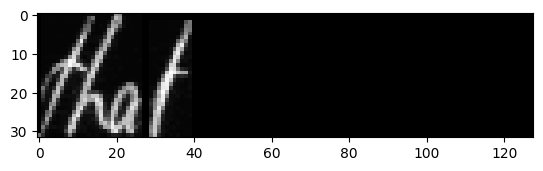



original_text =   their
predicted text = their

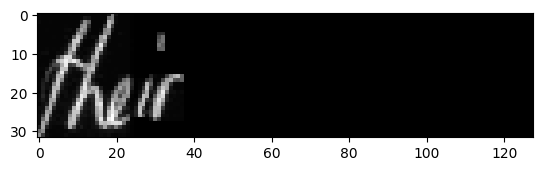



original_text =   conception
predicted text = conception

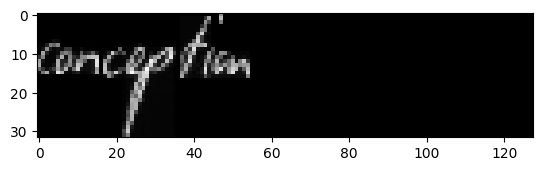



original_text =   of
predicted text = of

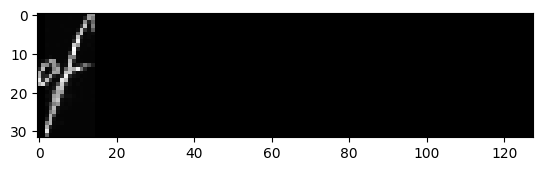



original_text =   social
predicted text = social

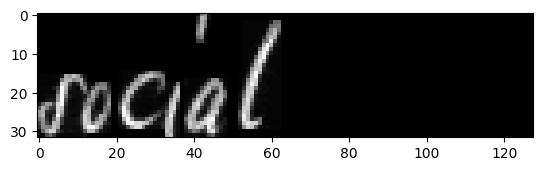



original_text =   was
predicted text = was

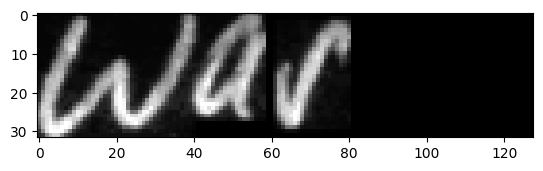



original_text =   wholly
predicted text = whohly

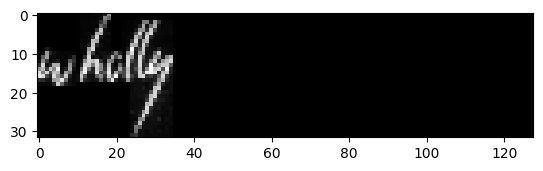



original_text =   different
predicted text = different

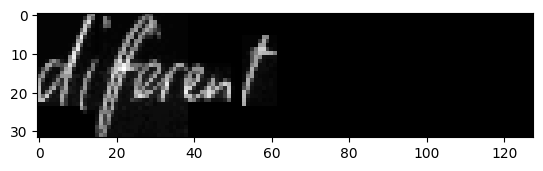



original_text =   -
predicted text = -

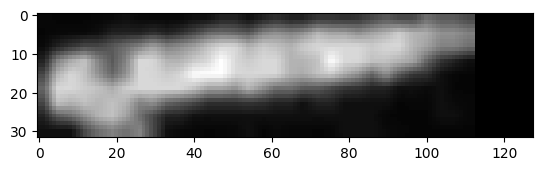



original_text =   fundamentally
predicted text = fundamentally

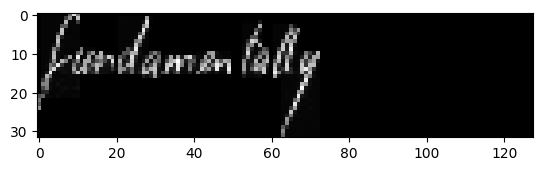



original_text =   different
predicted text = different

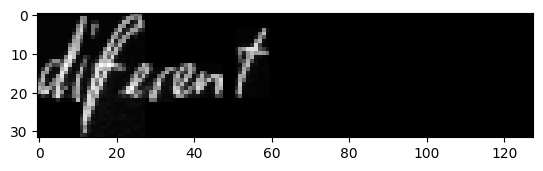



original_text =   from
predicted text = from

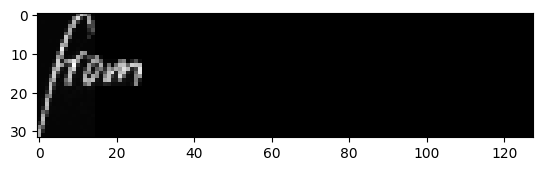



original_text =   that
predicted text = that

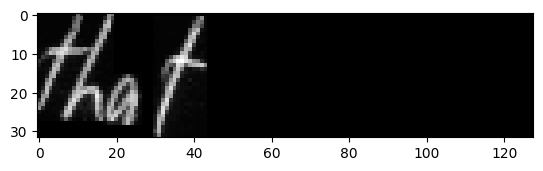



original_text =   of
predicted text = of

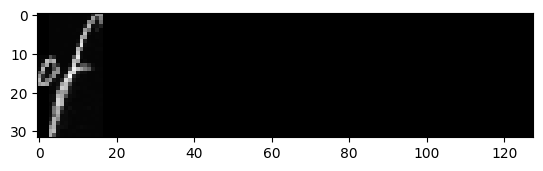



original_text =   .
predicted text = .

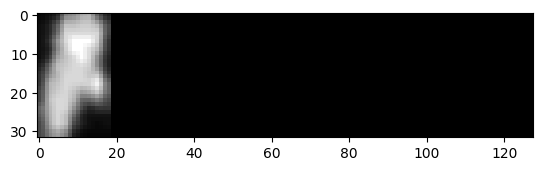



original_text =   They
predicted text = They

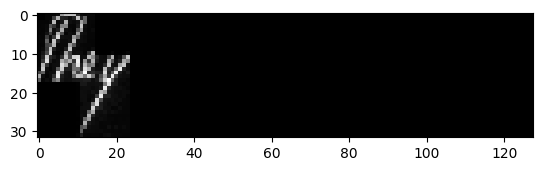



original_text =   would
predicted text = would

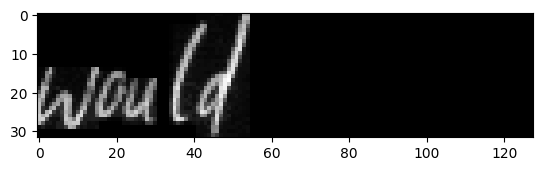



original_text =   provide
predicted text = provide

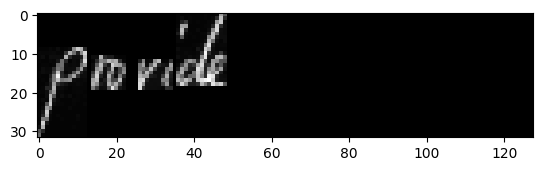



original_text =   an
predicted text = an

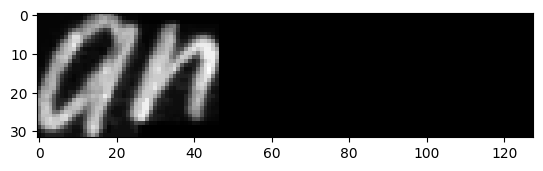



original_text =   ambulance
predicted text = ambulance

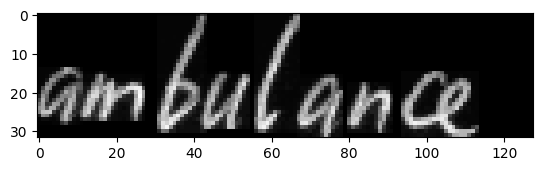



original_text =   service
predicted text = service

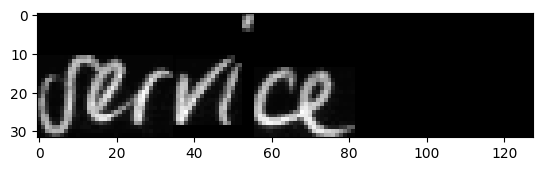



original_text =   for
predicted text = for

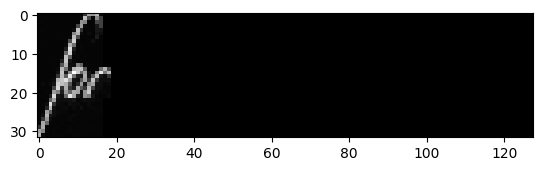



original_text =   the
predicted text = the

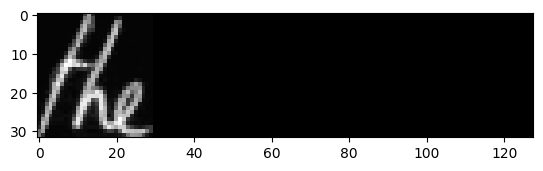



original_text =   wretched
predicted text = wretched

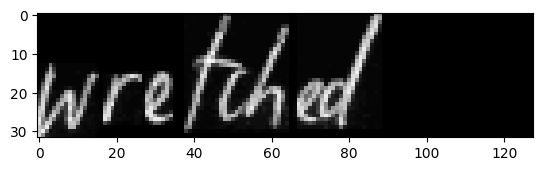



original_text =   -
predicted text = -

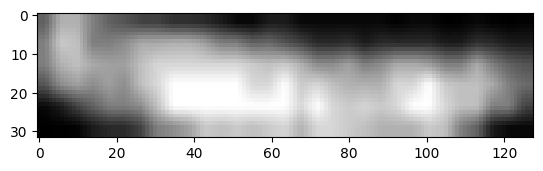



original_text =   but
predicted text = but

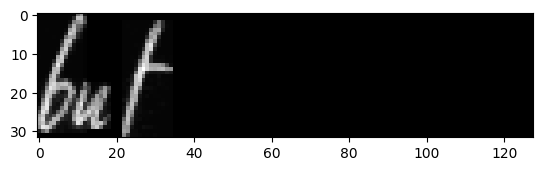



original_text =   it
predicted text = it

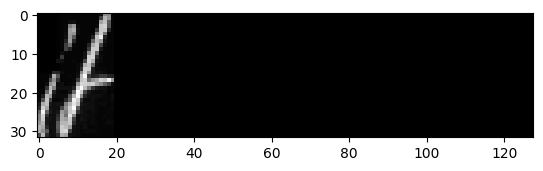



original_text =   would
predicted text = would

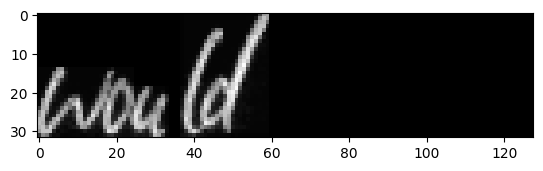



original_text =   not
predicted text = not

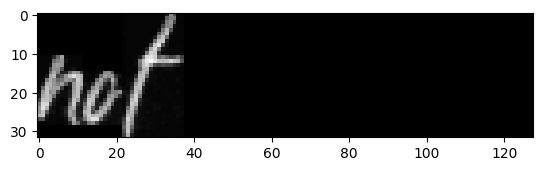



original_text =   be
predicted text = be

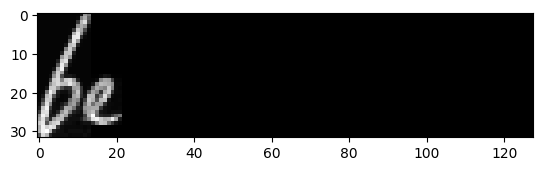



original_text =   too
predicted text = too

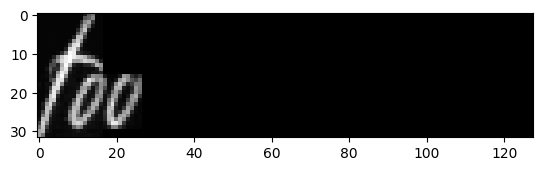



original_text =   comfortable
predicted text = comfortable

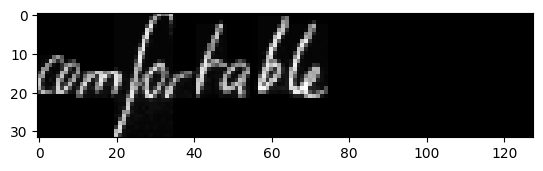



original_text =   too
predicted text = too

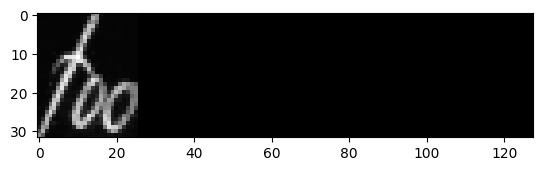



original_text =   easy
predicted text = easy

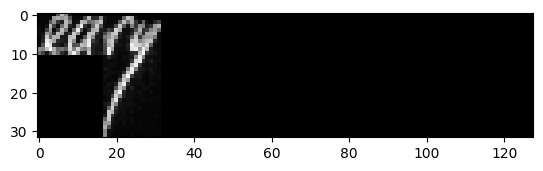



original_text =   to
predicted text = to

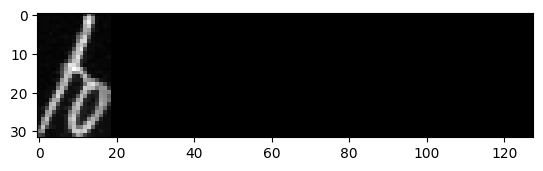



original_text =   get
predicted text = get

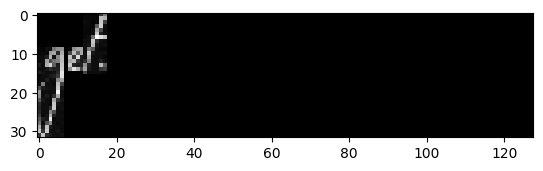



original_text =   .
predicted text = .

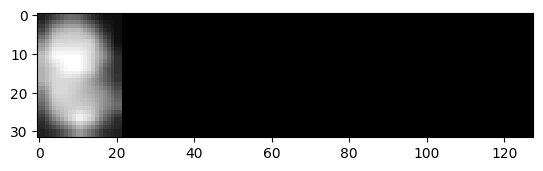



original_text =   Answering
predicted text = Answering

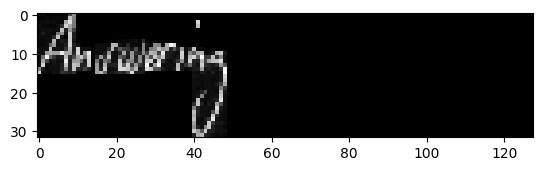



original_text =   jeers
predicted text = jeer

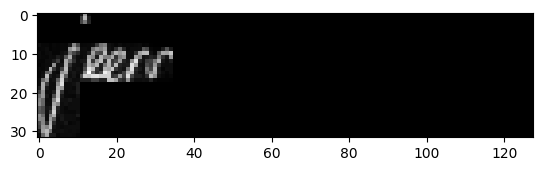



original_text =   that
predicted text = that

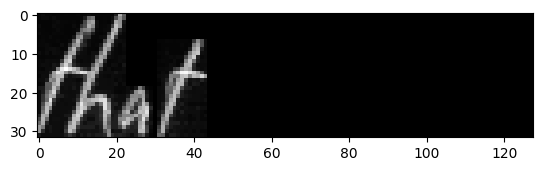



original_text =   it
predicted text = it

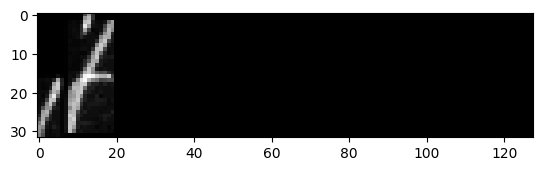



original_text =   Labour
predicted text = Labour

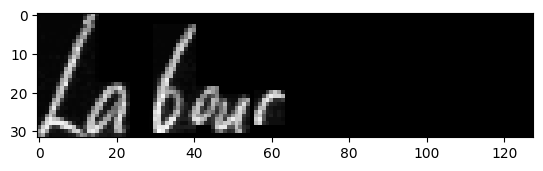



original_text =   which
predicted text = which

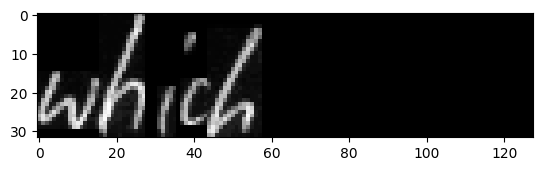



original_text =   first
predicted text = first

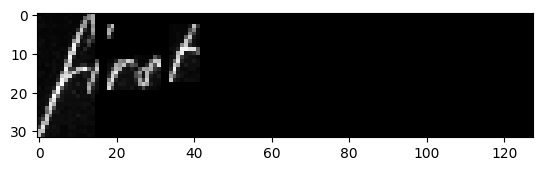



original_text =   put
predicted text = put

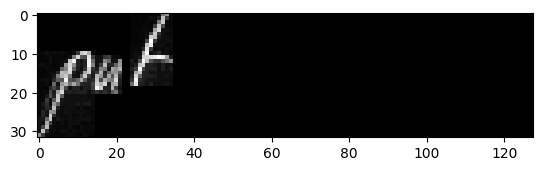



original_text =   a
predicted text = a

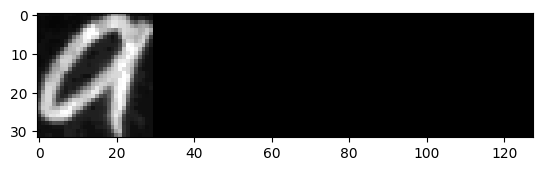



original_text =   ceiling
predicted text = ceiling

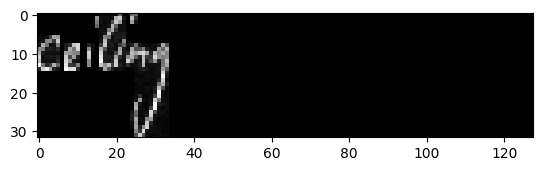



original_text =   on
predicted text = on

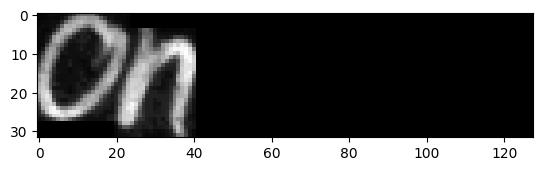



original_text =   health
predicted text = health

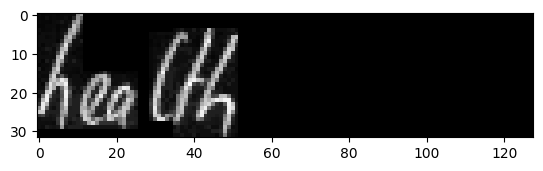



original_text =   spending
predicted text = spending

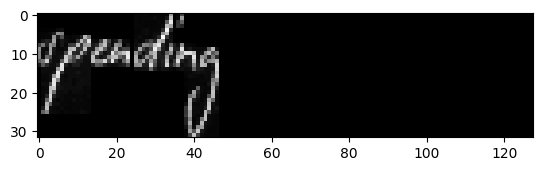



original_text =   started
predicted text = started

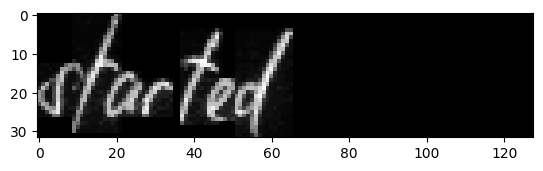



original_text =   charges
predicted text = charges

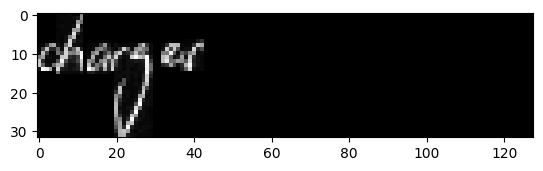



original_text =   ,
predicted text = .

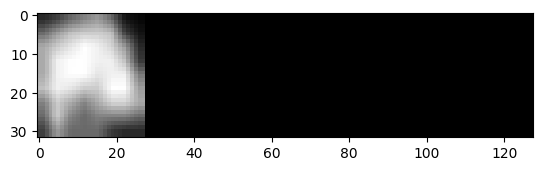



original_text =   Mr.
predicted text = Mr.

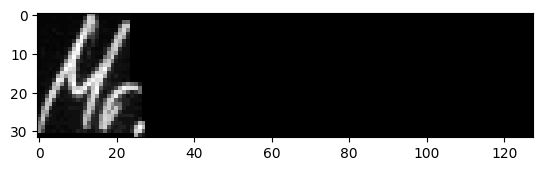



original_text =   Brown
predicted text = Brown

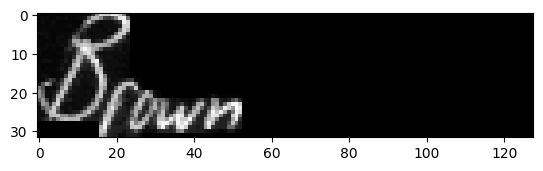



original_text =   reminded
predicted text = reminded

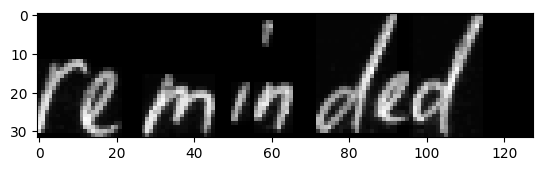



original_text =   the
predicted text = the

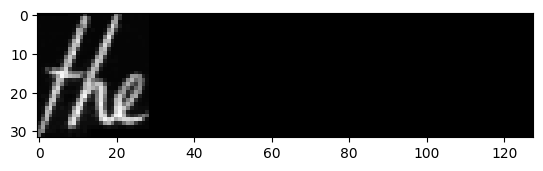



original_text =   hostile
predicted text = hostile

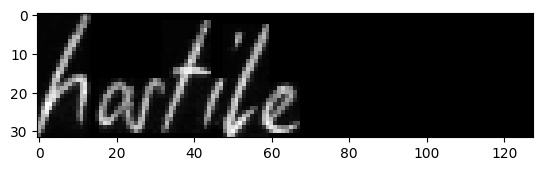



original_text =   Government
predicted text = Government

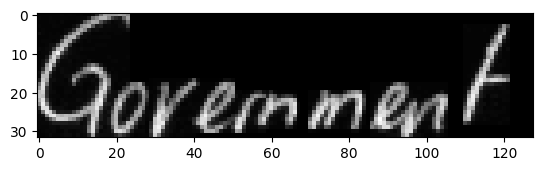



original_text =   that
predicted text = that

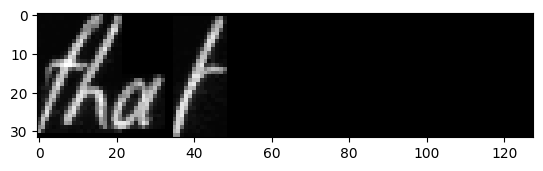



original_text =   was
predicted text = was

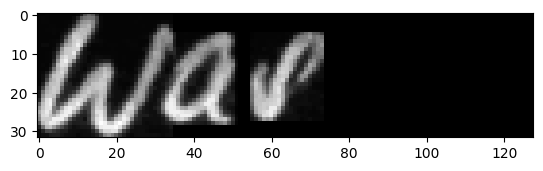



original_text =   done
predicted text = done

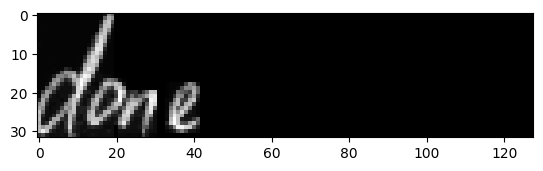



original_text =   in
predicted text = in

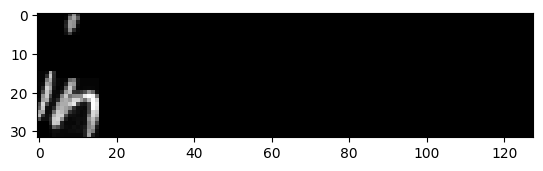



original_text =   1950
predicted text = 1950

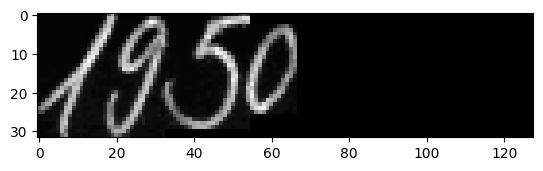



original_text =   because
predicted text = because

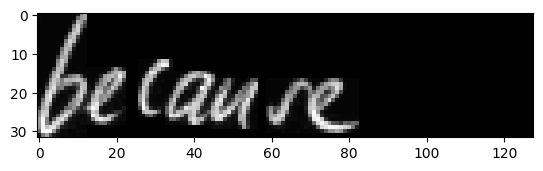



original_text =   of
predicted text = of

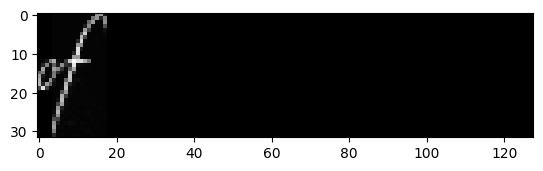



original_text =   the
predicted text = the

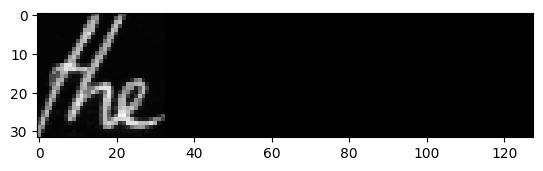



original_text =   financial
predicted text = financial

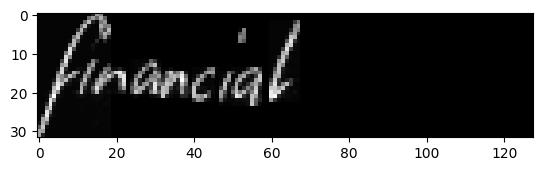



original_text =   of
predicted text = of

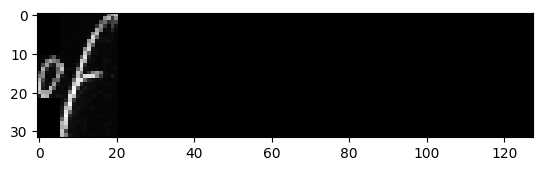



original_text =   the
predicted text = the

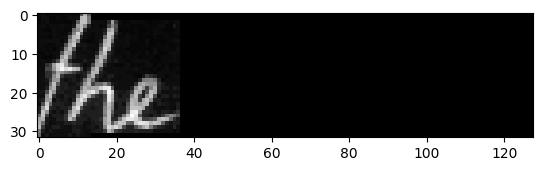



original_text =   Korean
predicted text = Korean

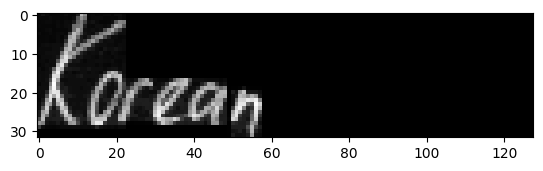



original_text =   war
predicted text = war

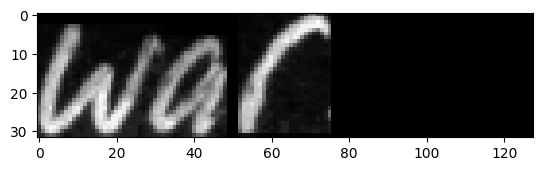



original_text =   .
predicted text = .

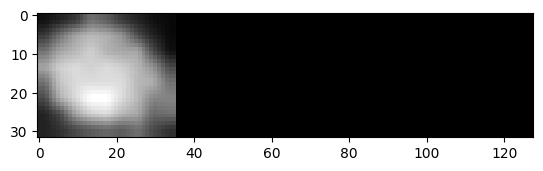



original_text =   He
predicted text = He

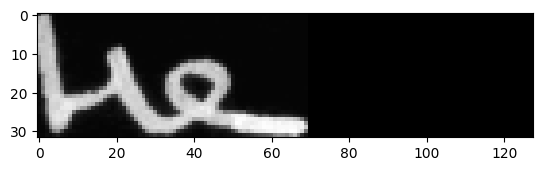



original_text =   told
predicted text = told

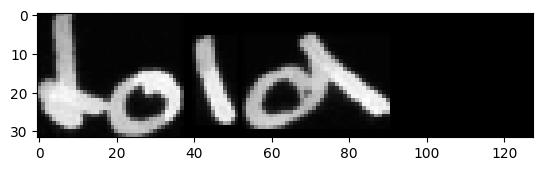



original_text =   them
predicted text = them

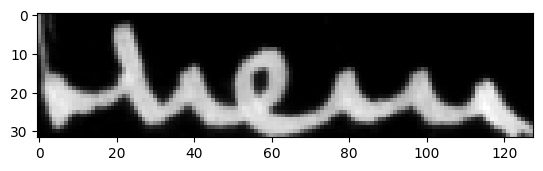



original_text =   that
predicted text = that

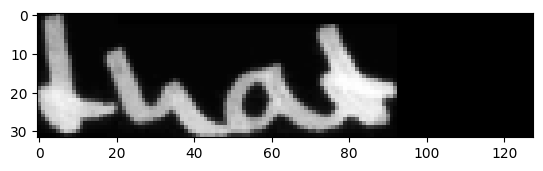



original_text =   conception
predicted text = conception

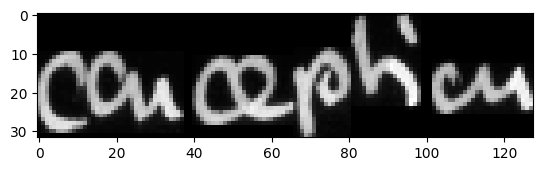



original_text =   of
predicted text = of

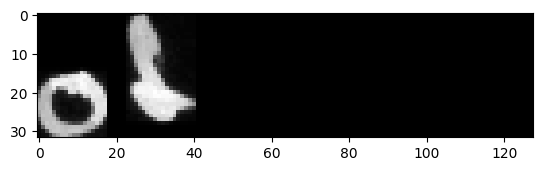



original_text =   social
predicted text = social

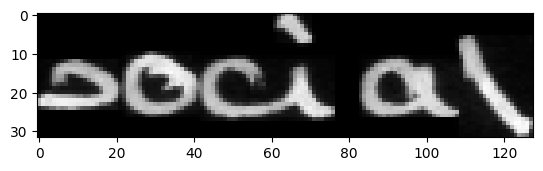



original_text =   services
predicted text = services

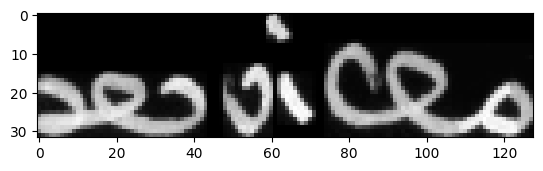



original_text =   was
predicted text = was

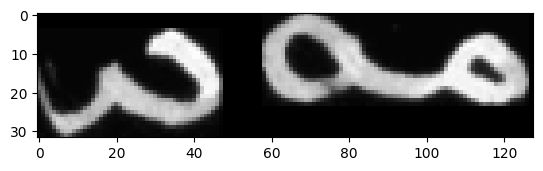



original_text =   wholly
predicted text = wholly

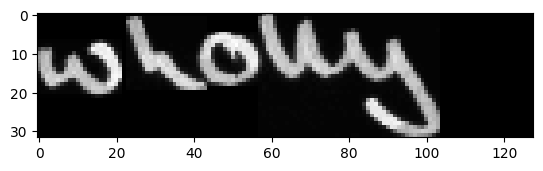



original_text =   different
predicted text = different

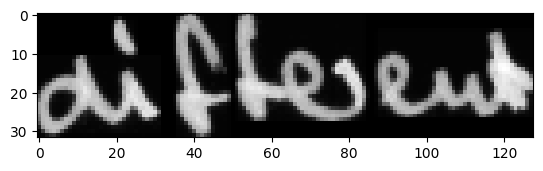



original_text =   -
predicted text = -

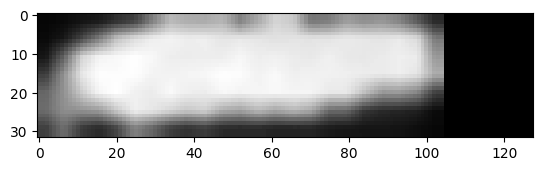



original_text =   fundamentally
predicted text = fundamentally

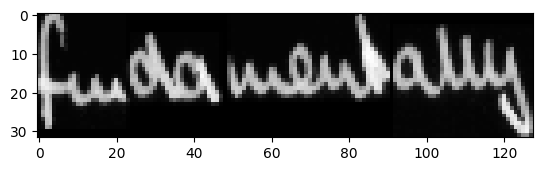



original_text =   from
predicted text = from

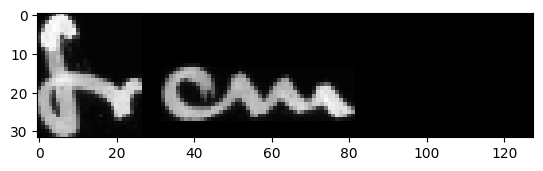



original_text =   that
predicted text = that

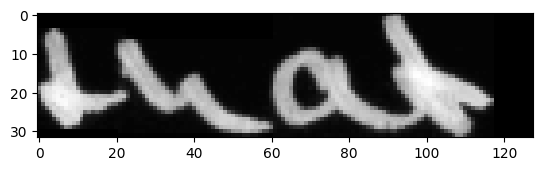



original_text =   of
predicted text = of

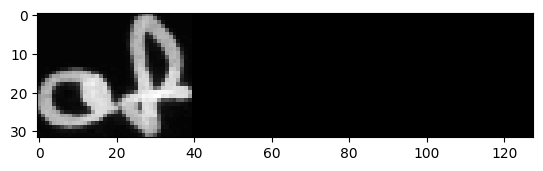



original_text =   Labour
predicted text = Labour

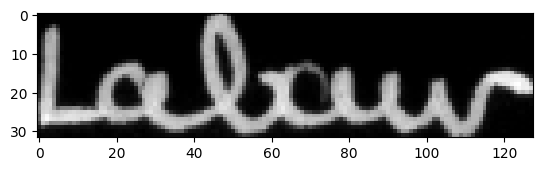



original_text =   .
predicted text = .

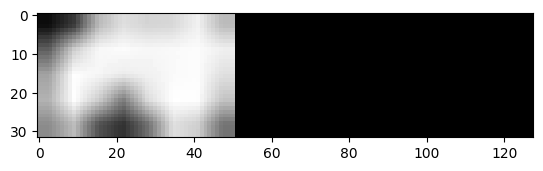



original_text =   They
predicted text = They

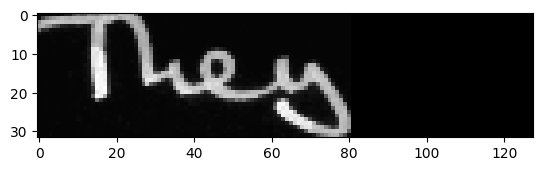



original_text =   would
predicted text = would

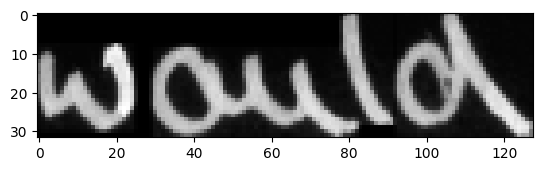



original_text =   provide
predicted text = provide

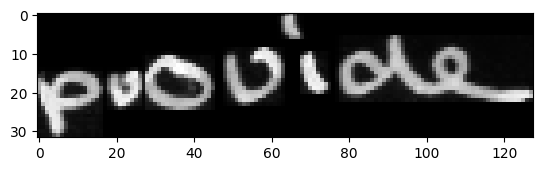



original_text =   an
predicted text = an

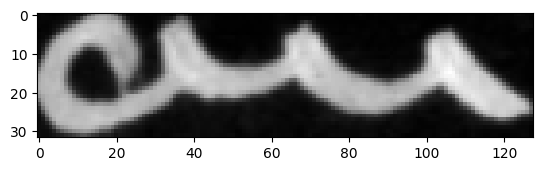



original_text =   service
predicted text = service

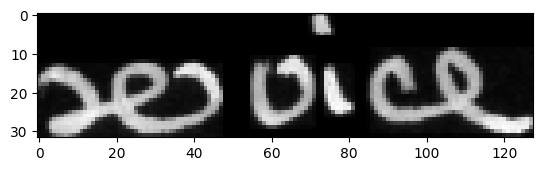



original_text =   for
predicted text = for

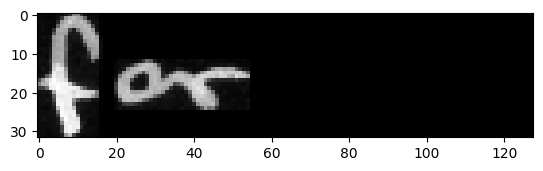



original_text =   the
predicted text = the

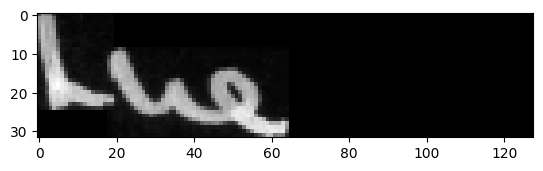



original_text =   absolutely
predicted text = absolutely

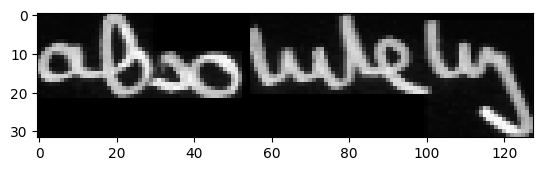



original_text =   wretched
predicted text = wretched

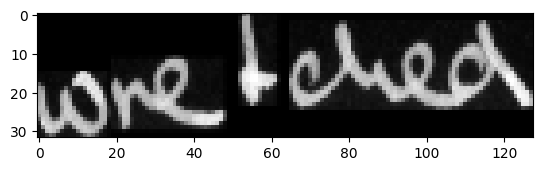



original_text =   -
predicted text = -

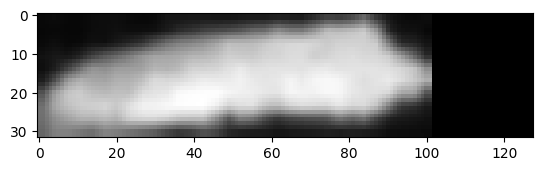



original_text =   but
predicted text = but

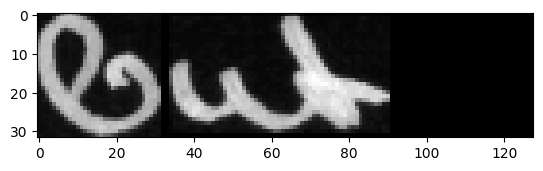



original_text =   it
predicted text = it

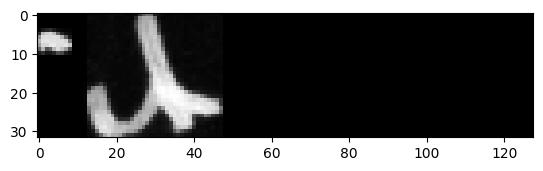



original_text =   would
predicted text = would

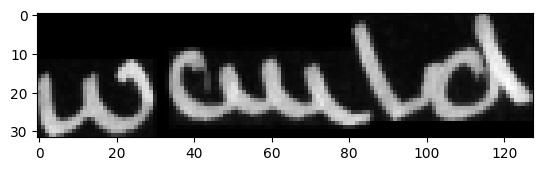



original_text =   be
predicted text = be

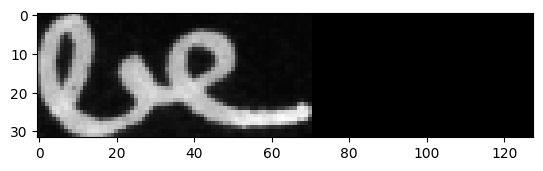



original_text =   too
predicted text = too

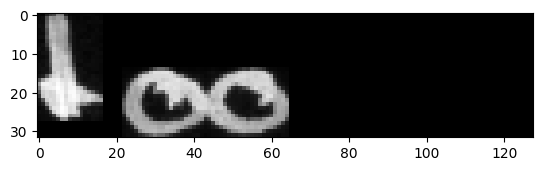



original_text =   comfortable
predicted text = comfortable

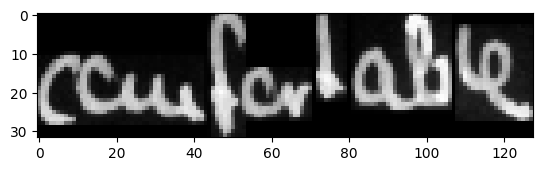



original_text =   nor
predicted text = nor

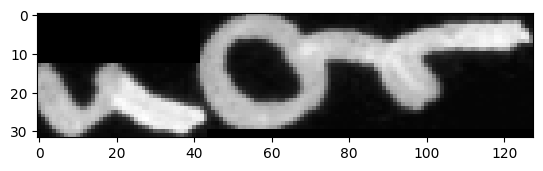



original_text =   too
predicted text = too

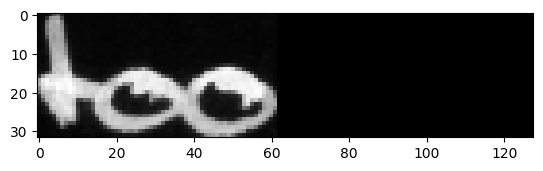



original_text =   easy
predicted text = easy

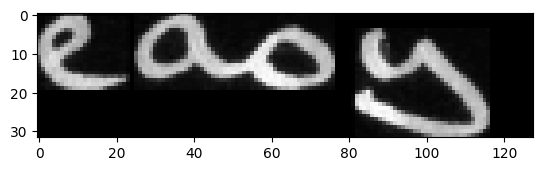



original_text =   to
predicted text = to

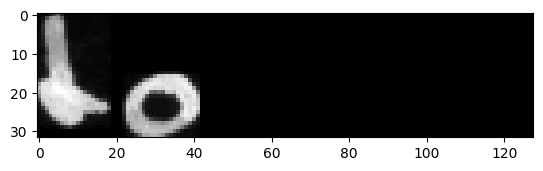



original_text =   get
predicted text = get

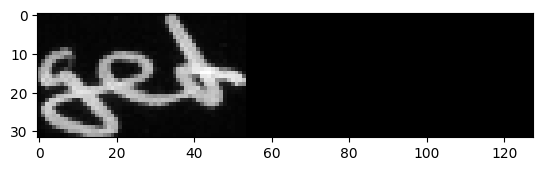



original_text =   .
predicted text = .

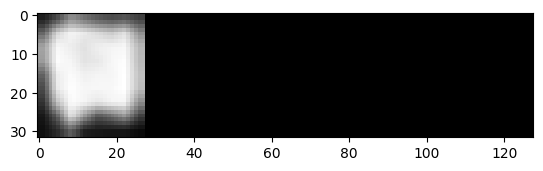



original_text =   jeers
predicted text = jeers

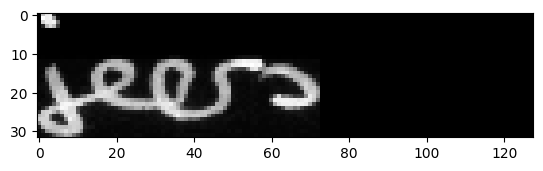



original_text =   that
predicted text = that

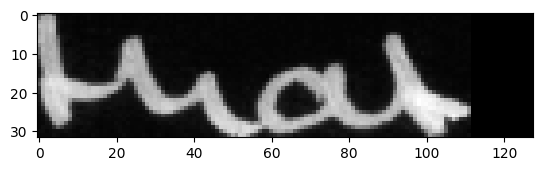



original_text =   it
predicted text = it

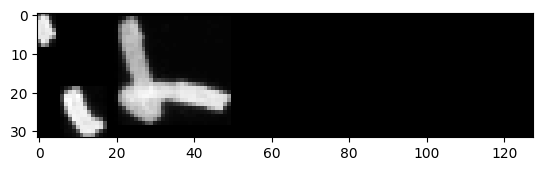



original_text =   was
predicted text = was

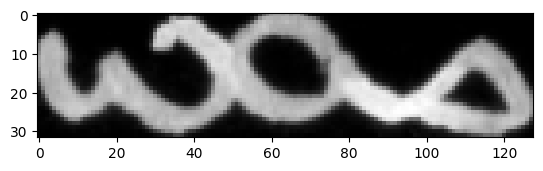



original_text =   Labour
predicted text = Labour

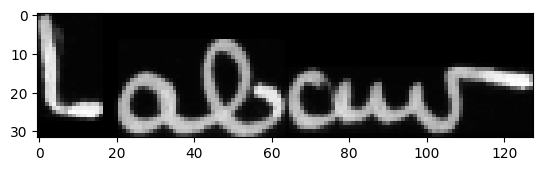



original_text =   which
predicted text = which

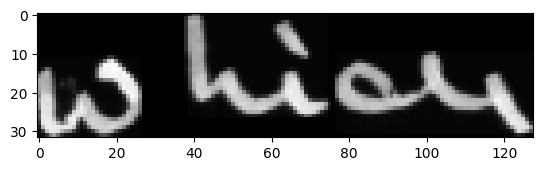



original_text =   first
predicted text = first

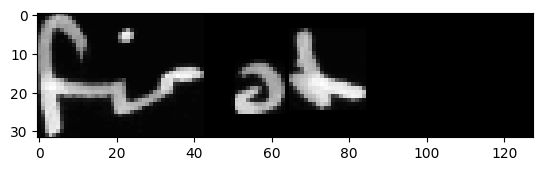



original_text =   put
predicted text = put

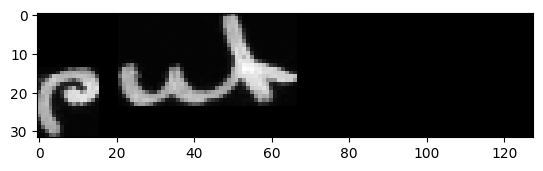



original_text =   a
predicted text = a

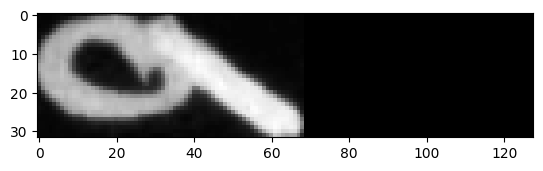



original_text =   on
predicted text = on

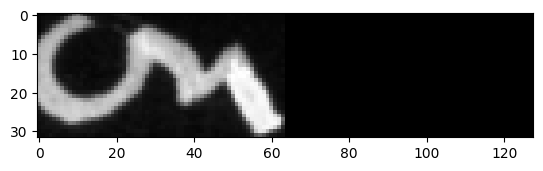



original_text =   health
predicted text = health

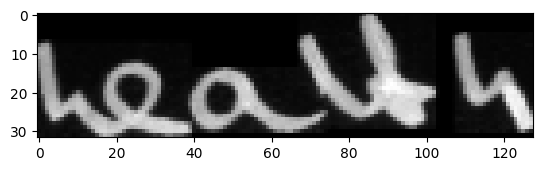



original_text =   spending
predicted text = spending

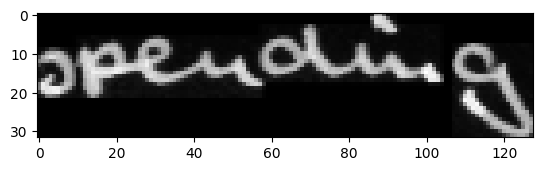



original_text =   and
predicted text = and

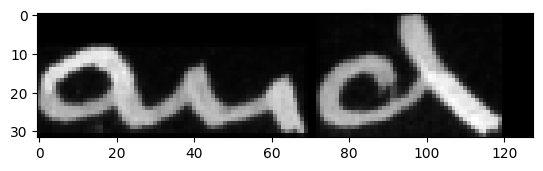



original_text =   started
predicted text = started

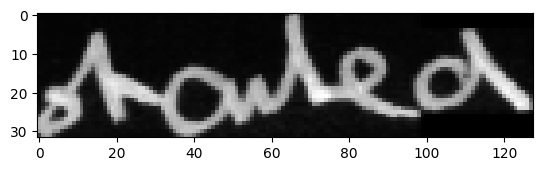



original_text =   charges
predicted text = charges

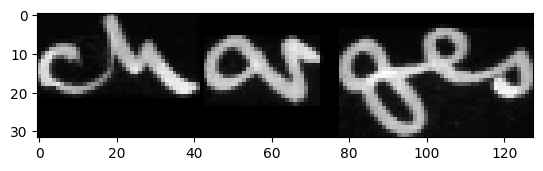



original_text =   ,
predicted text = ,

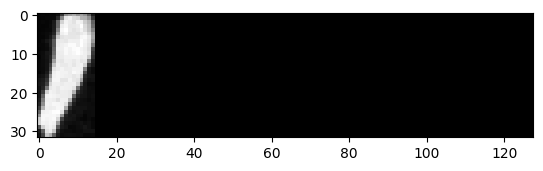



original_text =   Mr.
predicted text = Mr.

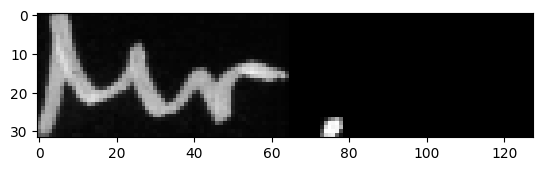



original_text =   Brown
predicted text = Brown

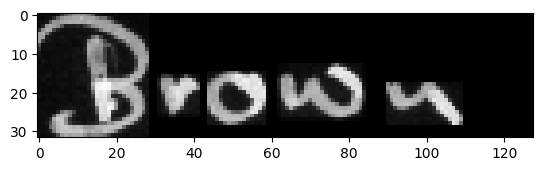



original_text =   the
predicted text = the

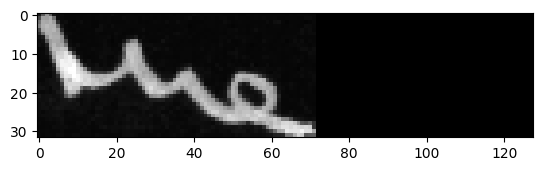



original_text =   hostile
predicted text = hostile

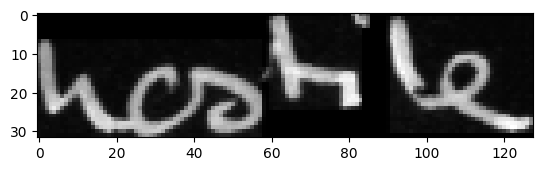



original_text =   Government
predicted text = Government

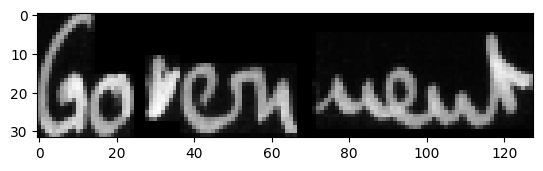



original_text =   benches
predicted text = benches

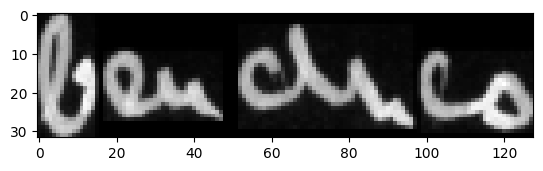



original_text =   that
predicted text = that

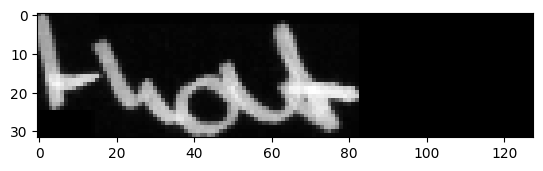



original_text =   was
predicted text = was

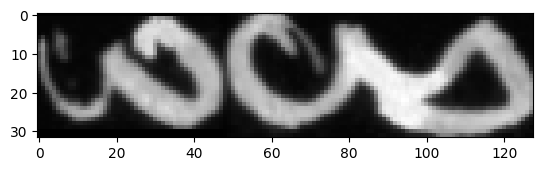



original_text =   done
predicted text = done

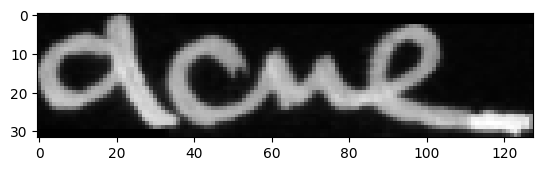



original_text =   in
predicted text = in

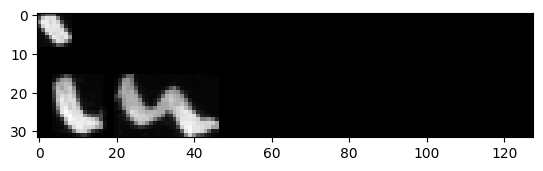



original_text =   1950
predicted text = 1950

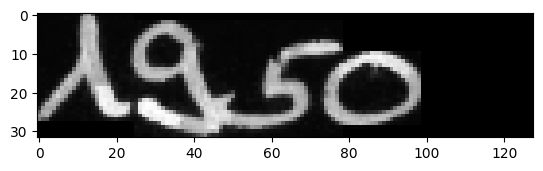



original_text =   of
predicted text = of

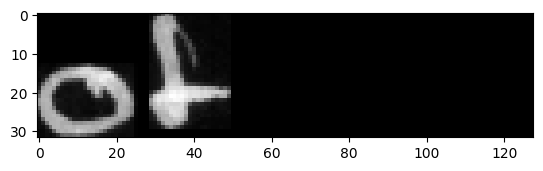



original_text =   the
predicted text = the

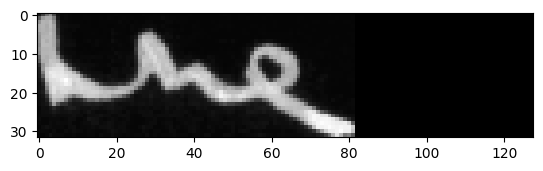



original_text =   financial
predicted text = financial

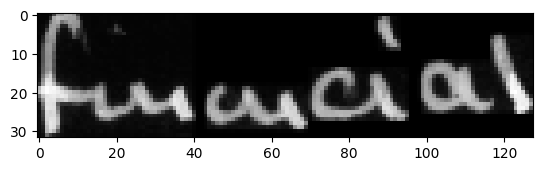



original_text =   strain
predicted text = strain

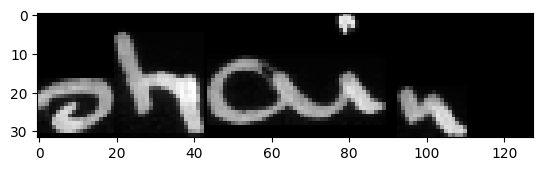



original_text =   of
predicted text = of

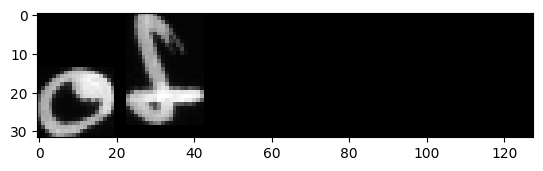



original_text =   the
predicted text = the

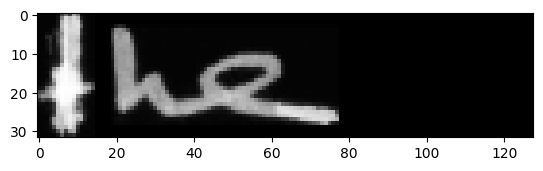



original_text =   Korean
predicted text = Korean

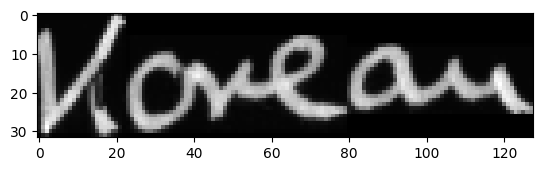



original_text =   war
predicted text = war

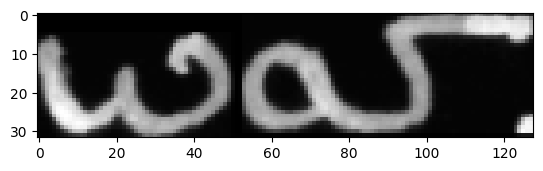



original_text =   .
predicted text = .

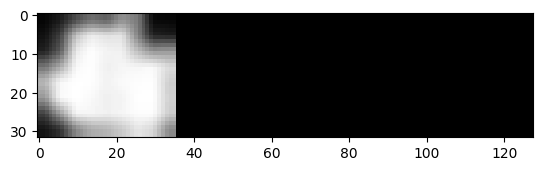



original_text =   needy
predicted text = needy

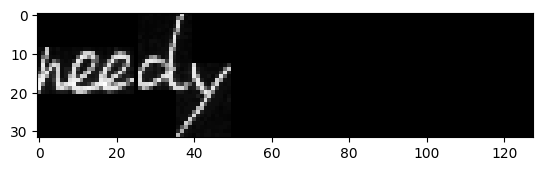

In [57]:
# predict outputs on validation images

prediction =act_model.predict(train_images[2101:3202])

# use CTC decoder
decoded = K.ctc_decode(prediction,   
                       input_length=np.ones(prediction.shape[0]) * prediction.shape[1],
                       greedy=True)[0][0]

out = K.get_value(decoded)

# see the results
for i, x in enumerate(out):
    print("original_text =  ", train_original_text[2101+i])
    print("predicted text = ", end = '')
    for p in x:
        if int(p) != -1:
            print(char_list[int(p)], end = '')
    plt.imshow(train_images[2101+i].reshape(32,128), cmap=plt.cm.gray)
    plt.show()
    print('\n')

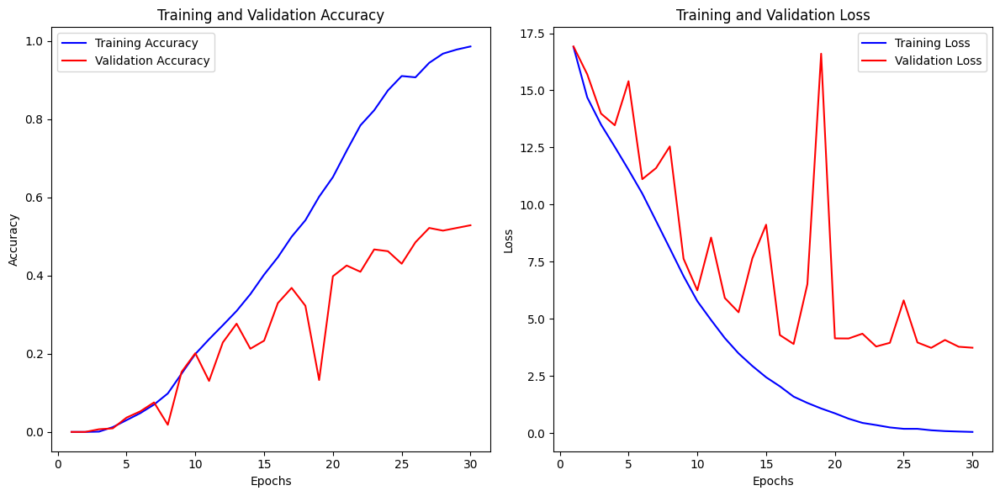

In [58]:
# Extract data from the history object
history  =  pd.read_excel("./working/training_history.xlsx")
history =  pd.DataFrame(history)
acc = history["accuracy"]
val_acc = history["val_accuracy"]
loss = history["loss"]
val_loss = history["val_loss"]
epochs = range(1, len(loss) + 1)

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, "b", label="Training Accuracy")
plt.plot(epochs, val_acc, "r", label="Validation Accuracy")
plt.title("Training and Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, "b", label="Training Loss")
plt.plot(epochs, val_loss, "r", label="Validation Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plot_filename = 'working/Accuracy_Loss_Plot.png'  # Specify the desired file name and extension
plt.savefig(plot_filename)

plt.tight_layout()
plt.show()

In [59]:
minimum_val_loss = np.min(history.history['val_loss'])
best_model_index = np.where(history.history['val_loss'] == minimum_val_loss)[0][0]

best_loss = str(history.history['loss'][best_model_index])
best_acc = str(history.history['accuracy'][best_model_index])
best_val_loss = str(history.history['val_loss'][best_model_index])
best_val_acc = str(history.history['val_accuracy'][best_model_index])

In [61]:
with open('working/history.txt', 'a') as f:
    new_data = '{},{},{},{},{},{},{},{},{},{}\n'.format(filepath, 
                                                      optimizer_name, 
                                                      str(RECORDS_COUNT), 
                                                      e, 
                                                      str(train_images.shape[0]),
                                                      str(valid_images.shape[0]), 
                                                      best_loss, 
                                                      best_acc, 
                                                      best_val_loss, 
                                                      best_val_acc)
    f.write(new_data)

In [62]:
model.save('working/Text_recognizer_Using_CRNN.h5')